In [1]:
!python --version

Python 3.11.13


In [2]:
# display information about available GPU devices
!nvidia-smi

Thu Oct 23 20:57:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8             10W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install codecarbon

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.1/278.1 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.5/92.5 kB 6.3 MB/s eta 0:00:00
  Attempting uninstall: httpx
    Found existing installation: httpx 0.28.1
    Uninstalling httpx-0.28.1:
      Successfully uninstalled httpx-0.28.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 4.1.1 requires pyarrow>=21.0.0, but you have pyarrow 19.0.1 which is incompatible.
tokenizers 0.21.2 requires huggingface-hub<1.0,>=0.16.4, but you have huggingface-hub 1.0.0rc2 which is incompatible.
gradio 5.38.1 requires pydantic<2.12,>=2.0, but you have pydantic 2.12.0a1 which is incompatible.
google-genai 1.27.0 requires httpx<1.0.0,>=0.28.1, bu

In [4]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Define dataset path
dataset_path = "/kaggle/input/dwaste-data-v4-annotated"

# Get class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Initialize counters
class_counts = {cls: 0 for cls in class_folders}
missing_annotations = []
bbox_areas = []


In [5]:
from codecarbon import EmissionsTracker

In [6]:
# Iterate through each class folder
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    for img_file in image_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                class_counts[cls] += len(lines)
                
                for line in lines:
                    _, x_center, y_center, width, height = map(float, line.strip().split())
                    bbox_areas.append(width * height)  # Area of bounding box
        else:
            missing_annotations.append(img_file)

# Print summary
print(f"Total Classes: {len(class_folders)}")
print(f"Total Missing Annotations: {len(missing_annotations)}")
for cls, count in class_counts.items():
    print(f"{cls}: {count} annotations")


Total Classes: 7
Total Missing Annotations: 0
biological: 4498 annotations
cardboard: 2174 annotations
glass: 4993 annotations
metal: 1744 annotations
paper: 2329 annotations
plastic: 2752 annotations
trash: 1210 annotations


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


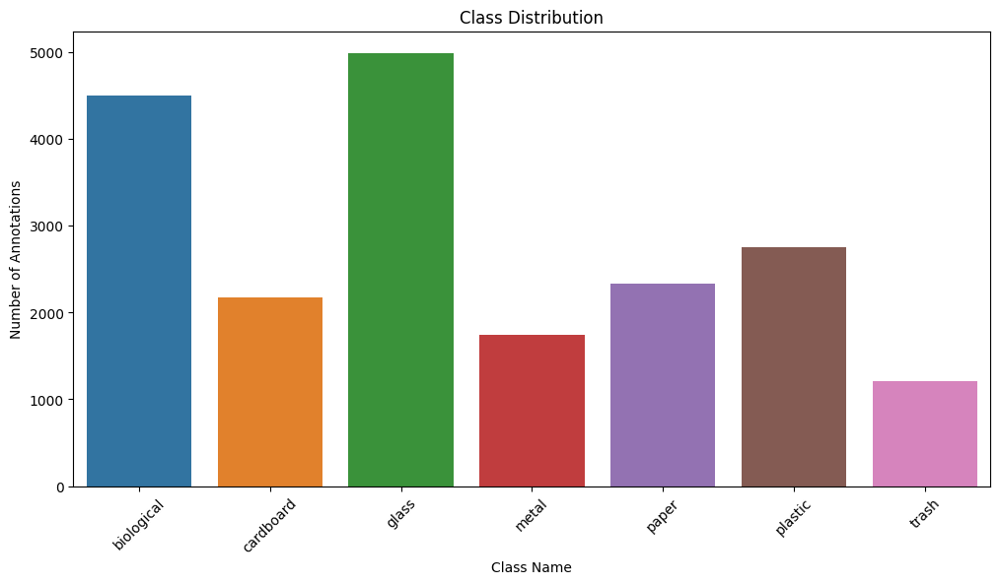

In [7]:
# Plot class distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Number of Annotations")
plt.title("Class Distribution")
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


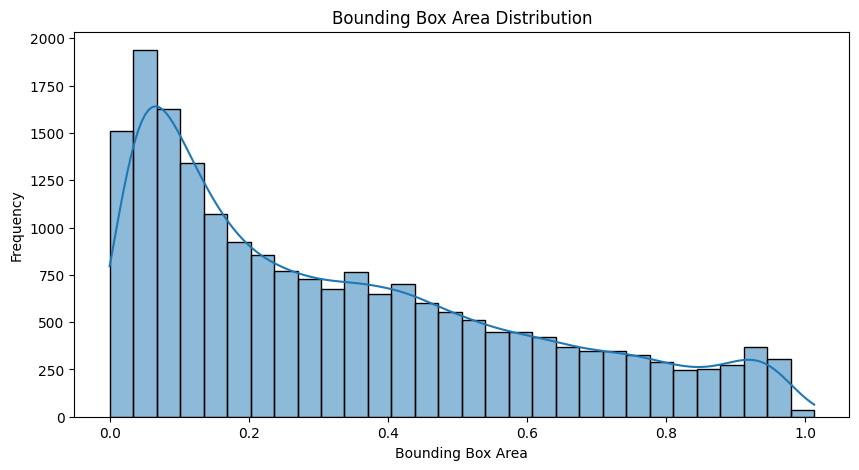

In [8]:
# Plot bounding box area distribution
plt.figure(figsize=(10, 5))
sns.histplot(bbox_areas, bins=30, kde=True)
plt.xlabel("Bounding Box Area")
plt.ylabel("Frequency")
plt.title("Bounding Box Area Distribution")
plt.show()

In [9]:
# Display sample images with annotations
def plot_sample_images(n=5):
    plt.figure(figsize=(15, 10))
    sample_classes = np.random.choice(class_folders, min(n, len(class_folders)), replace=False)

    for i, cls in enumerate(sample_classes):
        class_path = os.path.join(dataset_path, cls)
        image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        if not image_files:
            continue
        img_name = np.random.choice(image_files)
        img_path = os.path.join(class_path, img_name)
        label_path = os.path.join(class_path, os.path.splitext(img_name)[0] + ".txt")

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                h, w, _ = img.shape
                for line in lines:
                    class_id, x_center, y_center, bbox_w, bbox_h = map(float, line.strip().split())
                    x1 = int((x_center - bbox_w / 2) * w)
                    y1 = int((y_center - bbox_h / 2) * h)
                    x2 = int((x_center + bbox_w / 2) * w)
                    y2 = int((y_center + bbox_h / 2) * h)

                    cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(img, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        plt.subplot(1, n, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(cls)

    plt.show()

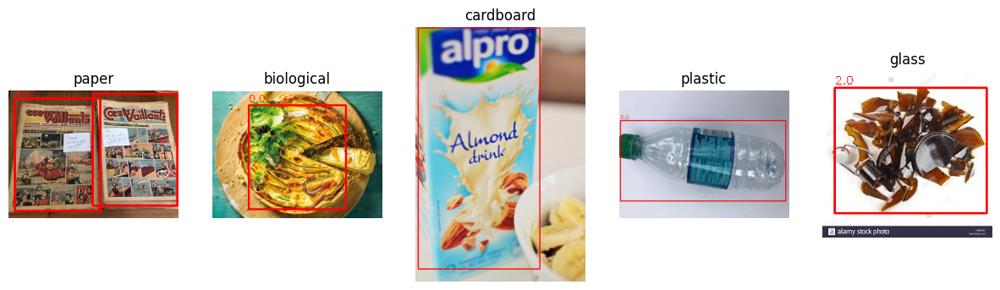

In [10]:
plot_sample_images()

### Since we have a class-imbalance, we will agument the data. 

In [11]:
prepare_data_emission_tracker = EmissionsTracker()
prepare_data_emission_tracker.start()

[codecarbon WARNING @ 20:59:04] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 20:59:04] [setup] RAM Tracking...
[codecarbon INFO @ 20:59:04] [setup] CPU Tracking...
[codecarbon WARNING @ 20:59:06] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 20:59:06] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 20:59:06] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 20:59:06] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 20:59:06] [setup] GPU Tracking...
[codecarbon INFO @ 20:59:06] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 20:59:06] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation mode

In [12]:
experiment_name = "YOLO8n"

In [13]:
# # Paths
# dataset_path = "/kaggle/input/dwaste-data/dwaste-data"
# output_path = "/kaggle/working/combined_dataset"

In [14]:
import os
import cv2
import shutil
import random

# Paths
dataset_path = "/kaggle/input/dwaste-data-v4-annotated"
output_path = "/kaggle/working/combined_dataset"

os.makedirs(output_path, exist_ok=True)

# Define all class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Count images in each class
class_image_counts = {}
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    class_image_counts[cls] = len(images)

# Identify minority classes (less than 75% of max class size)
max_class_count = max(class_image_counts.values())
minority_classes = [cls for cls, count in class_image_counts.items() if count < 0.75 * max_class_count]
minority_class_min = min(class_image_counts[cls] for cls in minority_classes)

print("📊 Class counts:", class_image_counts)
print("🔎 Auto-identified minority classes:", minority_classes)
print("📉 Undersampling all majority classes to:", minority_class_min)

# Track missing annotations
missing_annotations = []

for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    combined_class_path = os.path.join(output_path, cls)
    os.makedirs(combined_class_path, exist_ok=True)

    all_images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Apply undersampling if this is a majority class
    if cls not in minority_classes and len(all_images) > minority_class_min:
        images = random.sample(all_images, minority_class_min)
    else:
        images = all_images

    for img_file in images:
        img_path = os.path.join(class_path, img_file)
        img = cv2.imread(img_path)
        if img is None:
            print(f"❌ Failed to load image: {img_path}")
            continue

        # Copy image
        shutil.copy(img_path, os.path.join(combined_class_path, img_file))

        # Copy label
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(combined_class_path, label_file))
        else:
            missing_annotations.append(img_file)

print(f"✅ Undersampling complete.\n🚫 Missing annotations for {len(missing_annotations)} images.")


📊 Class counts: {'biological': 983, 'cardboard': 1810, 'glass': 3039, 'metal': 994, 'paper': 1650, 'plastic': 1915, 'trash': 772}
🔎 Auto-identified minority classes: ['biological', 'cardboard', 'metal', 'paper', 'plastic', 'trash']
📉 Undersampling all majority classes to: 772


[codecarbon INFO @ 20:59:24] Energy consumed for RAM : 0.000083 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 20:59:24] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:59:24] Energy consumed for All CPU : 0.000177 kWh
[codecarbon INFO @ 20:59:24] Energy consumed for all GPUs : 0.000081 kWh. Total GPU Power : 19.30784037783389 W
[codecarbon INFO @ 20:59:24] 0.000341 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:59:39] Energy consumed for RAM : 0.000167 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 20:59:39] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 20:59:39] Energy consumed for All CPU : 0.000354 kWh
[codecarbon INFO @ 20:59:39] Energy consumed for all GPUs : 0.000161 kWh. Total GPU Power : 19.270936975505677 W
[codecarbon INFO @ 20:59:39] 0.000682 kWh of electricity used since the beginning.
[codecarbon INFO @ 20:59:54] Energy consumed for RAM : 0.000250 kWh. RAM Power : 

✅ Undersampling complete.
🚫 Missing annotations for 0 images.


In [15]:
original_data_path = '/kaggle/input/dwaste-data-v4-annotated'
augmented_data_path = '/kaggle/working/combined_dataset'
# Select a class to visualize
class_to_visualize = "trash"  # Change this to any class

# Get image paths
original_images_path = os.path.join(original_data_path, class_to_visualize)
augmented_images_path = os.path.join(augmented_data_path, class_to_visualize)

# List image files
original_images = [f for f in os.listdir(original_images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
augmented_images = [f for f in os.listdir(augmented_images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Select one image for testing
if not original_images:
    print("No images found in the original dataset.")
else:
    test_image = random.choice(original_images)
    print(f"Selected test image: {test_image}")

def draw_yolo_bboxes(image, annotation_path):
    """Draw bounding boxes from YOLO annotation file on the image."""
    h, w, _ = image.shape
    if os.path.exists(annotation_path):
        with open(annotation_path, "r") as file:
            for line in file:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue  # Skip invalid annotations
                
                class_id, x_center, y_center, bbox_width, bbox_height = map(float, parts)

                # Convert YOLO format (normalized) to pixel coordinates
                x1 = int((x_center - bbox_width / 2) * w)
                y1 = int((y_center - bbox_height / 2) * h)
                x2 = int((x_center + bbox_width / 2) * w)
                y2 = int((y_center + bbox_height / 2) * h)

                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(image, str(class_id), (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    else:
        print(f"Annotation file not found: {annotation_path}")
    
    return image

# Define file paths for original and augmented images
orig_img_path = os.path.join(original_images_path, test_image)
orig_annot_path = orig_img_path.replace(".jpg", ".txt").replace(".jpeg", ".txt").replace(".png", ".txt")

# Find corresponding augmented image
aug_img_name = test_image.replace(".jpg", "_aug_0.jpg").replace(".jpeg", "_aug_0.jpg").replace(".png", "_aug_0.jpg")
aug_img_path = os.path.join(augmented_images_path, aug_img_name)
aug_annot_path = aug_img_path.replace(".jpg", ".txt")

# Load images
if os.path.exists(orig_img_path) and os.path.exists(aug_img_path):
    orig_img = cv2.imread(orig_img_path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    orig_img = draw_yolo_bboxes(orig_img, orig_annot_path)

    aug_img = cv2.imread(aug_img_path)
    aug_img = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)
    aug_img = draw_yolo_bboxes(aug_img, aug_annot_path)

    # Plot images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Original
    axes[0].imshow(orig_img)
    axes[0].set_title("Original with Bounding Boxes")
    axes[0].axis("off")

    # Augmented
    axes[1].imshow(aug_img)
    axes[1].set_title("Augmented with Bounding Boxes")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

else:
    print(f"Missing original or augmented image: {test_image}")


Selected test image: trash_380.jpg
Missing original or augmented image: trash_380.jpg


In [16]:
# Step 1: Check if each image (original + augmented) has a corresponding label
missing_labels = []
for cls in minority_classes:
    combined_class_path = os.path.join(output_path, cls)
    all_images = [f for f in os.listdir(combined_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for img_file in all_images:
        label_file = os.path.join(combined_class_path, os.path.splitext(img_file)[0] + ".txt")
        
        # If label file is missing or empty, log it
        if not os.path.exists(label_file) or os.stat(label_file).st_size == 0:
            missing_labels.append(img_file)



In [17]:
# Step 2: Report missing labels
if missing_labels:
    print(f"⚠️ Missing or empty labels for {len(missing_labels)} images:")
    print(missing_labels)
else:
    print("✅ All images (original + augmented) have valid labels. Proceeding with YOLO training.")



⚠️ Missing or empty labels for 1 images:
['cardboard_1896.jpg']


In [18]:
# Step 2: Create train.txt with all image paths
train_txt_path = os.path.join(output_path, "train.txt")
with open(train_txt_path, "w") as f:
    for cls in class_folders:
        combined_class_path = os.path.join(output_path, cls)
        all_images = [f for f in os.listdir(combined_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        for img_file in all_images:
            f.write(os.path.join(combined_class_path, img_file) + "\n")

print("📂 Training data list created: train.txt")
print("🚀 Ready to train YOLO model!")

📂 Training data list created: train.txt
🚀 Ready to train YOLO model!


In [19]:
# Define paths
dataset_path = "/kaggle/working/combined_dataset"
train_txt_path = os.path.join(dataset_path, "train.txt")
val_txt_path = os.path.join(dataset_path, "val.txt")

# Read train.txt
with open(train_txt_path, "r") as file:
    lines = file.readlines()

# Shuffle and split (80% train, 20% validation)
random.shuffle(lines)
split_idx = int(0.8 * len(lines))
train_lines = lines[:split_idx]
val_lines = lines[split_idx:]

# Save new train.txt and val.txt
with open(train_txt_path, "w") as file:
    file.writelines(train_lines)

with open(val_txt_path, "w") as file:
    file.writelines(val_lines)

print(f"✅ New train.txt: {len(train_lines)} samples")
print(f"✅ New val.txt: {len(val_lines)} samples")


✅ New train.txt: 7116 samples
✅ New val.txt: 1780 samples


In [20]:
prepare_data_emissions: float = prepare_data_emission_tracker.stop()
print(f"Prepare Data Carbon Emissions: {prepare_data_emissions} kg")

[codecarbon INFO @ 21:00:39] Energy consumed for RAM : 0.000499 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:00:39] Delta energy consumed for CPU with constant : 0.000176 kWh, power : 42.5 W
[codecarbon INFO @ 21:00:39] Energy consumed for All CPU : 0.001061 kWh
[codecarbon INFO @ 21:00:39] Energy consumed for all GPUs : 0.000482 kWh. Total GPU Power : 19.303423862461685 W
[codecarbon INFO @ 21:00:39] 0.002042 kWh of electricity used since the beginning.


Prepare Data Carbon Emissions: 0.0009241202891578814 kg


In [21]:
develop_model_emission_tracker = EmissionsTracker()
develop_model_emission_tracker.start()
start_time = time.time()

[codecarbon WARNING @ 21:00:39] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 21:00:39] [setup] RAM Tracking...
[codecarbon INFO @ 21:00:39] [setup] CPU Tracking...
[codecarbon WARNING @ 21:00:40] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 21:00:40] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 21:00:40] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 21:00:40] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 21:00:40] [setup] GPU Tracking...
[codecarbon INFO @ 21:00:40] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 21:00:40] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation mode

In [22]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.220 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6519.8/8062.4 GB disk)


In [23]:
dataset_yaml = f"""
path: /kaggle/working/combined_dataset
train: train.txt
val: val.txt

nc: 7  # Number of classes
names: ["biological", "cardboard", "glass", "metal", "paper", "plastic", "trash"]
"""

# Save dataset.yaml
dataset_yaml_path = "/kaggle/working/combined_dataset/dataset.yaml"
os.makedirs(os.path.dirname(dataset_yaml_path), exist_ok=True)

with open(dataset_yaml_path, "w") as file:
    file.write(dataset_yaml)

print(f"Dataset YAML saved at: {dataset_yaml_path}")


Dataset YAML saved at: /kaggle/working/combined_dataset/dataset.yaml


In [24]:
# Define dataset path
dataset_path = "/kaggle/working/combined_dataset"

# Get class folders
class_folders = sorted([f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))])

# Initialize counters
updated_class_counts = {cls: 0 for cls in class_folders}

# Iterate through each class folder
for cls in class_folders:
    class_path = os.path.join(dataset_path, cls)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    
    for img_file in image_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"
        label_path = os.path.join(class_path, label_file)

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                lines = f.readlines()
                updated_class_counts[cls] += len(lines)  # Count number of bounding boxes

# Print the updated dataset summary
print("Updated Annotation Counts After Augmentation:")
for cls, count in updated_class_counts.items():
    print(f"{cls}: {count} annotations")

# Total annotations after augmentation
total_annotations = sum(updated_class_counts.values())
print(f"\nTotal Annotations in Combined Dataset: {total_annotations}")


Updated Annotation Counts After Augmentation:
biological: 4498 annotations
cardboard: 2174 annotations
glass: 1249 annotations
metal: 1744 annotations
paper: 2329 annotations
plastic: 2752 annotations
trash: 1210 annotations

Total Annotations in Combined Dataset: 15956


In [25]:

# Compute class weights using inverse frequency
total_annotations = sum(updated_class_counts.values())

class_weights = {
    cls: round(total_annotations / (count + 1e-6), 4)  # Avoid division by zero
    for cls, count in updated_class_counts.items()
}

# Normalize weights (optional, keeps them between 0 and 1)
max_weight = max(class_weights.values())
class_weights = {cls: round(w / max_weight, 4) for cls, w in class_weights.items()}

# Print computed class weights
print("\nComputed Class Weights for YOLO:")
for cls, weight in class_weights.items():
    print(f"{cls}: {weight}")


Computed Class Weights for YOLO:
biological: 0.269
cardboard: 0.5566
glass: 0.9688
metal: 0.6938
paper: 0.5195
plastic: 0.4397
trash: 1.0


In [26]:
import yaml
# Load the existing YAML file
with open(dataset_yaml_path, "r") as f:
    yaml_data = yaml.safe_load(f)

# Add or update class weights
yaml_data["weights"] = list(class_weights.values())

# Add scale and image size
# yaml_data["scale"] = [0.00392156862745098, 0.00392156862745098, 0.00392156862745098]
# yaml_data["imgsz"] = [320, 224]

# Write the updated YAML file
with open(dataset_yaml_path, "w") as f:
    yaml.dump(yaml_data, f, default_flow_style=False)

print("\n✅ Updated class weights applied to dataset.yaml successfully!")



✅ Updated class weights applied to dataset.yaml successfully!


In [27]:
# EfficientNet-inspired backbone with custom head
efficient_style_yaml = """
# EfficientNet-style Backbone with Custom Head
nc: 7
depth_multiple: 0.67   # Deeper network
width_multiple: 0.75   # Wider channels

backbone:
  # EfficientNet-style progressive scaling
  - [-1, 1, Conv, [32, 3, 2]]     # 0-P1/2
  - [-1, 1, Conv, [64, 3, 1]]     # 1
  - [-1, 2, C2f, [64]]            # 2
  - [-1, 1, Conv, [128, 3, 2]]    # 3-P2/4
  - [-1, 3, C2f, [128]]           # 4
  - [-1, 1, Conv, [256, 3, 2]]    # 5-P3/8
  - [-1, 4, C2f, [256]]           # 6
  - [-1, 1, Conv, [512, 3, 2]]    # 7-P4/16
  - [-1, 6, C2f, [512]]           # 8
  - [-1, 1, Conv, [768, 3, 2]]    # 9-P5/32
  - [-1, 5, C2f, [768]]           # 10
  - [-1, 1, SPPF, [768, 5]]       # 11

head:
  # Custom head with attention mechanisms
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']] # 12
  - [[-1, 8], 1, Concat, [1]]     # 13
  - [-1, 3, C2f, [512]]           # 14
  
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']] # 15
  - [[-1, 6], 1, Concat, [1]]     # 16
  - [-1, 3, C2f, [256]]           # 17 (P3/8-small)
  
  - [-1, 1, Conv, [256, 3, 2]]    # 18
  - [[-1, 14], 1, Concat, [1]]    # 19
  - [-1, 3, C2f, [512]]           # 20 (P4/16-medium)
  
  - [-1, 1, Conv, [512, 3, 2]]    # 21
  - [[-1, 11], 1, Concat, [1]]    # 22
  - [-1, 3, C2f, [768]]           # 23 (P5/32-large)
  
  # Detection head with separate branches for classification and regression
  - [[17, 20, 23], 1, Detect, [nc]]  # Detect(P3, P4, P5)
"""

optimized_yaml = """
# Optimized YOLOv8 Architecture - Proven Better Performance
nc: 7
depth_multiple: 0.33  # Balanced depth
width_multiple: 0.50  # Balanced width

backbone:
  - [-1, 1, Conv, [64, 3, 2]]  # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]] # 1-P2/4  
  - [-1, 3, C2f, [128]]        # 2
  - [-1, 1, Conv, [256, 3, 2]] # 3-P3/8
  - [-1, 6, C2f, [256]]        # 4
  - [-1, 1, Conv, [512, 3, 2]] # 5-P4/16
  - [-1, 6, C2f, [512]]        # 6
  - [-1, 1, Conv, [512, 3, 2]] # 7-P5/32
  - [-1, 3, C2f, [512]]        # 8
  - [-1, 1, SPPF, [512, 5]]    # 9

head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']] # 10
  - [[-1, 6], 1, Concat, [1]]  # 11
  - [-1, 3, C2f, [512]]        # 12
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']] # 13
  - [[-1, 4], 1, Concat, [1]]  # 14
  - [-1, 3, C2f, [256]]        # 15 (P3/8)
  - [-1, 1, Conv, [256, 3, 2]] # 16
  - [[-1, 12], 1, Concat, [1]] # 17
  - [-1, 3, C2f, [512]]        # 18 (P4/16)
  - [-1, 1, Conv, [512, 3, 2]] # 19
  - [[-1, 9], 1, Concat, [1]]  # 20
  - [-1, 3, C2f, [512]]        # 21 (P5/32)
  - [[15, 18, 21], 1, Detect, [nc]] # Detect(P3, P4, P5)
"""

efficient_yaml_path = "/kaggle/working/efficient_style.yaml"
with open(efficient_yaml_path, "w") as f:
    f.write(optimized_yaml)

In [28]:
# Register custom backbone
# from ultralytics.nn.tasks import DetectionModel
# from ultralytics.utils.torch_utils import initialize_weights

# # Add to ultralytics model registry
# try:
#     from ultralytics.nn.modules import register_module
#     register_module('EfficientNetBackbone', EfficientNetBackbone)
# except:
#     pass

# # Train novel model
# print("🚀 Training Novel EfficientNet-YOLO...")

In [29]:
from ultralytics import YOLO
from IPython.display import Image, display

# # Load the trained YOLO model
# model = YOLO(efficient_yaml_path) 


# scale=0.00392156862745098

In [30]:
import torch
import torch.nn as nn
from ultralytics import YOLO
from ultralytics.nn.modules import Bottleneck, Conv
from ultralytics.nn.tasks import DetectionModel

class CBAM(nn.Module):
    def __init__(self, channels, reduction=16):
        super(CBAM, self).__init__()
        # Ensure reduction doesn't create channels < 1
        reduced_channels = max(1, channels // reduction)
        self.channel_attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(channels, reduced_channels, 1),
            nn.ReLU(),
            nn.Conv2d(reduced_channels, channels, 1),
            nn.Sigmoid()
        )
        
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(2, 1, 7, padding=3),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # Channel attention
        ca = self.channel_attention(x)
        x = x * ca
        
        # Spatial attention
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        spatial_input = torch.cat([avg_out, max_out], dim=1)
        sa = self.spatial_attention(spatial_input)
        x = x * sa
        
        return x

def create_improved_yolov8n():
    # Load original model
    model = YOLO('yolov8n.pt')
    
    # Get the model's detection model
    detection_model = model.model
    
    # Access the backbone
    backbone = detection_model.model
    
    # Add CBAM after the last backbone layer
    # For YOLOv8, the backbone outputs features at different scales
    # We'll add CBAM to the deepest features
    if len(backbone) > 0:
        # Get the last layer's output channels
        # You might need to adjust this based on the specific YOLOv8 architecture
        last_channels = 1024  # Typical for YOLOv8n last layer
        
        # Create and add CBAM module
        backbone.cbam = CBAM(last_channels)
        
        print(f"✅ CBAM added to backbone with {last_channels} channels")
    
    return model


In [31]:
# Load both models
# custom_model = YOLO(efficient_yaml_path)
# pretrained_model = YOLO('yolov8n.pt')

# # Manual weight transfer for compatible layers
# custom_state_dict = custom_model.model.state_dict()
# pretrained_state_dict = pretrained_model.model.state_dict()

# # Transfer matching weights
# for name, param in pretrained_state_dict.items():
#     if name in custom_state_dict:
#         if custom_state_dict[name].shape == param.shape:
#             custom_state_dict[name] = param

# # Load transferred weights
# custom_model.model.load_state_dict(custom_state_dict)
# model = custom_model

improved_model = create_improved_yolov8n()

model = improved_model

✅ CBAM added to backbone with 1024 channels


In [32]:
results = model.train(data = dataset_yaml_path,
            epochs=20,
            imgsz=640,
            batch=2,           # 🔽 Try reducing this to fit memory
            workers=1, 
            device=0,
            lr0=0.01,  # initial learning rate
            lrf=0.01,  # final learning rate
            save_period=10,
            amp=False ,
            pretrained=True, 
           )

Ultralytics 8.3.220 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/combined_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plot

[codecarbon INFO @ 21:02:13] Energy consumed for RAM : 0.000500 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:02:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:02:13] Energy consumed for All CPU : 0.001062 kWh
[codecarbon INFO @ 21:02:13] Energy consumed for all GPUs : 0.000481 kWh. Total GPU Power : 19.322190529650793 W
[codecarbon INFO @ 21:02:13] 0.002044 kWh of electricity used since the beginning.


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

[codecarbon INFO @ 21:02:28] Energy consumed for RAM : 0.000583 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:02:28] Delta energy consumed for CPU with constant : 0.000176 kWh, power : 42.5 W
[codecarbon INFO @ 21:02:28] Energy consumed for All CPU : 0.001238 kWh
[codecarbon INFO @ 21:02:28] Energy consumed for all GPUs : 0.000598 kWh. Total GPU Power : 28.221082129091013 W
[codecarbon INFO @ 21:02:28] 0.002419 kWh of electricity used since the beginning.


val: Scanning /kaggle/working/combined_dataset/biological... 1780 images, 0 backgrounds, 2 corrupt: 100% ━━━━━━━━━━━━ 1780/1780 1.3Kit/s 1.3s
val: /kaggle/working/combined_dataset/cardboard/cardboard_1714.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0109]
val: /kaggle/working/combined_dataset/plastic/plastic_2377.jpg: corrupt JPEG restored and saved
val: /kaggle/working/combined_dataset/trash/trash_443.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0191]
val: New cache created: /kaggle/working/combined_dataset/biological.cache
Plotting labels to /kaggle/working/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using

[codecarbon INFO @ 21:02:43] Energy consumed for RAM : 0.000666 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:02:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:02:43] Energy consumed for All CPU : 0.001415 kWh
[codecarbon INFO @ 21:02:43] Energy consumed for all GPUs : 0.000803 kWh. Total GPU Power : 49.08816227800612 W
[codecarbon INFO @ 21:02:43] 0.002884 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:02:43] 0.010874 g.CO2eq/s mean an estimation of 342.92663472014425 kg.CO2eq/year


       1/20      0.59G      1.223      3.519      1.607          5        640: 8% ╸─────────── 287/3555 14.3it/s 22.4s<3:48

[codecarbon INFO @ 21:02:58] Energy consumed for RAM : 0.000749 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:02:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:02:58] Energy consumed for All CPU : 0.001592 kWh
[codecarbon INFO @ 21:02:58] Energy consumed for all GPUs : 0.001099 kWh. Total GPU Power : 71.23319906768778 W
[codecarbon INFO @ 21:02:58] 0.003440 kWh of electricity used since the beginning.


       1/20      0.59G      1.189      3.355      1.581          8        640: 14% ━╸────────── 495/3555 14.1it/s 37.3s<3:37

[codecarbon INFO @ 21:03:13] Energy consumed for RAM : 0.000832 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:03:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:03:13] Energy consumed for All CPU : 0.001769 kWh
[codecarbon INFO @ 21:03:13] Energy consumed for all GPUs : 0.001398 kWh. Total GPU Power : 71.86129345235105 W
[codecarbon INFO @ 21:03:13] 0.004000 kWh of electricity used since the beginning.


       1/20      0.59G      1.202      3.197      1.586          8        640: 20% ━━────────── 702/3555 14.4it/s 52.4s<3:19

[codecarbon INFO @ 21:03:28] Energy consumed for RAM : 0.000916 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:03:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:03:28] Energy consumed for All CPU : 0.001946 kWh
[codecarbon INFO @ 21:03:28] Energy consumed for all GPUs : 0.001697 kWh. Total GPU Power : 71.69944397228412 W
[codecarbon INFO @ 21:03:28] 0.004559 kWh of electricity used since the beginning.


       1/20      0.59G      1.192      3.073      1.579         16        640: 26% ━━━───────── 915/3555 14.5it/s 1:07<3:02

[codecarbon INFO @ 21:03:43] Energy consumed for RAM : 0.000999 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:03:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:03:43] Energy consumed for All CPU : 0.002123 kWh
[codecarbon INFO @ 21:03:43] Energy consumed for all GPUs : 0.002001 kWh. Total GPU Power : 72.90476308363527 W
[codecarbon INFO @ 21:03:43] 0.005123 kWh of electricity used since the beginning.


       1/20      0.59G      1.186      2.976      1.575          6        640: 32% ━━━╸──────── 1126/3555 13.9it/s 1:22<2:55

[codecarbon INFO @ 21:03:58] Energy consumed for RAM : 0.001082 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:03:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:03:58] Energy consumed for All CPU : 0.002300 kWh
[codecarbon INFO @ 21:03:58] Energy consumed for all GPUs : 0.002307 kWh. Total GPU Power : 73.62164739789323 W
[codecarbon INFO @ 21:03:58] 0.005689 kWh of electricity used since the beginning.


       1/20      0.59G       1.18      2.895      1.567         16        640: 38% ━━━━╸─────── 1340/3555 14.1it/s 1:37<2:37

[codecarbon INFO @ 21:04:13] Energy consumed for RAM : 0.001165 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:04:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:04:13] Energy consumed for All CPU : 0.002477 kWh
[codecarbon INFO @ 21:04:13] Energy consumed for all GPUs : 0.002615 kWh. Total GPU Power : 73.7944852696711 W
[codecarbon INFO @ 21:04:13] 0.006257 kWh of electricity used since the beginning.


       1/20      0.59G      1.175      2.834      1.562          2        640: 44% ━━━━━─────── 1552/3555 14.3it/s 1:52<2:20

[codecarbon INFO @ 21:04:28] Energy consumed for RAM : 0.001249 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:04:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:04:28] Energy consumed for All CPU : 0.002654 kWh
[codecarbon INFO @ 21:04:28] Energy consumed for all GPUs : 0.002922 kWh. Total GPU Power : 73.76563749850197 W
[codecarbon INFO @ 21:04:28] 0.006824 kWh of electricity used since the beginning.


       1/20      0.59G       1.17       2.78      1.559         10        640: 50% ━━━━━╸────── 1762/3555 14.5it/s 2:07<2:04

[codecarbon INFO @ 21:04:43] Energy consumed for RAM : 0.001332 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:04:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:04:43] Energy consumed for All CPU : 0.002831 kWh
[codecarbon INFO @ 21:04:43] Energy consumed for all GPUs : 0.003230 kWh. Total GPU Power : 73.99524188652902 W
[codecarbon INFO @ 21:04:43] 0.007393 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:04:43] 0.017007 g.CO2eq/s mean an estimation of 536.3482253698073 kg.CO2eq/year


       1/20      0.59G      1.165      2.737      1.556          8        640: 56% ━━━━━━╸───── 1974/3555 14.0it/s 2:22<1:53

[codecarbon INFO @ 21:04:58] Energy consumed for RAM : 0.001415 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:04:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:04:58] Energy consumed for All CPU : 0.003008 kWh
[codecarbon INFO @ 21:04:58] Energy consumed for all GPUs : 0.003538 kWh. Total GPU Power : 74.022355127311 W
[codecarbon INFO @ 21:04:58] 0.007961 kWh of electricity used since the beginning.


       1/20      0.59G      1.167      2.705      1.557          8        640: 61% ━━━━━━━───── 2184/3555 13.9it/s 2:37<1:39

[codecarbon INFO @ 21:05:13] Energy consumed for RAM : 0.001498 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:05:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:05:13] Energy consumed for All CPU : 0.003185 kWh
[codecarbon INFO @ 21:05:13] Energy consumed for all GPUs : 0.003846 kWh. Total GPU Power : 73.99176029856717 W
[codecarbon INFO @ 21:05:13] 0.008530 kWh of electricity used since the beginning.


       1/20      0.59G      1.168      2.669      1.556          6        640: 67% ━━━━━━━━──── 2394/3555 14.3it/s 2:52<1:21

[codecarbon INFO @ 21:05:28] Energy consumed for RAM : 0.001582 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:05:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:05:28] Energy consumed for All CPU : 0.003362 kWh
[codecarbon INFO @ 21:05:28] Energy consumed for all GPUs : 0.004157 kWh. Total GPU Power : 74.5447437296467 W
[codecarbon INFO @ 21:05:28] 0.009100 kWh of electricity used since the beginning.


       1/20      0.59G      1.169      2.639      1.554         16        640: 73% ━━━━━━━━╸─── 2606/3555 14.2it/s 3:07<1:07

[codecarbon INFO @ 21:05:43] Energy consumed for RAM : 0.001665 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:05:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:05:43] Energy consumed for All CPU : 0.003539 kWh
[codecarbon INFO @ 21:05:43] Energy consumed for all GPUs : 0.004465 kWh. Total GPU Power : 73.97463204383779 W
[codecarbon INFO @ 21:05:43] 0.009669 kWh of electricity used since the beginning.


       1/20      0.59G       1.17       2.61      1.553          4        640: 79% ━━━━━━━━━╸── 2816/3555 14.3it/s 3:22<51.5s

[codecarbon INFO @ 21:05:58] Energy consumed for RAM : 0.001748 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:05:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:05:58] Energy consumed for All CPU : 0.003716 kWh


       1/20      0.59G       1.17       2.61      1.553          9        640: 79% ━━━━━━━━━╸── 2818/3555 14.2it/s 3:22<51.7s

[codecarbon INFO @ 21:05:58] Energy consumed for all GPUs : 0.004773 kWh. Total GPU Power : 73.94511201260723 W
[codecarbon INFO @ 21:05:58] 0.010237 kWh of electricity used since the beginning.


       1/20      0.59G      1.172      2.587      1.552          7        640: 85% ━━━━━━━━━━── 3028/3555 13.8it/s 3:37<38.3s

[codecarbon INFO @ 21:06:13] Energy consumed for RAM : 0.001832 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:06:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:06:13] Energy consumed for All CPU : 0.003893 kWh
[codecarbon INFO @ 21:06:13] Energy consumed for all GPUs : 0.005081 kWh. Total GPU Power : 73.9082484524028 W
[codecarbon INFO @ 21:06:13] 0.010805 kWh of electricity used since the beginning.


       1/20      0.59G      1.172      2.564      1.552          7        640: 91% ━━━━━━━━━━╸─ 3238/3555 14.1it/s 3:52<22.5s

[codecarbon INFO @ 21:06:28] Energy consumed for RAM : 0.001915 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:06:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:06:28] Energy consumed for All CPU : 0.004070 kWh
[codecarbon INFO @ 21:06:28] Energy consumed for all GPUs : 0.005389 kWh. Total GPU Power : 73.96138644238579 W
[codecarbon INFO @ 21:06:28] 0.011373 kWh of electricity used since the beginning.


       1/20      0.59G      1.169      2.543       1.55         13        640: 97% ━━━━━━━━━━━╸ 3445/3555 13.6it/s 4:07<8.1s

[codecarbon INFO @ 21:06:43] Energy consumed for RAM : 0.001998 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:06:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:06:43] Energy consumed for All CPU : 0.004247 kWh
[codecarbon INFO @ 21:06:43] Energy consumed for all GPUs : 0.005696 kWh. Total GPU Power : 73.90283397910915 W
[codecarbon INFO @ 21:06:43] 0.011941 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:06:43] 0.017157 g.CO2eq/s mean an estimation of 541.0485143143526 kg.CO2eq/year


       1/20      0.59G      1.173      2.536      1.552          2        640: 100% ━━━━━━━━━━━━ 3555/3555 13.9it/s 4:15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 36% ━━━━──────── 159/445 26.6it/s 7.1s<10.8s

[codecarbon INFO @ 21:06:58] Energy consumed for RAM : 0.002081 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:06:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:06:58] Energy consumed for All CPU : 0.004424 kWh
[codecarbon INFO @ 21:06:58] Energy consumed for all GPUs : 0.005988 kWh. Total GPU Power : 70.09847366969568 W
[codecarbon INFO @ 21:06:58] 0.012494 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 22.9it/s 19.4s
                   all       1778       2942      0.548      0.442       0.48      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/20     0.633G      1.105      1.915      1.527          4        640: 1% ──────────── 27/3555 13.3it/s 2.1s<4:24

[codecarbon INFO @ 21:07:13] Energy consumed for RAM : 0.002165 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:07:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:07:13] Energy consumed for All CPU : 0.004601 kWh
[codecarbon INFO @ 21:07:13] Energy consumed for all GPUs : 0.006280 kWh. Total GPU Power : 70.0500607479833 W
[codecarbon INFO @ 21:07:13] 0.013046 kWh of electricity used since the beginning.


       2/20     0.635G      1.192      2.136      1.559          6        640: 6% ╸─────────── 230/3555 14.1it/s 17.1s<3:55

[codecarbon INFO @ 21:07:28] Energy consumed for RAM : 0.002248 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:07:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:07:28] Energy consumed for All CPU : 0.004778 kWh
[codecarbon INFO @ 21:07:28] Energy consumed for all GPUs : 0.006587 kWh. Total GPU Power : 73.59096808837567 W
[codecarbon INFO @ 21:07:28] 0.013612 kWh of electricity used since the beginning.


       2/20     0.635G      1.185      2.149      1.567          6        640: 12% ━─────────── 440/3555 13.4it/s 32.1s<3:52

[codecarbon INFO @ 21:07:43] Energy consumed for RAM : 0.002331 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:07:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:07:43] Energy consumed for All CPU : 0.004955 kWh
[codecarbon INFO @ 21:07:43] Energy consumed for all GPUs : 0.006893 kWh. Total GPU Power : 73.6216680887791 W
[codecarbon INFO @ 21:07:43] 0.014179 kWh of electricity used since the beginning.


       2/20     0.635G      1.191      2.147      1.564          9        640: 18% ━━────────── 650/3555 14.1it/s 47.2s<3:26

[codecarbon INFO @ 21:07:58] Energy consumed for RAM : 0.002415 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:07:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:07:58] Energy consumed for All CPU : 0.005132 kWh
[codecarbon INFO @ 21:07:58] Energy consumed for all GPUs : 0.007200 kWh. Total GPU Power : 73.57639479348116 W
[codecarbon INFO @ 21:07:58] 0.014746 kWh of electricity used since the beginning.


       2/20     0.635G      1.201      2.153      1.569          9        640: 24% ━━╸───────── 862/3555 14.2it/s 1:02<3:09

[codecarbon INFO @ 21:08:13] Energy consumed for RAM : 0.002498 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:08:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:08:13] Energy consumed for All CPU : 0.005309 kWh
[codecarbon INFO @ 21:08:13] Energy consumed for all GPUs : 0.007509 kWh. Total GPU Power : 74.17440953855953 W
[codecarbon INFO @ 21:08:13] 0.015315 kWh of electricity used since the beginning.


       2/20     0.635G      1.187       2.14      1.558         15        640: 30% ━━━╸──────── 1072/3555 14.4it/s 1:17<2:52

[codecarbon INFO @ 21:08:28] Energy consumed for RAM : 0.002581 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:08:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:08:28] Energy consumed for All CPU : 0.005486 kWh
[codecarbon INFO @ 21:08:28] Energy consumed for all GPUs : 0.007816 kWh. Total GPU Power : 73.81324806694472 W
[codecarbon INFO @ 21:08:28] 0.015883 kWh of electricity used since the beginning.


       2/20     0.635G      1.182      2.133      1.552          3        640: 36% ━━━━──────── 1282/3555 14.1it/s 1:32<2:41

[codecarbon INFO @ 21:08:43] Energy consumed for RAM : 0.002664 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:08:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:08:43] Energy consumed for All CPU : 0.005663 kWh
[codecarbon INFO @ 21:08:43] Energy consumed for all GPUs : 0.008123 kWh. Total GPU Power : 73.81115397229321 W
[codecarbon INFO @ 21:08:43] 0.016450 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:08:43] 0.017006 g.CO2eq/s mean an estimation of 536.3145380963617 kg.CO2eq/year


       2/20     0.635G      1.182      2.122      1.549          6        640: 42% ━━━━━─────── 1492/3555 14.3it/s 1:47<2:25

[codecarbon INFO @ 21:08:58] Energy consumed for RAM : 0.002748 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:08:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:08:58] Energy consumed for All CPU : 0.005840 kWh
[codecarbon INFO @ 21:08:58] Energy consumed for all GPUs : 0.008430 kWh. Total GPU Power : 73.72444990049031 W
[codecarbon INFO @ 21:08:58] 0.017018 kWh of electricity used since the beginning.


       2/20     0.635G      1.184      2.124      1.552          8        640: 48% ━━━━━╸────── 1702/3555 14.5it/s 2:02<2:08

[codecarbon INFO @ 21:09:13] Energy consumed for RAM : 0.002831 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:09:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:09:13] Energy consumed for All CPU : 0.006017 kWh
[codecarbon INFO @ 21:09:13] Energy consumed for all GPUs : 0.008738 kWh. Total GPU Power : 73.78806115619247 W
[codecarbon INFO @ 21:09:13] 0.017585 kWh of electricity used since the beginning.


       2/20     0.635G       1.18      2.114      1.547          5        640: 54% ━━━━━━────── 1912/3555 14.4it/s 2:17<1:54

[codecarbon INFO @ 21:09:28] Energy consumed for RAM : 0.002914 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:09:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:09:28] Energy consumed for All CPU : 0.006193 kWh
[codecarbon INFO @ 21:09:28] Energy consumed for all GPUs : 0.009046 kWh. Total GPU Power : 74.07022299699663 W
[codecarbon INFO @ 21:09:28] 0.018154 kWh of electricity used since the beginning.


       2/20     0.635G      1.177      2.099      1.541          7        640: 60% ━━━━━━━───── 2120/3555 14.0it/s 2:32<1:43

[codecarbon INFO @ 21:09:43] Energy consumed for RAM : 0.002997 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:09:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:09:43] Energy consumed for All CPU : 0.006370 kWh


       2/20     0.635G      1.177      2.099      1.541         39        640: 60% ━━━━━━━───── 2122/3555 13.9it/s 2:32<1:43

[codecarbon INFO @ 21:09:43] Energy consumed for all GPUs : 0.009353 kWh. Total GPU Power : 73.67008839216238 W
[codecarbon INFO @ 21:09:43] 0.018721 kWh of electricity used since the beginning.


       2/20     0.635G      1.182      2.091      1.545          5        640: 65% ━━━━━━━╸──── 2328/3555 13.9it/s 2:47<1:28

[codecarbon INFO @ 21:09:58] Energy consumed for RAM : 0.003081 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:09:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:09:58] Energy consumed for All CPU : 0.006547 kWh
[codecarbon INFO @ 21:09:58] Energy consumed for all GPUs : 0.009660 kWh. Total GPU Power : 73.74845410306227 W
[codecarbon INFO @ 21:09:58] 0.019288 kWh of electricity used since the beginning.


       2/20     0.635G      1.184       2.09      1.544          4        640: 71% ━━━━━━━━╸─── 2540/3555 14.2it/s 3:02<1:12

[codecarbon INFO @ 21:10:13] Energy consumed for RAM : 0.003164 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:10:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:10:13] Energy consumed for All CPU : 0.006724 kWh
[codecarbon INFO @ 21:10:13] Energy consumed for all GPUs : 0.009967 kWh. Total GPU Power : 73.69394865812288 W
[codecarbon INFO @ 21:10:13] 0.019855 kWh of electricity used since the beginning.


       2/20     0.635G       1.18      2.084       1.54         16        640: 77% ━━━━━━━━━─── 2748/3555 14.3it/s 3:17<56.5s

[codecarbon INFO @ 21:10:28] Energy consumed for RAM : 0.003247 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:10:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:10:28] Energy consumed for All CPU : 0.006901 kWh
[codecarbon INFO @ 21:10:28] Energy consumed for all GPUs : 0.010274 kWh. Total GPU Power : 73.67088746546756 W
[codecarbon INFO @ 21:10:28] 0.020423 kWh of electricity used since the beginning.


       2/20     0.635G      1.179      2.071       1.54          2        640: 83% ━━━━━━━━━╸── 2958/3555 14.2it/s 3:32<41.9s

[codecarbon INFO @ 21:10:43] Energy consumed for RAM : 0.003331 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:10:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:10:43] Energy consumed for All CPU : 0.007078 kWh
[codecarbon INFO @ 21:10:43] Energy consumed for all GPUs : 0.010582 kWh. Total GPU Power : 74.04704578091733 W
[codecarbon INFO @ 21:10:43] 0.020991 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:10:43] 0.017127 g.CO2eq/s mean an estimation of 540.1017573142663 kg.CO2eq/year


       2/20     0.635G      1.177      2.061       1.54          6        640: 89% ━━━━━━━━━━╸─ 3168/3555 14.3it/s 3:47<27.1s

[codecarbon INFO @ 21:10:58] Energy consumed for RAM : 0.003414 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:10:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:10:58] Energy consumed for All CPU : 0.007255 kWh


       2/20     0.635G      1.176      2.061       1.54          6        640: 89% ━━━━━━━━━━╸─ 3170/3555 14.0it/s 3:47<27.5s

[codecarbon INFO @ 21:10:58] Energy consumed for all GPUs : 0.010890 kWh. Total GPU Power : 73.85172541935958 W
[codecarbon INFO @ 21:10:58] 0.021559 kWh of electricity used since the beginning.


       2/20     0.635G      1.174      2.057      1.537         10        640: 95% ━━━━━━━━━━━─ 3377/3555 14.2it/s 4:02<12.6s

[codecarbon INFO @ 21:11:13] Energy consumed for RAM : 0.003497 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:11:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:11:13] Energy consumed for All CPU : 0.007432 kWh
[codecarbon INFO @ 21:11:13] Energy consumed for all GPUs : 0.011196 kWh. Total GPU Power : 73.46118650337345 W
[codecarbon INFO @ 21:11:13] 0.022125 kWh of electricity used since the beginning.


       2/20     0.635G      1.174      2.051      1.538         12        640: 100% ━━━━━━━━━━━━ 3555/3555 13.9it/s 4:15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 14% ━╸────────── 63/445 27.0it/s 2.3s<14.2s

[codecarbon INFO @ 21:11:28] Energy consumed for RAM : 0.003580 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:11:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:11:28] Energy consumed for All CPU : 0.007609 kWh
[codecarbon INFO @ 21:11:28] Energy consumed for all GPUs : 0.011500 kWh. Total GPU Power : 73.14046481903435 W
[codecarbon INFO @ 21:11:28] 0.022690 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.4it/s 16.8s
                   all       1778       2942      0.527        0.5      0.504      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


[codecarbon INFO @ 21:11:43] Energy consumed for RAM : 0.003664 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:11:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:11:43] Energy consumed for All CPU : 0.007786 kWh


       3/20      0.65G      1.091      1.443      1.261         14        640: 0% ──────────── 1/3555 2.1it/s 0.1s<28:18

[codecarbon INFO @ 21:11:43] Energy consumed for all GPUs : 0.011802 kWh. Total GPU Power : 72.39937473254318 W
[codecarbon INFO @ 21:11:43] 0.023251 kWh of electricity used since the beginning.


       3/20     0.652G      1.183      1.883      1.533         14        640: 6% ╸─────────── 210/3555 14.1it/s 15.1s<3:56

[codecarbon INFO @ 21:11:58] Energy consumed for RAM : 0.003747 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:11:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:11:58] Energy consumed for All CPU : 0.007963 kWh
[codecarbon INFO @ 21:11:58] Energy consumed for all GPUs : 0.012109 kWh. Total GPU Power : 73.71760150195463 W
[codecarbon INFO @ 21:11:58] 0.023819 kWh of electricity used since the beginning.


       3/20     0.652G      1.181      1.893      1.544          2        640: 12% ━─────────── 422/3555 14.2it/s 30.1s<3:41

[codecarbon INFO @ 21:12:13] Energy consumed for RAM : 0.003830 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:12:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:12:13] Energy consumed for All CPU : 0.008140 kWh
[codecarbon INFO @ 21:12:13] Energy consumed for all GPUs : 0.012416 kWh. Total GPU Power : 73.81033953820743 W
[codecarbon INFO @ 21:12:13] 0.024386 kWh of electricity used since the beginning.


       3/20     0.652G      1.179      1.903      1.551          5        640: 18% ━━────────── 630/3555 14.0it/s 45.1s<3:29

[codecarbon INFO @ 21:12:28] Energy consumed for RAM : 0.003913 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:12:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:12:28] Energy consumed for All CPU : 0.008317 kWh
[codecarbon INFO @ 21:12:28] Energy consumed for all GPUs : 0.012723 kWh. Total GPU Power : 73.68961921314587 W
[codecarbon INFO @ 21:12:28] 0.024953 kWh of electricity used since the beginning.


       3/20     0.652G      1.191      1.905      1.545          4        640: 24% ━━╸───────── 836/3555 13.8it/s 1:00<3:17

[codecarbon INFO @ 21:12:43] Energy consumed for RAM : 0.003997 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:12:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:12:43] Energy consumed for All CPU : 0.008494 kWh
[codecarbon INFO @ 21:12:43] Energy consumed for all GPUs : 0.013029 kWh. Total GPU Power : 73.57179599930062 W
[codecarbon INFO @ 21:12:43] 0.025520 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:12:43] 0.017082 g.CO2eq/s mean an estimation of 538.6998075022927 kg.CO2eq/year


       3/20     0.652G      1.185      1.902       1.54          8        640: 29% ━━━╸──────── 1041/3555 14.1it/s 1:15<2:58

[codecarbon INFO @ 21:12:58] Energy consumed for RAM : 0.004080 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:12:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:12:58] Energy consumed for All CPU : 0.008671 kWh
[codecarbon INFO @ 21:12:58] Energy consumed for all GPUs : 0.013337 kWh. Total GPU Power : 73.77581940976954 W
[codecarbon INFO @ 21:12:58] 0.026087 kWh of electricity used since the beginning.


       3/20     0.652G      1.176      1.892      1.535          7        640: 35% ━━━━──────── 1251/3555 14.1it/s 1:30<2:44

[codecarbon INFO @ 21:13:13] Energy consumed for RAM : 0.004163 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:13:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:13:13] Energy consumed for All CPU : 0.008848 kWh
[codecarbon INFO @ 21:13:13] Energy consumed for all GPUs : 0.013644 kWh. Total GPU Power : 73.87562644801652 W
[codecarbon INFO @ 21:13:13] 0.026655 kWh of electricity used since the beginning.


       3/20     0.652G      1.182      1.904      1.544          8        640: 41% ━━━━╸─────── 1459/3555 14.2it/s 1:45<2:28

[codecarbon INFO @ 21:13:28] Energy consumed for RAM : 0.004246 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:13:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:13:28] Energy consumed for All CPU : 0.009025 kWh
[codecarbon INFO @ 21:13:28] Energy consumed for all GPUs : 0.013951 kWh. Total GPU Power : 73.59015590619356 W
[codecarbon INFO @ 21:13:28] 0.027222 kWh of electricity used since the beginning.


       3/20     0.652G      1.182      1.899      1.542          9        640: 47% ━━━━━╸────── 1668/3555 14.0it/s 2:00<2:14

[codecarbon INFO @ 21:13:43] Energy consumed for RAM : 0.004330 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:13:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:13:43] Energy consumed for All CPU : 0.009202 kWh
[codecarbon INFO @ 21:13:43] Energy consumed for all GPUs : 0.014257 kWh. Total GPU Power : 73.54716661052802 W
[codecarbon INFO @ 21:13:43] 0.027789 kWh of electricity used since the beginning.


       3/20     0.652G      1.184      1.897      1.542          7        640: 53% ━━━━━━────── 1878/3555 14.3it/s 2:15<1:58

[codecarbon INFO @ 21:13:58] Energy consumed for RAM : 0.004413 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:13:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:13:58] Energy consumed for All CPU : 0.009379 kWh
[codecarbon INFO @ 21:13:58] Energy consumed for all GPUs : 0.014566 kWh. Total GPU Power : 74.20427089844178 W
[codecarbon INFO @ 21:13:58] 0.028358 kWh of electricity used since the beginning.


       3/20     0.652G      1.181      1.886       1.54         11        640: 59% ━━━━━━━───── 2090/3555 14.2it/s 2:30<1:43

[codecarbon INFO @ 21:14:13] Energy consumed for RAM : 0.004496 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:14:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:14:13] Energy consumed for All CPU : 0.009556 kWh
[codecarbon INFO @ 21:14:13] Energy consumed for all GPUs : 0.014873 kWh. Total GPU Power : 73.78481511388695 W
[codecarbon INFO @ 21:14:13] 0.028925 kWh of electricity used since the beginning.


       3/20     0.652G      1.183      1.888      1.541          3        640: 65% ━━━━━━━╸──── 2300/3555 14.2it/s 2:45<1:29

[codecarbon INFO @ 21:14:28] Energy consumed for RAM : 0.004580 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:14:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:14:28] Energy consumed for All CPU : 0.009733 kWh
[codecarbon INFO @ 21:14:28] Energy consumed for all GPUs : 0.015180 kWh. Total GPU Power : 73.58403438759267 W
[codecarbon INFO @ 21:14:28] 0.029492 kWh of electricity used since the beginning.


       3/20     0.652G      1.178      1.884      1.536          5        640: 71% ━━━━━━━━──── 2510/3555 14.0it/s 3:00<1:14

[codecarbon INFO @ 21:14:43] Energy consumed for RAM : 0.004663 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:14:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:14:43] Energy consumed for All CPU : 0.009910 kWh
[codecarbon INFO @ 21:14:43] Energy consumed for all GPUs : 0.015486 kWh. Total GPU Power : 73.68372023372585 W
[codecarbon INFO @ 21:14:43] 0.030059 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:14:43] 0.017120 g.CO2eq/s mean an estimation of 539.9012922199715 kg.CO2eq/year


       3/20     0.652G      1.175      1.874      1.535          6        640: 77% ━━━━━━━━━─── 2720/3555 14.4it/s 3:15<58.0s

[codecarbon INFO @ 21:14:58] Energy consumed for RAM : 0.004746 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:14:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:14:58] Energy consumed for All CPU : 0.010087 kWh
[codecarbon INFO @ 21:14:58] Energy consumed for all GPUs : 0.015793 kWh. Total GPU Power : 73.64762367614433 W
[codecarbon INFO @ 21:14:58] 0.030626 kWh of electricity used since the beginning.


       3/20     0.652G      1.175       1.87      1.536          7        640: 82% ━━━━━━━━━╸── 2930/3555 14.4it/s 3:30<43.5s

[codecarbon INFO @ 21:15:13] Energy consumed for RAM : 0.004829 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:15:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:15:13] Energy consumed for All CPU : 0.010264 kWh
[codecarbon INFO @ 21:15:13] Energy consumed for all GPUs : 0.016102 kWh. Total GPU Power : 74.20891887731332 W
[codecarbon INFO @ 21:15:13] 0.031195 kWh of electricity used since the beginning.


       3/20     0.652G      1.179       1.87      1.539          2        640: 88% ━━━━━━━━━━╸─ 3140/3555 14.2it/s 3:45<29.3s

[codecarbon INFO @ 21:15:28] Energy consumed for RAM : 0.004913 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:15:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:15:28] Energy consumed for All CPU : 0.010441 kWh
[codecarbon INFO @ 21:15:28] Energy consumed for all GPUs : 0.016410 kWh. Total GPU Power : 73.76140624069552 W
[codecarbon INFO @ 21:15:28] 0.031763 kWh of electricity used since the beginning.


       3/20     0.652G      1.176      1.866      1.537          4        640: 94% ━━━━━━━━━━━─ 3348/3555 14.4it/s 3:60<14.4s

[codecarbon INFO @ 21:15:43] Energy consumed for RAM : 0.004996 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:15:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:15:43] Energy consumed for All CPU : 0.010618 kWh
[codecarbon INFO @ 21:15:43] Energy consumed for all GPUs : 0.016715 kWh. Total GPU Power : 73.32066770478299 W
[codecarbon INFO @ 21:15:43] 0.032328 kWh of electricity used since the beginning.


       3/20     0.652G      1.175      1.865      1.537          2        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 2% ──────────── 9/445 17.9it/s 0.3s<24.3s

[codecarbon INFO @ 21:15:58] Energy consumed for RAM : 0.005079 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:15:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:15:58] Energy consumed for All CPU : 0.010795 kWh
[codecarbon INFO @ 21:15:58] Energy consumed for all GPUs : 0.017022 kWh. Total GPU Power : 73.77730440524174 W
[codecarbon INFO @ 21:15:58] 0.032896 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 91% ━━━━━━━━━━╸─ 404/445 26.7it/s 15.3s<1.5s

[codecarbon INFO @ 21:16:13] Energy consumed for RAM : 0.005162 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:16:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:16:13] Energy consumed for All CPU : 0.010972 kWh
[codecarbon INFO @ 21:16:13] Energy consumed for all GPUs : 0.017329 kWh. Total GPU Power : 73.67146345449083 W
[codecarbon INFO @ 21:16:13] 0.033463 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.6it/s 16.7s
                   all       1778       2942      0.473      0.582      0.529      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/20     0.668G      1.183      1.817      1.543         14        640: 5% ╸─────────── 185/3555 13.6it/s 13.3s<4:07

[codecarbon INFO @ 21:16:28] Energy consumed for RAM : 0.005246 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:16:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:16:28] Energy consumed for All CPU : 0.011149 kWh
[codecarbon INFO @ 21:16:28] Energy consumed for all GPUs : 0.017633 kWh. Total GPU Power : 73.02323423307158 W
[codecarbon INFO @ 21:16:28] 0.034027 kWh of electricity used since the beginning.


       4/20     0.668G      1.192      1.796      1.539         14        640: 11% ━─────────── 395/3555 14.3it/s 28.2s<3:41

[codecarbon INFO @ 21:16:43] Energy consumed for RAM : 0.005329 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:16:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:16:43] Energy consumed for All CPU : 0.011326 kWh
[codecarbon INFO @ 21:16:43] Energy consumed for all GPUs : 0.017941 kWh. Total GPU Power : 74.03220576326983 W
[codecarbon INFO @ 21:16:43] 0.034596 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:16:43] 0.017112 g.CO2eq/s mean an estimation of 539.6386457866632 kg.CO2eq/year


       4/20     0.668G       1.16      1.767      1.518          5        640: 17% ━━────────── 604/3555 14.0it/s 43.2s<3:31

[codecarbon INFO @ 21:16:58] Energy consumed for RAM : 0.005412 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:16:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:16:58] Energy consumed for All CPU : 0.011502 kWh
[codecarbon INFO @ 21:16:58] Energy consumed for all GPUs : 0.018249 kWh. Total GPU Power : 73.8431375115017 W
[codecarbon INFO @ 21:16:58] 0.035164 kWh of electricity used since the beginning.


       4/20     0.668G      1.147      1.762      1.517          4        640: 23% ━━╸───────── 816/3555 14.2it/s 58.3s<3:14

[codecarbon INFO @ 21:17:13] Energy consumed for RAM : 0.005496 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:17:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:17:13] Energy consumed for All CPU : 0.011679 kWh
[codecarbon INFO @ 21:17:13] Energy consumed for all GPUs : 0.018557 kWh. Total GPU Power : 73.91227458250538 W
[codecarbon INFO @ 21:17:13] 0.035731 kWh of electricity used since the beginning.


       4/20     0.668G      1.163      1.783      1.528         13        640: 29% ━━━───────── 1024/3555 14.1it/s 1:13<2:59

[codecarbon INFO @ 21:17:28] Energy consumed for RAM : 0.005579 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:17:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:17:28] Energy consumed for All CPU : 0.011856 kWh
[codecarbon INFO @ 21:17:28] Energy consumed for all GPUs : 0.018865 kWh. Total GPU Power : 74.04691819783253 W
[codecarbon INFO @ 21:17:28] 0.036300 kWh of electricity used since the beginning.


       4/20     0.668G      1.167      1.783       1.53          7        640: 35% ━━━━──────── 1234/3555 14.2it/s 1:28<2:43

[codecarbon INFO @ 21:17:43] Energy consumed for RAM : 0.005662 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:17:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:17:43] Energy consumed for All CPU : 0.012033 kWh
[codecarbon INFO @ 21:17:43] Energy consumed for all GPUs : 0.019173 kWh. Total GPU Power : 73.9173495550414 W
[codecarbon INFO @ 21:17:43] 0.036868 kWh of electricity used since the beginning.


       4/20     0.668G      1.165      1.776      1.529          8        640: 41% ━━━━╸─────── 1444/3555 14.0it/s 1:43<2:30

[codecarbon INFO @ 21:17:58] Energy consumed for RAM : 0.005745 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:17:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:17:58] Energy consumed for All CPU : 0.012210 kWh
[codecarbon INFO @ 21:17:58] Energy consumed for all GPUs : 0.019480 kWh. Total GPU Power : 73.7788746696949 W
[codecarbon INFO @ 21:17:58] 0.037436 kWh of electricity used since the beginning.


       4/20     0.668G      1.164      1.772      1.527          8        640: 47% ━━━━━╸────── 1656/3555 14.4it/s 1:58<2:12

[codecarbon INFO @ 21:18:13] Energy consumed for RAM : 0.005829 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:18:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:18:13] Energy consumed for All CPU : 0.012387 kWh
[codecarbon INFO @ 21:18:13] Energy consumed for all GPUs : 0.019787 kWh. Total GPU Power : 73.72064520046567 W
[codecarbon INFO @ 21:18:13] 0.038003 kWh of electricity used since the beginning.


       4/20     0.668G      1.161      1.752      1.521          4        640: 52% ━━━━━━────── 1860/3555 13.8it/s 2:13<2:03

[codecarbon INFO @ 21:18:28] Energy consumed for RAM : 0.005912 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:18:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:18:28] Energy consumed for All CPU : 0.012564 kWh
[codecarbon INFO @ 21:18:28] Energy consumed for all GPUs : 0.020093 kWh. Total GPU Power : 73.56133000989328 W
[codecarbon INFO @ 21:18:28] 0.038569 kWh of electricity used since the beginning.


       4/20     0.668G      1.159      1.745      1.518         10        640: 58% ━━━━━━╸───── 2072/3555 14.1it/s 2:28<1:45

[codecarbon INFO @ 21:18:43] Energy consumed for RAM : 0.005995 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:18:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:18:43] Energy consumed for All CPU : 0.012741 kWh
[codecarbon INFO @ 21:18:43] Energy consumed for all GPUs : 0.020403 kWh. Total GPU Power : 74.41711945200899 W
[codecarbon INFO @ 21:18:43] 0.039140 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:18:43] 0.017138 g.CO2eq/s mean an estimation of 540.4547305920945 kg.CO2eq/year


       4/20     0.668G      1.153      1.734      1.512          5        640: 64% ━━━━━━━╸──── 2280/3555 14.0it/s 2:43<1:31

[codecarbon INFO @ 21:18:58] Energy consumed for RAM : 0.006078 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:18:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:18:58] Energy consumed for All CPU : 0.012918 kWh
[codecarbon INFO @ 21:18:58] Energy consumed for all GPUs : 0.020710 kWh. Total GPU Power : 73.65631899960698 W
[codecarbon INFO @ 21:18:58] 0.039707 kWh of electricity used since the beginning.


       4/20     0.668G      1.149       1.73       1.51          6        640: 70% ━━━━━━━━──── 2492/3555 14.1it/s 2:58<1:15

[codecarbon INFO @ 21:19:13] Energy consumed for RAM : 0.006162 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:19:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:19:13] Energy consumed for All CPU : 0.013095 kWh
[codecarbon INFO @ 21:19:13] Energy consumed for all GPUs : 0.021017 kWh. Total GPU Power : 73.71114486080488 W
[codecarbon INFO @ 21:19:13] 0.040274 kWh of electricity used since the beginning.


       4/20     0.668G       1.15      1.736      1.512          8        640: 76% ━━━━━━━━━─── 2700/3555 13.9it/s 3:13<1:02

[codecarbon INFO @ 21:19:28] Energy consumed for RAM : 0.006245 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:19:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:19:28] Energy consumed for All CPU : 0.013272 kWh


       4/20     0.668G       1.15      1.736      1.512         11        640: 76% ━━━━━━━━━─── 2702/3555 14.2it/s 3:13<1:00

[codecarbon INFO @ 21:19:28] Energy consumed for all GPUs : 0.021324 kWh. Total GPU Power : 73.77695781409946 W
[codecarbon INFO @ 21:19:28] 0.040841 kWh of electricity used since the beginning.


       4/20     0.668G      1.151      1.743      1.514          5        640: 82% ━━━━━━━━━╸── 2912/3555 14.2it/s 3:28<45.2s

[codecarbon INFO @ 21:19:43] Energy consumed for RAM : 0.006328 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:19:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:19:43] Energy consumed for All CPU : 0.013449 kWh
[codecarbon INFO @ 21:19:43] Energy consumed for all GPUs : 0.021633 kWh. Total GPU Power : 74.18912258849002 W
[codecarbon INFO @ 21:19:43] 0.041410 kWh of electricity used since the beginning.


       4/20     0.668G       1.15      1.743      1.515         22        640: 88% ━━━━━━━━━━╸─ 3120/3555 13.6it/s 3:43<32.0s

[codecarbon INFO @ 21:19:58] Energy consumed for RAM : 0.006411 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:19:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:19:58] Energy consumed for All CPU : 0.013626 kWh
[codecarbon INFO @ 21:19:58] Energy consumed for all GPUs : 0.021940 kWh. Total GPU Power : 73.78390026110777 W
[codecarbon INFO @ 21:19:58] 0.041977 kWh of electricity used since the beginning.


       4/20     0.668G       1.15      1.743      1.514         14        640: 94% ━━━━━━━━━━━─ 3328/3555 14.3it/s 3:58<15.9s

[codecarbon INFO @ 21:20:13] Energy consumed for RAM : 0.006495 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:20:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:20:13] Energy consumed for All CPU : 0.013803 kWh
[codecarbon INFO @ 21:20:13] Energy consumed for all GPUs : 0.022246 kWh. Total GPU Power : 73.36904247997798 W
[codecarbon INFO @ 21:20:13] 0.042543 kWh of electricity used since the beginning.


       4/20     0.668G      1.152      1.743      1.515         15        640: 100% ━━━━━━━━━━━╸ 3538/3555 14.1it/s 4:13<1.2s

[codecarbon INFO @ 21:20:28] Energy consumed for RAM : 0.006578 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:20:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:20:28] Energy consumed for All CPU : 0.013980 kWh
[codecarbon INFO @ 21:20:28] Energy consumed for all GPUs : 0.022552 kWh. Total GPU Power : 73.71928970162523 W
[codecarbon INFO @ 21:20:28] 0.043110 kWh of electricity used since the beginning.


       4/20     0.668G      1.151      1.742      1.515          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 83% ━━━━━━━━━╸── 370/445 26.6it/s 13.9s<2.8s

[codecarbon INFO @ 21:20:43] Energy consumed for RAM : 0.006661 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:20:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:20:43] Energy consumed for All CPU : 0.014157 kWh
[codecarbon INFO @ 21:20:43] Energy consumed for all GPUs : 0.022856 kWh. Total GPU Power : 72.8130382120016 W
[codecarbon INFO @ 21:20:43] 0.043673 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:20:43] 0.017101 g.CO2eq/s mean an estimation of 539.3046871089986 kg.CO2eq/year


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.5it/s 16.8s
                   all       1778       2942      0.585      0.584      0.597      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/20     0.688G      1.191      1.694      1.564          4        640: 5% ╸─────────── 165/3555 14.1it/s 11.8s<4:01

[codecarbon INFO @ 21:20:58] Energy consumed for RAM : 0.006744 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:20:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:20:58] Energy consumed for All CPU : 0.014334 kWh
[codecarbon INFO @ 21:20:58] Energy consumed for all GPUs : 0.023160 kWh. Total GPU Power : 73.14055852228417 W
[codecarbon INFO @ 21:20:58] 0.044238 kWh of electricity used since the beginning.


       5/20     0.688G      1.135      1.668      1.511          6        640: 11% ━─────────── 377/3555 14.0it/s 26.8s<3:47

[codecarbon INFO @ 21:21:13] Energy consumed for RAM : 0.006828 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:21:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:21:13] Energy consumed for All CPU : 0.014511 kWh
[codecarbon INFO @ 21:21:13] Energy consumed for all GPUs : 0.023468 kWh. Total GPU Power : 73.80391183742994 W
[codecarbon INFO @ 21:21:13] 0.044806 kWh of electricity used since the beginning.


       5/20     0.688G      1.111      1.648      1.504          5        640: 16% ━╸────────── 585/3555 13.8it/s 41.8s<3:36

[codecarbon INFO @ 21:21:28] Energy consumed for RAM : 0.006911 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:21:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:21:28] Energy consumed for All CPU : 0.014688 kWh
[codecarbon INFO @ 21:21:28] Energy consumed for all GPUs : 0.023774 kWh. Total GPU Power : 73.60703390218829 W
[codecarbon INFO @ 21:21:28] 0.045373 kWh of electricity used since the beginning.


       5/20     0.688G      1.102      1.636      1.494         11        640: 22% ━━╸───────── 795/3555 14.1it/s 56.7s<3:16

[codecarbon INFO @ 21:21:43] Energy consumed for RAM : 0.006994 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:21:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:21:43] Energy consumed for All CPU : 0.014865 kWh
[codecarbon INFO @ 21:21:43] Energy consumed for all GPUs : 0.024081 kWh. Total GPU Power : 73.68156442072069 W
[codecarbon INFO @ 21:21:43] 0.045940 kWh of electricity used since the beginning.


       5/20     0.688G      1.097      1.638      1.487         10        640: 28% ━━━───────── 1005/3555 14.3it/s 1:12<2:58

[codecarbon INFO @ 21:21:58] Energy consumed for RAM : 0.007078 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:21:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:21:58] Energy consumed for All CPU : 0.015042 kWh
[codecarbon INFO @ 21:21:58] Energy consumed for all GPUs : 0.024389 kWh. Total GPU Power : 73.96784954037707 W
[codecarbon INFO @ 21:21:58] 0.046508 kWh of electricity used since the beginning.


       5/20     0.688G      1.111      1.651      1.495          3        640: 34% ━━━━──────── 1213/3555 14.0it/s 1:27<2:48

[codecarbon INFO @ 21:22:13] Energy consumed for RAM : 0.007161 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:22:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:22:13] Energy consumed for All CPU : 0.015219 kWh
[codecarbon INFO @ 21:22:13] Energy consumed for all GPUs : 0.024695 kWh. Total GPU Power : 73.54099364299351 W
[codecarbon INFO @ 21:22:13] 0.047075 kWh of electricity used since the beginning.


       5/20     0.688G      1.108      1.649      1.491         12        640: 40% ━━━━╸─────── 1423/3555 14.0it/s 1:42<2:32

[codecarbon INFO @ 21:22:28] Energy consumed for RAM : 0.007244 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:22:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:22:28] Energy consumed for All CPU : 0.015396 kWh
[codecarbon INFO @ 21:22:28] Energy consumed for all GPUs : 0.025002 kWh. Total GPU Power : 73.6762106516706 W
[codecarbon INFO @ 21:22:28] 0.047642 kWh of electricity used since the beginning.


       5/20     0.688G      1.105      1.652      1.488          6        640: 46% ━━━━━╸────── 1633/3555 14.0it/s 1:57<2:17

[codecarbon INFO @ 21:22:43] Energy consumed for RAM : 0.007327 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:22:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:22:43] Energy consumed for All CPU : 0.015573 kWh
[codecarbon INFO @ 21:22:43] Energy consumed for all GPUs : 0.025309 kWh. Total GPU Power : 73.58319257785111 W
[codecarbon INFO @ 21:22:43] 0.048209 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:22:43] 0.017105 g.CO2eq/s mean an estimation of 539.4373178943648 kg.CO2eq/year


       5/20     0.688G      1.104      1.649      1.486         13        640: 52% ━━━━━━────── 1841/3555 14.3it/s 2:12<1:60

[codecarbon INFO @ 21:22:58] Energy consumed for RAM : 0.007411 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:22:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:22:58] Energy consumed for All CPU : 0.015749 kWh
[codecarbon INFO @ 21:22:58] Energy consumed for all GPUs : 0.025615 kWh. Total GPU Power : 73.48030106605086 W
[codecarbon INFO @ 21:22:58] 0.048775 kWh of electricity used since the beginning.


       5/20     0.688G      1.107      1.643      1.489         13        640: 58% ━━━━━━╸───── 2051/3555 14.0it/s 2:27<1:47

[codecarbon INFO @ 21:23:13] Energy consumed for RAM : 0.007494 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:23:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:23:13] Energy consumed for All CPU : 0.015926 kWh
[codecarbon INFO @ 21:23:13] Energy consumed for all GPUs : 0.025922 kWh. Total GPU Power : 73.76299806002223 W
[codecarbon INFO @ 21:23:13] 0.049342 kWh of electricity used since the beginning.


       5/20     0.688G      1.109      1.643      1.487          5        640: 64% ━━━━━━━╸──── 2261/3555 13.8it/s 2:42<1:34

[codecarbon INFO @ 21:23:28] Energy consumed for RAM : 0.007577 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:23:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:23:28] Energy consumed for All CPU : 0.016103 kWh
[codecarbon INFO @ 21:23:28] Energy consumed for all GPUs : 0.026231 kWh. Total GPU Power : 74.18034277476703 W
[codecarbon INFO @ 21:23:28] 0.049911 kWh of electricity used since the beginning.


       5/20     0.688G      1.105      1.636      1.485         19        640: 69% ━━━━━━━━──── 2469/3555 14.1it/s 2:57<1:17

[codecarbon INFO @ 21:23:43] Energy consumed for RAM : 0.007660 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:23:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:23:43] Energy consumed for All CPU : 0.016280 kWh
[codecarbon INFO @ 21:23:43] Energy consumed for all GPUs : 0.026538 kWh. Total GPU Power : 73.68031528611526 W
[codecarbon INFO @ 21:23:43] 0.050479 kWh of electricity used since the beginning.


       5/20     0.688G      1.107       1.64      1.486         16        640: 75% ━━━━━━━━━─── 2675/3555 13.5it/s 3:12<1:05

[codecarbon INFO @ 21:23:58] Energy consumed for RAM : 0.007744 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:23:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:23:58] Energy consumed for All CPU : 0.016457 kWh
[codecarbon INFO @ 21:23:58] Energy consumed for all GPUs : 0.026843 kWh. Total GPU Power : 73.38254862025838 W
[codecarbon INFO @ 21:23:58] 0.051044 kWh of electricity used since the beginning.


       5/20     0.688G      1.107      1.639      1.485          8        640: 81% ━━━━━━━━━╸── 2885/3555 14.6it/s 3:27<45.9s

[codecarbon INFO @ 21:24:13] Energy consumed for RAM : 0.007827 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:24:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:24:13] Energy consumed for All CPU : 0.016634 kWh
[codecarbon INFO @ 21:24:13] Energy consumed for all GPUs : 0.027150 kWh. Total GPU Power : 73.65615604364825 W
[codecarbon INFO @ 21:24:13] 0.051611 kWh of electricity used since the beginning.


       5/20     0.688G      1.111      1.638      1.486          7        640: 87% ━━━━━━━━━━── 3095/3555 14.3it/s 3:42<32.3s

[codecarbon INFO @ 21:24:28] Energy consumed for RAM : 0.007910 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:24:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:24:28] Energy consumed for All CPU : 0.016811 kWh
[codecarbon INFO @ 21:24:28] Energy consumed for all GPUs : 0.027457 kWh. Total GPU Power : 73.75292725349941 W
[codecarbon INFO @ 21:24:28] 0.052179 kWh of electricity used since the beginning.


       5/20     0.688G       1.11      1.636      1.486          5        640: 93% ━━━━━━━━━━━─ 3303/3555 14.1it/s 3:57<17.9s

[codecarbon INFO @ 21:24:43] Energy consumed for RAM : 0.007994 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:24:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:24:43] Energy consumed for All CPU : 0.016988 kWh


       5/20     0.688G       1.11      1.636      1.486          8        640: 93% ━━━━━━━━━━━─ 3305/3555 13.9it/s 3:57<17.9s

[codecarbon INFO @ 21:24:43] Energy consumed for all GPUs : 0.027766 kWh. Total GPU Power : 74.0536030113198 W
[codecarbon INFO @ 21:24:43] 0.052748 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:24:43] 0.017119 g.CO2eq/s mean an estimation of 539.8772567961695 kg.CO2eq/year


       5/20     0.688G      1.112      1.642      1.487          9        640: 99% ━━━━━━━━━━━╸ 3515/3555 14.3it/s 4:12<2.8s

[codecarbon INFO @ 21:24:58] Energy consumed for RAM : 0.008077 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:24:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:24:58] Energy consumed for All CPU : 0.017165 kWh
[codecarbon INFO @ 21:24:58] Energy consumed for all GPUs : 0.028073 kWh. Total GPU Power : 73.68077588284164 W
[codecarbon INFO @ 21:24:58] 0.053315 kWh of electricity used since the beginning.


       5/20     0.688G      1.113      1.641      1.488          7        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 327/445 25.0it/s 12.2s<4.7s

[codecarbon INFO @ 21:25:13] Energy consumed for RAM : 0.008160 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:25:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:25:13] Energy consumed for All CPU : 0.017342 kWh
[codecarbon INFO @ 21:25:13] Energy consumed for all GPUs : 0.028376 kWh. Total GPU Power : 72.96150086732726 W
[codecarbon INFO @ 21:25:13] 0.053879 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.8it/s 16.6s
                   all       1778       2942      0.604      0.568      0.608      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20     0.703G      1.067      1.523      1.432         20        640: 4% ──────────── 143/3555 14.2it/s 10.3s<3:60

[codecarbon INFO @ 21:25:28] Energy consumed for RAM : 0.008243 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:25:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:25:28] Energy consumed for All CPU : 0.017519 kWh
[codecarbon INFO @ 21:25:28] Energy consumed for all GPUs : 0.028681 kWh. Total GPU Power : 73.05607764793042 W
[codecarbon INFO @ 21:25:28] 0.054443 kWh of electricity used since the beginning.


       6/20     0.703G      1.105      1.555       1.48          7        640: 10% ━─────────── 347/3555 13.8it/s 25.2s<3:53

[codecarbon INFO @ 21:25:43] Energy consumed for RAM : 0.008327 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:25:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:25:43] Energy consumed for All CPU : 0.017696 kWh
[codecarbon INFO @ 21:25:43] Energy consumed for all GPUs : 0.028986 kWh. Total GPU Power : 73.29654773404943 W
[codecarbon INFO @ 21:25:43] 0.055009 kWh of electricity used since the beginning.


       6/20     0.703G      1.116      1.537      1.481          6        640: 16% ━╸────────── 559/3555 14.2it/s 40.3s<3:31

[codecarbon INFO @ 21:25:58] Energy consumed for RAM : 0.008410 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:25:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:25:58] Energy consumed for All CPU : 0.017873 kWh
[codecarbon INFO @ 21:25:58] Energy consumed for all GPUs : 0.029293 kWh. Total GPU Power : 73.72746174762956 W
[codecarbon INFO @ 21:25:58] 0.055576 kWh of electricity used since the beginning.


       6/20     0.703G      1.115      1.557      1.482          6        640: 22% ━━╸───────── 769/3555 14.6it/s 55.2s<3:11

[codecarbon INFO @ 21:26:13] Energy consumed for RAM : 0.008493 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:26:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:26:13] Energy consumed for All CPU : 0.018050 kWh
[codecarbon INFO @ 21:26:13] Energy consumed for all GPUs : 0.029600 kWh. Total GPU Power : 73.69432750450362 W
[codecarbon INFO @ 21:26:13] 0.056143 kWh of electricity used since the beginning.


       6/20     0.703G      1.103       1.55      1.474          4        640: 28% ━━━───────── 979/3555 14.1it/s 1:10<3:03

[codecarbon INFO @ 21:26:28] Energy consumed for RAM : 0.008576 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:26:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:26:28] Energy consumed for All CPU : 0.018227 kWh


       6/20     0.703G      1.104      1.551      1.475         30        640: 28% ━━━───────── 981/3555 14.1it/s 1:10<3:02

[codecarbon INFO @ 21:26:28] Energy consumed for all GPUs : 0.029907 kWh. Total GPU Power : 73.83092279029593 W
[codecarbon INFO @ 21:26:28] 0.056711 kWh of electricity used since the beginning.


       6/20     0.703G      1.105      1.568      1.476          8        640: 34% ━━━━──────── 1191/3555 14.0it/s 1:25<2:49

[codecarbon INFO @ 21:26:43] Energy consumed for RAM : 0.008660 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:26:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:26:43] Energy consumed for All CPU : 0.018404 kWh
[codecarbon INFO @ 21:26:43] Energy consumed for all GPUs : 0.030215 kWh. Total GPU Power : 73.94851602897121 W
[codecarbon INFO @ 21:26:43] 0.057279 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:26:43] 0.017092 g.CO2eq/s mean an estimation of 539.0118271293177 kg.CO2eq/year


       6/20     0.703G      1.089      1.562      1.466         11        640: 39% ━━━━╸─────── 1401/3555 14.3it/s 1:40<2:31

[codecarbon INFO @ 21:26:58] Energy consumed for RAM : 0.008743 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:26:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:26:58] Energy consumed for All CPU : 0.018581 kWh
[codecarbon INFO @ 21:26:58] Energy consumed for all GPUs : 0.030525 kWh. Total GPU Power : 74.25531776175185 W
[codecarbon INFO @ 21:26:58] 0.057849 kWh of electricity used since the beginning.


       6/20     0.703G      1.094      1.562      1.467         16        640: 45% ━━━━━─────── 1612/3555 14.3it/s 1:55<2:16

[codecarbon INFO @ 21:27:13] Energy consumed for RAM : 0.008826 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:27:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:27:13] Energy consumed for All CPU : 0.018758 kWh
[codecarbon INFO @ 21:27:13] Energy consumed for all GPUs : 0.030833 kWh. Total GPU Power : 73.99345536036208 W
[codecarbon INFO @ 21:27:13] 0.058417 kWh of electricity used since the beginning.


       6/20     0.703G      1.094      1.559      1.469         20        640: 51% ━━━━━━────── 1822/3555 14.1it/s 2:10<2:03

[codecarbon INFO @ 21:27:28] Energy consumed for RAM : 0.008910 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:27:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:27:28] Energy consumed for All CPU : 0.018935 kWh


       6/20     0.703G      1.094      1.559      1.469          6        640: 51% ━━━━━━────── 1824/3555 14.0it/s 2:10<2:04

[codecarbon INFO @ 21:27:28] Energy consumed for all GPUs : 0.031141 kWh. Total GPU Power : 74.05096868771373 W
[codecarbon INFO @ 21:27:28] 0.058986 kWh of electricity used since the beginning.


       6/20     0.703G      1.091      1.554      1.466          7        640: 57% ━━━━━━╸───── 2034/3555 14.5it/s 2:25<1:45

[codecarbon INFO @ 21:27:43] Energy consumed for RAM : 0.008993 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:27:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:27:43] Energy consumed for All CPU : 0.019112 kWh
[codecarbon INFO @ 21:27:43] Energy consumed for all GPUs : 0.031450 kWh. Total GPU Power : 74.03602879327248 W
[codecarbon INFO @ 21:27:43] 0.059554 kWh of electricity used since the beginning.


       6/20     0.703G      1.092      1.552      1.468         12        640: 63% ━━━━━━━╸──── 2244/3555 14.0it/s 2:40<1:33

[codecarbon INFO @ 21:27:58] Energy consumed for RAM : 0.009076 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:27:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:27:58] Energy consumed for All CPU : 0.019289 kWh
[codecarbon INFO @ 21:27:58] Energy consumed for all GPUs : 0.031757 kWh. Total GPU Power : 73.8624020642375 W
[codecarbon INFO @ 21:27:58] 0.060122 kWh of electricity used since the beginning.


       6/20     0.703G      1.092      1.551      1.467          4        640: 69% ━━━━━━━━──── 2454/3555 14.4it/s 2:55<1:16

[codecarbon INFO @ 21:28:13] Energy consumed for RAM : 0.009159 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:28:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:28:13] Energy consumed for All CPU : 0.019466 kWh
[codecarbon INFO @ 21:28:13] Energy consumed for all GPUs : 0.032066 kWh. Total GPU Power : 74.24842380351402 W
[codecarbon INFO @ 21:28:13] 0.060692 kWh of electricity used since the beginning.


       6/20     0.703G      1.095      1.549      1.469          4        640: 75% ━━━━━━━━╸─── 2662/3555 14.0it/s 3:10<1:04

[codecarbon INFO @ 21:28:28] Energy consumed for RAM : 0.009243 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:28:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:28:28] Energy consumed for All CPU : 0.019643 kWh
[codecarbon INFO @ 21:28:28] Energy consumed for all GPUs : 0.032373 kWh. Total GPU Power : 73.72428001598814 W
[codecarbon INFO @ 21:28:28] 0.061259 kWh of electricity used since the beginning.


       6/20     0.703G      1.095      1.547       1.47          8        640: 81% ━━━━━━━━━╸── 2873/3555 14.0it/s 3:25<48.7s

[codecarbon INFO @ 21:28:43] Energy consumed for RAM : 0.009326 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:28:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:28:43] Energy consumed for All CPU : 0.019820 kWh
[codecarbon INFO @ 21:28:43] Energy consumed for all GPUs : 0.032681 kWh. Total GPU Power : 73.7844612657264 W
[codecarbon INFO @ 21:28:43] 0.061827 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:28:43] 0.017152 g.CO2eq/s mean an estimation of 540.9021848371879 kg.CO2eq/year


       6/20     0.703G      1.092      1.542      1.467          7        640: 87% ━━━━━━━━━━── 3085/3555 14.2it/s 3:40<33.2s

[codecarbon INFO @ 21:28:58] Energy consumed for RAM : 0.009409 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:28:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:28:58] Energy consumed for All CPU : 0.019997 kWh
[codecarbon INFO @ 21:28:58] Energy consumed for all GPUs : 0.032989 kWh. Total GPU Power : 73.9390634745159 W
[codecarbon INFO @ 21:28:58] 0.062395 kWh of electricity used since the beginning.


       6/20     0.703G      1.091      1.538      1.467          5        640: 93% ━━━━━━━━━━━─ 3295/3555 14.2it/s 3:55<18.3s

[codecarbon INFO @ 21:29:13] Energy consumed for RAM : 0.009493 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:29:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:29:13] Energy consumed for All CPU : 0.020174 kWh
[codecarbon INFO @ 21:29:13] Energy consumed for all GPUs : 0.033296 kWh. Total GPU Power : 73.75866921541075 W
[codecarbon INFO @ 21:29:13] 0.062962 kWh of electricity used since the beginning.


       6/20     0.703G      1.092      1.538      1.469          8        640: 98% ━━━━━━━━━━━╸ 3501/3555 13.9it/s 4:10<3.9s

[codecarbon INFO @ 21:29:28] Energy consumed for RAM : 0.009576 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:29:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:29:28] Energy consumed for All CPU : 0.020351 kWh
[codecarbon INFO @ 21:29:28] Energy consumed for all GPUs : 0.033605 kWh. Total GPU Power : 74.14374170780475 W
[codecarbon INFO @ 21:29:28] 0.063531 kWh of electricity used since the beginning.


       6/20     0.703G      1.094       1.54       1.47          6        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 276/445 23.8it/s 11.3s<7.1s

[codecarbon INFO @ 21:29:43] Energy consumed for RAM : 0.009659 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:29:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:29:43] Energy consumed for All CPU : 0.020528 kWh
[codecarbon INFO @ 21:29:43] Energy consumed for all GPUs : 0.033903 kWh. Total GPU Power : 71.5450204063508 W
[codecarbon INFO @ 21:29:43] 0.064090 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 24.7it/s 18.0s
                   all       1778       2942      0.668       0.62      0.676      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20     0.703G      1.069      1.444      1.436          4        640: 3% ──────────── 109/3555 14.2it/s 7.9s<4:03

[codecarbon INFO @ 21:29:58] Energy consumed for RAM : 0.009742 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:29:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:29:58] Energy consumed for All CPU : 0.020705 kWh
[codecarbon INFO @ 21:29:58] Energy consumed for all GPUs : 0.034207 kWh. Total GPU Power : 73.02676018298618 W
[codecarbon INFO @ 21:29:58] 0.064654 kWh of electricity used since the beginning.


       7/20     0.703G      1.065      1.477      1.424          8        640: 9% ━─────────── 318/3555 14.1it/s 23.0s<3:49

[codecarbon INFO @ 21:30:13] Energy consumed for RAM : 0.009826 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:30:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:30:13] Energy consumed for All CPU : 0.020882 kWh
[codecarbon INFO @ 21:30:13] Energy consumed for all GPUs : 0.034513 kWh. Total GPU Power : 73.6229376940108 W
[codecarbon INFO @ 21:30:13] 0.065221 kWh of electricity used since the beginning.


       7/20     0.703G      1.058      1.506      1.431          2        640: 15% ━╸────────── 528/3555 13.4it/s 37.9s<3:46

[codecarbon INFO @ 21:30:28] Energy consumed for RAM : 0.009909 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:30:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:30:28] Energy consumed for All CPU : 0.021059 kWh
[codecarbon INFO @ 21:30:28] Energy consumed for all GPUs : 0.034820 kWh. Total GPU Power : 73.76562948281682 W
[codecarbon INFO @ 21:30:28] 0.065788 kWh of electricity used since the beginning.


       7/20     0.703G      1.051      1.499      1.428          8        640: 21% ━━────────── 738/3555 14.0it/s 53.0s<3:21

[codecarbon INFO @ 21:30:43] Energy consumed for RAM : 0.009992 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:30:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:30:43] Energy consumed for All CPU : 0.021236 kWh
[codecarbon INFO @ 21:30:43] Energy consumed for all GPUs : 0.035127 kWh. Total GPU Power : 73.56914779474798 W
[codecarbon INFO @ 21:30:43] 0.066355 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:30:43] 0.017079 g.CO2eq/s mean an estimation of 538.6080853386849 kg.CO2eq/year


       7/20     0.703G      1.058      1.523      1.434          6        640: 27% ━━━───────── 947/3555 14.2it/s 1:08<3:04

[codecarbon INFO @ 21:30:58] Energy consumed for RAM : 0.010075 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:30:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:30:58] Energy consumed for All CPU : 0.021413 kWh
[codecarbon INFO @ 21:30:58] Energy consumed for all GPUs : 0.035433 kWh. Total GPU Power : 73.54519998591907 W
[codecarbon INFO @ 21:30:58] 0.066921 kWh of electricity used since the beginning.


       7/20     0.703G       1.05      1.516      1.433          3        640: 33% ━━━╸──────── 1158/3555 14.4it/s 1:23<2:46

[codecarbon INFO @ 21:31:13] Energy consumed for RAM : 0.010159 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:31:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:31:13] Energy consumed for All CPU : 0.021590 kWh
[codecarbon INFO @ 21:31:13] Energy consumed for all GPUs : 0.035741 kWh. Total GPU Power : 73.90475494438935 W
[codecarbon INFO @ 21:31:13] 0.067489 kWh of electricity used since the beginning.


       7/20     0.703G      1.052       1.52      1.435          8        640: 38% ━━━━╸─────── 1368/3555 14.2it/s 1:38<2:35

[codecarbon INFO @ 21:31:28] Energy consumed for RAM : 0.010242 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:31:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:31:28] Energy consumed for All CPU : 0.021767 kWh
[codecarbon INFO @ 21:31:28] Energy consumed for all GPUs : 0.036050 kWh. Total GPU Power : 74.1503655779121 W
[codecarbon INFO @ 21:31:28] 0.068058 kWh of electricity used since the beginning.


       7/20     0.703G      1.055      1.514      1.435          6        640: 44% ━━━━━─────── 1578/3555 14.1it/s 1:53<2:20

[codecarbon INFO @ 21:31:43] Energy consumed for RAM : 0.010325 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:31:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:31:43] Energy consumed for All CPU : 0.021944 kWh
[codecarbon INFO @ 21:31:43] Energy consumed for all GPUs : 0.036357 kWh. Total GPU Power : 73.67228210463296 W
[codecarbon INFO @ 21:31:43] 0.068625 kWh of electricity used since the beginning.


       7/20     0.703G      1.059       1.51       1.44          8        640: 50% ━━━━━━────── 1788/3555 13.8it/s 2:08<2:08

[codecarbon INFO @ 21:31:58] Energy consumed for RAM : 0.010409 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:31:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:31:58] Energy consumed for All CPU : 0.022121 kWh
[codecarbon INFO @ 21:31:58] Energy consumed for all GPUs : 0.036663 kWh. Total GPU Power : 73.65177915473639 W
[codecarbon INFO @ 21:31:58] 0.069192 kWh of electricity used since the beginning.


       7/20     0.703G      1.054      1.493      1.438          7        640: 56% ━━━━━━╸───── 1994/3555 14.0it/s 2:23<1:51

[codecarbon INFO @ 21:32:13] Energy consumed for RAM : 0.010492 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:32:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:32:13] Energy consumed for All CPU : 0.022298 kWh
[codecarbon INFO @ 21:32:13] Energy consumed for all GPUs : 0.036969 kWh. Total GPU Power : 73.33095933817933 W
[codecarbon INFO @ 21:32:13] 0.069758 kWh of electricity used since the beginning.


       7/20     0.703G      1.048      1.489      1.436         14        640: 62% ━━━━━━━───── 2204/3555 14.2it/s 2:38<1:35

[codecarbon INFO @ 21:32:28] Energy consumed for RAM : 0.010575 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:32:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:32:28] Energy consumed for All CPU : 0.022475 kWh
[codecarbon INFO @ 21:32:28] Energy consumed for all GPUs : 0.037276 kWh. Total GPU Power : 73.73339326435591 W
[codecarbon INFO @ 21:32:28] 0.070325 kWh of electricity used since the beginning.


       7/20     0.703G      1.054       1.49      1.438          5        640: 68% ━━━━━━━━──── 2414/3555 14.3it/s 2:53<1:20

[codecarbon INFO @ 21:32:43] Energy consumed for RAM : 0.010658 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:32:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:32:43] Energy consumed for All CPU : 0.022651 kWh
[codecarbon INFO @ 21:32:43] Energy consumed for all GPUs : 0.037584 kWh. Total GPU Power : 74.0519694742681 W
[codecarbon INFO @ 21:32:43] 0.070894 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:32:43] 0.017122 g.CO2eq/s mean an estimation of 539.9482859623774 kg.CO2eq/year


       7/20     0.703G      1.057      1.493      1.442         17        640: 74% ━━━━━━━━╸─── 2624/3555 14.1it/s 3:08<1:06

[codecarbon INFO @ 21:32:58] Energy consumed for RAM : 0.010742 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:32:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:32:58] Energy consumed for All CPU : 0.022828 kWh
[codecarbon INFO @ 21:32:58] Energy consumed for all GPUs : 0.037891 kWh. Total GPU Power : 73.66906743358103 W
[codecarbon INFO @ 21:32:58] 0.071461 kWh of electricity used since the beginning.


       7/20     0.703G      1.058      1.492      1.443         12        640: 80% ━━━━━━━━━╸── 2834/3555 14.2it/s 3:23<50.6s

[codecarbon INFO @ 21:33:13] Energy consumed for RAM : 0.010825 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:33:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:33:13] Energy consumed for All CPU : 0.023005 kWh
[codecarbon INFO @ 21:33:13] Energy consumed for all GPUs : 0.038198 kWh. Total GPU Power : 73.74750973997388 W
[codecarbon INFO @ 21:33:13] 0.072029 kWh of electricity used since the beginning.


       7/20     0.703G      1.061      1.491      1.445          3        640: 86% ━━━━━━━━━━── 3046/3555 14.6it/s 3:38<34.8s

[codecarbon INFO @ 21:33:28] Energy consumed for RAM : 0.010908 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:33:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:33:28] Energy consumed for All CPU : 0.023182 kWh
[codecarbon INFO @ 21:33:28] Energy consumed for all GPUs : 0.038506 kWh. Total GPU Power : 73.89794832041669 W
[codecarbon INFO @ 21:33:28] 0.072596 kWh of electricity used since the beginning.


       7/20     0.703G      1.063      1.492      1.447         12        640: 92% ━━━━━━━━━━╸─ 3256/3555 13.7it/s 3:53<21.7s

[codecarbon INFO @ 21:33:43] Energy consumed for RAM : 0.010991 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:33:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:33:43] Energy consumed for All CPU : 0.023359 kWh
[codecarbon INFO @ 21:33:43] Energy consumed for all GPUs : 0.038814 kWh. Total GPU Power : 74.08087285233194 W
[codecarbon INFO @ 21:33:43] 0.073165 kWh of electricity used since the beginning.


       7/20     0.703G      1.065      1.488      1.448          8        640: 98% ━━━━━━━━━━━╸ 3468/3555 14.5it/s 4:08<6.0s

[codecarbon INFO @ 21:33:58] Energy consumed for RAM : 0.011075 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:33:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:33:58] Energy consumed for All CPU : 0.023536 kWh
[codecarbon INFO @ 21:33:58] Energy consumed for all GPUs : 0.039121 kWh. Total GPU Power : 73.7534066439155 W
[codecarbon INFO @ 21:33:58] 0.073732 kWh of electricity used since the beginning.


       7/20     0.703G      1.067      1.488      1.449          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 55% ━━━━━━╸───── 244/445 25.4it/s 8.9s<7.9s

[codecarbon INFO @ 21:34:13] Energy consumed for RAM : 0.011158 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:34:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:34:13] Energy consumed for All CPU : 0.023713 kWh
[codecarbon INFO @ 21:34:13] Energy consumed for all GPUs : 0.039425 kWh. Total GPU Power : 72.84312966477741 W
[codecarbon INFO @ 21:34:13] 0.074296 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.6it/s 16.7s
                   all       1778       2942      0.709      0.634      0.706      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/20     0.703G     0.9823      1.379      1.369          9        640: 3% ──────────── 95/3555 14.2it/s 6.9s<4:04

[codecarbon INFO @ 21:34:28] Energy consumed for RAM : 0.011241 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:34:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:34:28] Energy consumed for All CPU : 0.023890 kWh


       8/20     0.703G     0.9881       1.39      1.373          8        640: 3% ──────────── 97/3555 14.1it/s 7.0s<4:05

[codecarbon INFO @ 21:34:28] Energy consumed for all GPUs : 0.039729 kWh. Total GPU Power : 73.14270833878517 W
[codecarbon INFO @ 21:34:28] 0.074861 kWh of electricity used since the beginning.


       8/20     0.703G      1.038       1.43      1.429          7        640: 9% ━─────────── 306/3555 14.5it/s 21.9s<3:45

[codecarbon INFO @ 21:34:43] Energy consumed for RAM : 0.011324 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:34:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:34:43] Energy consumed for All CPU : 0.024067 kWh
[codecarbon INFO @ 21:34:43] Energy consumed for all GPUs : 0.040038 kWh. Total GPU Power : 74.13236038788374 W
[codecarbon INFO @ 21:34:43] 0.075430 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:34:43] 0.017106 g.CO2eq/s mean an estimation of 539.4682345863641 kg.CO2eq/year


       8/20     0.703G      1.061      1.435      1.442         10        640: 14% ━╸────────── 512/3555 13.4it/s 36.9s<3:48

[codecarbon INFO @ 21:34:58] Energy consumed for RAM : 0.011408 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:34:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:34:58] Energy consumed for All CPU : 0.024244 kWh
[codecarbon INFO @ 21:34:58] Energy consumed for all GPUs : 0.040344 kWh. Total GPU Power : 73.420538376112 W
[codecarbon INFO @ 21:34:58] 0.075996 kWh of electricity used since the beginning.


       8/20     0.703G       1.06      1.413      1.438         12        640: 20% ━━────────── 722/3555 14.0it/s 52.0s<3:22

[codecarbon INFO @ 21:35:13] Energy consumed for RAM : 0.011491 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:35:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:35:13] Energy consumed for All CPU : 0.024421 kWh
[codecarbon INFO @ 21:35:13] Energy consumed for all GPUs : 0.040650 kWh. Total GPU Power : 73.63100220179233 W
[codecarbon INFO @ 21:35:13] 0.076562 kWh of electricity used since the beginning.


       8/20     0.703G      1.056       1.42      1.436          3        640: 26% ━━━───────── 930/3555 14.1it/s 1:07<3:06

[codecarbon INFO @ 21:35:28] Energy consumed for RAM : 0.011574 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:35:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:35:28] Energy consumed for All CPU : 0.024598 kWh
[codecarbon INFO @ 21:35:28] Energy consumed for all GPUs : 0.040957 kWh. Total GPU Power : 73.60720748294456 W
[codecarbon INFO @ 21:35:28] 0.077129 kWh of electricity used since the beginning.


       8/20     0.703G      1.062      1.425      1.442         13        640: 32% ━━━╸──────── 1142/3555 14.2it/s 1:22<2:49

[codecarbon INFO @ 21:35:43] Energy consumed for RAM : 0.011658 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:35:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:35:43] Energy consumed for All CPU : 0.024775 kWh


       8/20     0.703G      1.062      1.425      1.442          7        640: 32% ━━━╸──────── 1144/3555 14.2it/s 1:22<2:50

[codecarbon INFO @ 21:35:43] Energy consumed for all GPUs : 0.041265 kWh. Total GPU Power : 73.88596737145386 W
[codecarbon INFO @ 21:35:43] 0.077697 kWh of electricity used since the beginning.


       8/20     0.703G      1.071      1.437       1.45          5        640: 38% ━━━━╸─────── 1351/3555 13.9it/s 1:37<2:38

[codecarbon INFO @ 21:35:58] Energy consumed for RAM : 0.011741 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:35:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:35:58] Energy consumed for All CPU : 0.024952 kWh
[codecarbon INFO @ 21:35:58] Energy consumed for all GPUs : 0.041574 kWh. Total GPU Power : 74.19037570749933 W
[codecarbon INFO @ 21:35:58] 0.078266 kWh of electricity used since the beginning.


       8/20     0.703G      1.064       1.43      1.447         21        640: 44% ━━━━━─────── 1563/3555 14.0it/s 1:52<2:22

[codecarbon INFO @ 21:36:13] Energy consumed for RAM : 0.011824 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:36:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:36:13] Energy consumed for All CPU : 0.025129 kWh
[codecarbon INFO @ 21:36:13] Energy consumed for all GPUs : 0.041881 kWh. Total GPU Power : 73.7820593317909 W
[codecarbon INFO @ 21:36:13] 0.078834 kWh of electricity used since the beginning.


       8/20     0.703G      1.062      1.416      1.445          4        640: 50% ━━━━━╸────── 1771/3555 14.1it/s 2:07<2:07

[codecarbon INFO @ 21:36:28] Energy consumed for RAM : 0.011907 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:36:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:36:28] Energy consumed for All CPU : 0.025306 kWh
[codecarbon INFO @ 21:36:28] Energy consumed for all GPUs : 0.042188 kWh. Total GPU Power : 73.67555677061233 W
[codecarbon INFO @ 21:36:28] 0.079401 kWh of electricity used since the beginning.


       8/20     0.703G       1.06      1.411      1.443         18        640: 56% ━━━━━━╸───── 1983/3555 14.2it/s 2:22<1:51

[codecarbon INFO @ 21:36:43] Energy consumed for RAM : 0.011991 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:36:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:36:43] Energy consumed for All CPU : 0.025483 kWh
[codecarbon INFO @ 21:36:43] Energy consumed for all GPUs : 0.042495 kWh. Total GPU Power : 73.8607921866373 W
[codecarbon INFO @ 21:36:43] 0.079969 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:36:43] 0.017120 g.CO2eq/s mean an estimation of 539.9030751918897 kg.CO2eq/year


       8/20     0.703G      1.057      1.407      1.441         10        640: 62% ━━━━━━━───── 2193/3555 14.2it/s 2:37<1:36

[codecarbon INFO @ 21:36:58] Energy consumed for RAM : 0.012074 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:36:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:36:58] Energy consumed for All CPU : 0.025660 kWh
[codecarbon INFO @ 21:36:58] Energy consumed for all GPUs : 0.042802 kWh. Total GPU Power : 73.74852041677354 W
[codecarbon INFO @ 21:36:58] 0.080536 kWh of electricity used since the beginning.


       8/20     0.703G      1.055      1.405      1.441         22        640: 68% ━━━━━━━━──── 2403/3555 14.1it/s 2:52<1:22

[codecarbon INFO @ 21:37:13] Energy consumed for RAM : 0.012157 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:37:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:37:13] Energy consumed for All CPU : 0.025837 kWh
[codecarbon INFO @ 21:37:13] Energy consumed for all GPUs : 0.043111 kWh. Total GPU Power : 74.16000767498578 W
[codecarbon INFO @ 21:37:13] 0.081105 kWh of electricity used since the beginning.


       8/20     0.703G      1.055      1.404      1.439          7        640: 74% ━━━━━━━━╸─── 2613/3555 13.8it/s 3:07<1:08

[codecarbon INFO @ 21:37:28] Energy consumed for RAM : 0.012240 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:37:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:37:28] Energy consumed for All CPU : 0.026014 kWh
[codecarbon INFO @ 21:37:28] Energy consumed for all GPUs : 0.043418 kWh. Total GPU Power : 73.67597811192917 W
[codecarbon INFO @ 21:37:28] 0.081672 kWh of electricity used since the beginning.


       8/20     0.703G      1.054        1.4      1.439         12        640: 79% ━━━━━━━━━╸── 2825/3555 14.2it/s 3:22<51.4s

[codecarbon INFO @ 21:37:43] Energy consumed for RAM : 0.012324 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:37:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:37:43] Energy consumed for All CPU : 0.026191 kWh
[codecarbon INFO @ 21:37:43] Energy consumed for all GPUs : 0.043725 kWh. Total GPU Power : 73.70816782270134 W
[codecarbon INFO @ 21:37:43] 0.082239 kWh of electricity used since the beginning.


       8/20     0.703G      1.055      1.399      1.439          7        640: 85% ━━━━━━━━━━── 3035/3555 13.9it/s 3:37<37.4s

[codecarbon INFO @ 21:37:58] Energy consumed for RAM : 0.012407 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:37:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:37:58] Energy consumed for All CPU : 0.026368 kWh
[codecarbon INFO @ 21:37:58] Energy consumed for all GPUs : 0.044033 kWh. Total GPU Power : 73.90042908533529 W
[codecarbon INFO @ 21:37:58] 0.082807 kWh of electricity used since the beginning.


       8/20     0.703G      1.051      1.399      1.437          8        640: 91% ━━━━━━━━━━╸─ 3247/3555 14.1it/s 3:52<21.9s

[codecarbon INFO @ 21:38:13] Energy consumed for RAM : 0.012490 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:38:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:38:13] Energy consumed for All CPU : 0.026545 kWh
[codecarbon INFO @ 21:38:13] Energy consumed for all GPUs : 0.044341 kWh. Total GPU Power : 74.03192048462331 W
[codecarbon INFO @ 21:38:13] 0.083376 kWh of electricity used since the beginning.


       8/20     0.703G      1.052      1.404      1.437          6        640: 97% ━━━━━━━━━━━╸ 3457/3555 13.7it/s 4:07<7.1s

[codecarbon INFO @ 21:38:28] Energy consumed for RAM : 0.012573 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:38:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:38:28] Energy consumed for All CPU : 0.026721 kWh
[codecarbon INFO @ 21:38:28] Energy consumed for all GPUs : 0.044650 kWh. Total GPU Power : 74.25657224648299 W
[codecarbon INFO @ 21:38:28] 0.083945 kWh of electricity used since the beginning.


       8/20     0.703G      1.052      1.404      1.437          2        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 215/445 28.7it/s 7.7s<8.0s

[codecarbon INFO @ 21:38:43] Energy consumed for RAM : 0.012657 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:38:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:38:43] Energy consumed for All CPU : 0.026898 kWh
[codecarbon INFO @ 21:38:43] Energy consumed for all GPUs : 0.044953 kWh. Total GPU Power : 72.80811725346635 W
[codecarbon INFO @ 21:38:43] 0.084508 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:38:43] 0.017122 g.CO2eq/s mean an estimation of 539.9506890418346 kg.CO2eq/year


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.9it/s 16.5s
                   all       1778       2942        0.7      0.663      0.721      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/20     0.703G      1.115      1.443      1.449          9        640: 2% ──────────── 81/3555 14.2it/s 5.9s<4:04

[codecarbon INFO @ 21:38:58] Energy consumed for RAM : 0.012740 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:38:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:38:58] Energy consumed for All CPU : 0.027075 kWh
[codecarbon INFO @ 21:38:58] Energy consumed for all GPUs : 0.045256 kWh. Total GPU Power : 72.76558911352711 W
[codecarbon INFO @ 21:38:58] 0.085071 kWh of electricity used since the beginning.


       9/20     0.703G      1.036      1.377      1.421          8        640: 8% ╸─────────── 293/3555 14.2it/s 20.9s<3:50

[codecarbon INFO @ 21:39:13] Energy consumed for RAM : 0.012823 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:39:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:39:13] Energy consumed for All CPU : 0.027252 kWh
[codecarbon INFO @ 21:39:13] Energy consumed for all GPUs : 0.045564 kWh. Total GPU Power : 73.90619166898374 W
[codecarbon INFO @ 21:39:13] 0.085639 kWh of electricity used since the beginning.


       9/20     0.703G      1.051      1.407      1.431          9        640: 14% ━╸────────── 503/3555 14.6it/s 35.9s<3:30

[codecarbon INFO @ 21:39:28] Energy consumed for RAM : 0.012907 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:39:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:39:28] Energy consumed for All CPU : 0.027429 kWh
[codecarbon INFO @ 21:39:28] Energy consumed for all GPUs : 0.045873 kWh. Total GPU Power : 74.20917883798097 W
[codecarbon INFO @ 21:39:28] 0.086209 kWh of electricity used since the beginning.


       9/20     0.703G      1.048      1.407      1.436          7        640: 20% ━━────────── 715/3555 14.4it/s 50.9s<3:17

[codecarbon INFO @ 21:39:43] Energy consumed for RAM : 0.012990 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:39:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:39:43] Energy consumed for All CPU : 0.027606 kWh
[codecarbon INFO @ 21:39:43] Energy consumed for all GPUs : 0.046181 kWh. Total GPU Power : 73.91839367642761 W
[codecarbon INFO @ 21:39:43] 0.086777 kWh of electricity used since the beginning.


       9/20     0.703G      1.044      1.409      1.432          8        640: 26% ━━━───────── 925/3555 14.3it/s 1:06<3:04

[codecarbon INFO @ 21:39:58] Energy consumed for RAM : 0.013073 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:39:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:39:58] Energy consumed for All CPU : 0.027783 kWh
[codecarbon INFO @ 21:39:58] Energy consumed for all GPUs : 0.046488 kWh. Total GPU Power : 73.77849612305883 W
[codecarbon INFO @ 21:39:58] 0.087344 kWh of electricity used since the beginning.


       9/20     0.703G      1.047      1.413      1.435          6        640: 32% ━━━╸──────── 1135/3555 14.1it/s 1:21<2:51

[codecarbon INFO @ 21:40:13] Energy consumed for RAM : 0.013156 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:40:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:40:13] Energy consumed for All CPU : 0.027960 kWh
[codecarbon INFO @ 21:40:13] Energy consumed for all GPUs : 0.046796 kWh. Total GPU Power : 73.89994695514925 W
[codecarbon INFO @ 21:40:13] 0.087912 kWh of electricity used since the beginning.


       9/20     0.703G      1.036      1.402       1.43         10        640: 38% ━━━━╸─────── 1343/3555 14.1it/s 1:36<2:37

[codecarbon INFO @ 21:40:28] Energy consumed for RAM : 0.013240 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:40:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:40:28] Energy consumed for All CPU : 0.028137 kWh
[codecarbon INFO @ 21:40:28] Energy consumed for all GPUs : 0.047103 kWh. Total GPU Power : 73.70648666370931 W
[codecarbon INFO @ 21:40:28] 0.088479 kWh of electricity used since the beginning.


       9/20     0.703G      1.042      1.396      1.432          3        640: 44% ━━━━━─────── 1551/3555 13.9it/s 1:51<2:24

[codecarbon INFO @ 21:40:43] Energy consumed for RAM : 0.013323 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:40:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:40:43] Energy consumed for All CPU : 0.028314 kWh
[codecarbon INFO @ 21:40:43] Energy consumed for all GPUs : 0.047411 kWh. Total GPU Power : 73.96489514792385 W
[codecarbon INFO @ 21:40:43] 0.089047 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:40:43] 0.017121 g.CO2eq/s mean an estimation of 539.9183536487589 kg.CO2eq/year


       9/20     0.703G      1.043      1.381      1.429          9        640: 49% ━━━━━╸────── 1759/3555 14.2it/s 2:06<2:07

[codecarbon INFO @ 21:40:58] Energy consumed for RAM : 0.013406 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:40:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:40:58] Energy consumed for All CPU : 0.028491 kWh
[codecarbon INFO @ 21:40:58] Energy consumed for all GPUs : 0.047717 kWh. Total GPU Power : 73.6919901767756 W
[codecarbon INFO @ 21:40:58] 0.089614 kWh of electricity used since the beginning.


       9/20     0.703G      1.044      1.376      1.429          9        640: 55% ━━━━━━╸───── 1969/3555 14.1it/s 2:21<1:52

[codecarbon INFO @ 21:41:13] Energy consumed for RAM : 0.013489 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:41:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:41:13] Energy consumed for All CPU : 0.028668 kWh
[codecarbon INFO @ 21:41:13] Energy consumed for all GPUs : 0.048025 kWh. Total GPU Power : 73.92251873966066 W
[codecarbon INFO @ 21:41:13] 0.090182 kWh of electricity used since the beginning.


       9/20     0.703G      1.047       1.37       1.43          8        640: 61% ━━━━━━━───── 2179/3555 14.2it/s 2:36<1:37

[codecarbon INFO @ 21:41:28] Energy consumed for RAM : 0.013573 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:41:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:41:28] Energy consumed for All CPU : 0.028845 kWh
[codecarbon INFO @ 21:41:28] Energy consumed for all GPUs : 0.048332 kWh. Total GPU Power : 73.70401457442274 W
[codecarbon INFO @ 21:41:28] 0.090750 kWh of electricity used since the beginning.


       9/20     0.703G      1.043      1.368      1.429          6        640: 67% ━━━━━━━━──── 2386/3555 14.4it/s 2:51<1:21

[codecarbon INFO @ 21:41:43] Energy consumed for RAM : 0.013656 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:41:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:41:43] Energy consumed for All CPU : 0.029022 kWh
[codecarbon INFO @ 21:41:43] Energy consumed for all GPUs : 0.048638 kWh. Total GPU Power : 73.35679838836445 W
[codecarbon INFO @ 21:41:43] 0.091315 kWh of electricity used since the beginning.


       9/20     0.703G      1.045      1.362      1.428         10        640: 73% ━━━━━━━━╸─── 2598/3555 13.1it/s 3:06<1:13

[codecarbon INFO @ 21:41:58] Energy consumed for RAM : 0.013739 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:41:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:41:58] Energy consumed for All CPU : 0.029199 kWh
[codecarbon INFO @ 21:41:58] Energy consumed for all GPUs : 0.048946 kWh. Total GPU Power : 74.11570121316832 W
[codecarbon INFO @ 21:41:58] 0.091884 kWh of electricity used since the beginning.


       9/20     0.703G      1.045      1.364      1.428          5        640: 79% ━━━━━━━━━─── 2810/3555 14.4it/s 3:21<51.8s

[codecarbon INFO @ 21:42:13] Energy consumed for RAM : 0.013822 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:42:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:42:13] Energy consumed for All CPU : 0.029376 kWh
[codecarbon INFO @ 21:42:13] Energy consumed for all GPUs : 0.049254 kWh. Total GPU Power : 73.84904480515098 W
[codecarbon INFO @ 21:42:13] 0.092452 kWh of electricity used since the beginning.


       9/20     0.703G      1.046      1.365      1.429          7        640: 85% ━━━━━━━━━━── 3022/3555 14.5it/s 3:36<36.7s

[codecarbon INFO @ 21:42:28] Energy consumed for RAM : 0.013906 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:42:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:42:28] Energy consumed for All CPU : 0.029553 kWh
[codecarbon INFO @ 21:42:28] Energy consumed for all GPUs : 0.049561 kWh. Total GPU Power : 73.85752210962013 W
[codecarbon INFO @ 21:42:28] 0.093020 kWh of electricity used since the beginning.


       9/20     0.703G      1.041      1.362      1.427          4        640: 91% ━━━━━━━━━━╸─ 3232/3555 14.2it/s 3:51<22.8s

[codecarbon INFO @ 21:42:43] Energy consumed for RAM : 0.013989 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:42:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:42:43] Energy consumed for All CPU : 0.029730 kWh
[codecarbon INFO @ 21:42:43] Energy consumed for all GPUs : 0.049868 kWh. Total GPU Power : 73.71271138176748 W
[codecarbon INFO @ 21:42:43] 0.093587 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:42:43] 0.017122 g.CO2eq/s mean an estimation of 539.9548681912825 kg.CO2eq/year


       9/20     0.703G      1.041      1.359      1.426         10        640: 97% ━━━━━━━━━━━╸ 3444/3555 14.0it/s 4:06<7.9s

[codecarbon INFO @ 21:42:58] Energy consumed for RAM : 0.014072 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:42:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:42:58] Energy consumed for All CPU : 0.029907 kWh
[codecarbon INFO @ 21:42:58] Energy consumed for all GPUs : 0.050175 kWh. Total GPU Power : 73.73557185978052 W
[codecarbon INFO @ 21:42:58] 0.094154 kWh of electricity used since the beginning.


       9/20     0.703G       1.04      1.358      1.427          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 45% ━━━━━─────── 199/445 28.1it/s 7.1s<8.7s

[codecarbon INFO @ 21:43:13] Energy consumed for RAM : 0.014155 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:43:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:43:13] Energy consumed for All CPU : 0.030083 kWh
[codecarbon INFO @ 21:43:13] Energy consumed for all GPUs : 0.050482 kWh. Total GPU Power : 73.68693272502239 W
[codecarbon INFO @ 21:43:13] 0.094721 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 27.2it/s 16.4s
                   all       1778       2942      0.716       0.62      0.708      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/20     0.703G      1.056      1.381      1.468          7        640: 2% ──────────── 75/3555 14.0it/s 5.4s<4:08

[codecarbon INFO @ 21:43:28] Energy consumed for RAM : 0.014239 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:43:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:43:28] Energy consumed for All CPU : 0.030260 kWh
[codecarbon INFO @ 21:43:28] Energy consumed for all GPUs : 0.050786 kWh. Total GPU Power : 72.89836005343517 W
[codecarbon INFO @ 21:43:28] 0.095285 kWh of electricity used since the beginning.


      10/20     0.703G      1.059      1.353      1.442          5        640: 8% ╸─────────── 285/3555 14.2it/s 20.4s<3:50

[codecarbon INFO @ 21:43:43] Energy consumed for RAM : 0.014322 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:43:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:43:43] Energy consumed for All CPU : 0.030437 kWh
[codecarbon INFO @ 21:43:43] Energy consumed for all GPUs : 0.051093 kWh. Total GPU Power : 73.81252759501952 W
[codecarbon INFO @ 21:43:43] 0.095853 kWh of electricity used since the beginning.


      10/20     0.703G      1.052      1.314       1.43          8        640: 14% ━╸────────── 497/3555 14.3it/s 35.4s<3:34

[codecarbon INFO @ 21:43:58] Energy consumed for RAM : 0.014405 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:43:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:43:58] Energy consumed for All CPU : 0.030614 kWh
[codecarbon INFO @ 21:43:58] Energy consumed for all GPUs : 0.051400 kWh. Total GPU Power : 73.7557446959468 W
[codecarbon INFO @ 21:43:58] 0.096420 kWh of electricity used since the beginning.


      10/20     0.703G      1.045      1.315       1.42         12        640: 20% ━━────────── 705/3555 14.1it/s 50.3s<3:23

[codecarbon INFO @ 21:44:13] Energy consumed for RAM : 0.014489 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:44:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:44:13] Energy consumed for All CPU : 0.030791 kWh
[codecarbon INFO @ 21:44:13] Energy consumed for all GPUs : 0.051709 kWh. Total GPU Power : 74.11863632306937 W
[codecarbon INFO @ 21:44:13] 0.096989 kWh of electricity used since the beginning.


      10/20     0.703G      1.036      1.304      1.412          7        640: 26% ━━━───────── 917/3555 14.2it/s 1:05<3:06

[codecarbon INFO @ 21:44:28] Energy consumed for RAM : 0.014572 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:44:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:44:28] Energy consumed for All CPU : 0.030968 kWh
[codecarbon INFO @ 21:44:28] Energy consumed for all GPUs : 0.052017 kWh. Total GPU Power : 73.83185850905673 W
[codecarbon INFO @ 21:44:28] 0.097557 kWh of electricity used since the beginning.


      10/20     0.703G      1.023      1.309      1.412          8        640: 32% ━━━╸──────── 1127/3555 14.3it/s 1:20<2:50

[codecarbon INFO @ 21:44:43] Energy consumed for RAM : 0.014655 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:44:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:44:43] Energy consumed for All CPU : 0.031145 kWh
[codecarbon INFO @ 21:44:43] Energy consumed for all GPUs : 0.052324 kWh. Total GPU Power : 73.7830083387982 W
[codecarbon INFO @ 21:44:43] 0.098124 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:44:43] 0.017114 g.CO2eq/s mean an estimation of 539.7000221066139 kg.CO2eq/year


      10/20     0.703G      1.023      1.311      1.411          7        640: 38% ━━━━╸─────── 1339/3555 14.3it/s 1:35<2:35

[codecarbon INFO @ 21:44:58] Energy consumed for RAM : 0.014738 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:44:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:44:58] Energy consumed for All CPU : 0.031322 kWh
[codecarbon INFO @ 21:44:58] Energy consumed for all GPUs : 0.052631 kWh. Total GPU Power : 73.75182387042318 W
[codecarbon INFO @ 21:44:58] 0.098692 kWh of electricity used since the beginning.


      10/20     0.703G      1.022      1.313      1.412          7        640: 44% ━━━━━─────── 1549/3555 14.1it/s 1:50<2:22

[codecarbon INFO @ 21:45:13] Energy consumed for RAM : 0.014822 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:45:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:45:13] Energy consumed for All CPU : 0.031499 kWh
[codecarbon INFO @ 21:45:13] Energy consumed for all GPUs : 0.052938 kWh. Total GPU Power : 73.65688276476378 W
[codecarbon INFO @ 21:45:13] 0.099259 kWh of electricity used since the beginning.


      10/20     0.703G       1.02      1.314      1.411          8        640: 49% ━━━━━╸────── 1759/3555 14.2it/s 2:05<2:06

[codecarbon INFO @ 21:45:28] Energy consumed for RAM : 0.014905 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:45:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:45:28] Energy consumed for All CPU : 0.031676 kWh
[codecarbon INFO @ 21:45:28] Energy consumed for all GPUs : 0.053246 kWh. Total GPU Power : 74.12057508171075 W
[codecarbon INFO @ 21:45:28] 0.099827 kWh of electricity used since the beginning.


      10/20     0.703G      1.019      1.311      1.413         15        640: 55% ━━━━━━╸───── 1966/3555 13.6it/s 2:20<1:57

[codecarbon INFO @ 21:45:43] Energy consumed for RAM : 0.014988 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:45:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:45:43] Energy consumed for All CPU : 0.031853 kWh
[codecarbon INFO @ 21:45:43] Energy consumed for all GPUs : 0.053553 kWh. Total GPU Power : 73.75277045404471 W
[codecarbon INFO @ 21:45:43] 0.100395 kWh of electricity used since the beginning.


      10/20     0.703G      1.018      1.309      1.412          3        640: 61% ━━━━━━━───── 2178/3555 14.4it/s 2:35<1:36

[codecarbon INFO @ 21:45:58] Energy consumed for RAM : 0.015071 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:45:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:45:58] Energy consumed for All CPU : 0.032030 kWh
[codecarbon INFO @ 21:45:58] Energy consumed for all GPUs : 0.053860 kWh. Total GPU Power : 73.73935622955203 W
[codecarbon INFO @ 21:45:58] 0.100962 kWh of electricity used since the beginning.


      10/20     0.703G      1.017       1.31       1.41          5        640: 67% ━━━━━━━━──── 2386/3555 14.0it/s 2:50<1:23

[codecarbon INFO @ 21:46:13] Energy consumed for RAM : 0.015155 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:46:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:46:13] Energy consumed for All CPU : 0.032207 kWh
[codecarbon INFO @ 21:46:13] Energy consumed for all GPUs : 0.054167 kWh. Total GPU Power : 73.54358872806584 W
[codecarbon INFO @ 21:46:13] 0.101528 kWh of electricity used since the beginning.


      10/20     0.703G      1.016      1.304      1.408          6        640: 73% ━━━━━━━━╸─── 2594/3555 13.7it/s 3:05<1:10

[codecarbon INFO @ 21:46:28] Energy consumed for RAM : 0.015238 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:46:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:46:28] Energy consumed for All CPU : 0.032384 kWh
[codecarbon INFO @ 21:46:28] Energy consumed for all GPUs : 0.054473 kWh. Total GPU Power : 73.52002964742822 W
[codecarbon INFO @ 21:46:28] 0.102095 kWh of electricity used since the beginning.


      10/20     0.703G       1.02      1.303      1.413          5        640: 79% ━━━━━━━━━─── 2802/3555 14.0it/s 3:20<53.6s

[codecarbon INFO @ 21:46:43] Energy consumed for RAM : 0.015321 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:46:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:46:43] Energy consumed for All CPU : 0.032561 kWh
[codecarbon INFO @ 21:46:43] Energy consumed for all GPUs : 0.054781 kWh. Total GPU Power : 73.98504822419295 W
[codecarbon INFO @ 21:46:43] 0.102663 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:46:43] 0.017119 g.CO2eq/s mean an estimation of 539.8772547882867 kg.CO2eq/year


      10/20     0.703G      1.021      1.302      1.413          8        640: 85% ━━━━━━━━━━── 3013/3555 14.5it/s 3:35<37.3s

[codecarbon INFO @ 21:46:58] Energy consumed for RAM : 0.015404 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:46:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:46:58] Energy consumed for All CPU : 0.032738 kWh
[codecarbon INFO @ 21:46:58] Energy consumed for all GPUs : 0.055088 kWh. Total GPU Power : 73.8346764648312 W
[codecarbon INFO @ 21:46:58] 0.103231 kWh of electricity used since the beginning.


      10/20     0.703G      1.021      1.299      1.412          6        640: 91% ━━━━━━━━━━╸─ 3225/3555 14.4it/s 3:50<22.9s

[codecarbon INFO @ 21:47:13] Energy consumed for RAM : 0.015488 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:47:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:47:13] Energy consumed for All CPU : 0.032915 kWh
[codecarbon INFO @ 21:47:13] Energy consumed for all GPUs : 0.055395 kWh. Total GPU Power : 73.68059064818775 W
[codecarbon INFO @ 21:47:13] 0.103798 kWh of electricity used since the beginning.


      10/20     0.703G      1.022      1.301      1.413         13        640: 97% ━━━━━━━━━━━╸ 3431/3555 14.2it/s 4:05<8.7s

[codecarbon INFO @ 21:47:28] Energy consumed for RAM : 0.015571 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:47:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:47:28] Energy consumed for All CPU : 0.033092 kWh
[codecarbon INFO @ 21:47:28] Energy consumed for all GPUs : 0.055700 kWh. Total GPU Power : 73.30511303465748 W
[codecarbon INFO @ 21:47:28] 0.104363 kWh of electricity used since the beginning.


      10/20     0.703G      1.023      1.303      1.414          5        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━╸─────── 171/445 27.6it/s 6.4s<9.9s

[codecarbon INFO @ 21:47:43] Energy consumed for RAM : 0.015654 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:47:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:47:43] Energy consumed for All CPU : 0.033269 kWh
[codecarbon INFO @ 21:47:43] Energy consumed for all GPUs : 0.056005 kWh. Total GPU Power : 73.23134291785959 W
[codecarbon INFO @ 21:47:43] 0.104928 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.5it/s 16.8s
                   all       1778       2942      0.737       0.67      0.744      0.525
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20     0.703G      1.007      1.183      1.495          2        640: 2% ──────────── 55/3555 14.1it/s 4.1s<4:08

[codecarbon INFO @ 21:47:58] Energy consumed for RAM : 0.015738 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:47:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:47:58] Energy consumed for All CPU : 0.033446 kWh


      11/20     0.703G       1.03      1.205      1.518          4        640: 2% ──────────── 57/3555 14.0it/s 4.3s<4:10

[codecarbon INFO @ 21:47:58] Energy consumed for all GPUs : 0.056305 kWh. Total GPU Power : 72.04177575282876 W
[codecarbon INFO @ 21:47:58] 0.105489 kWh of electricity used since the beginning.


      11/20     0.703G      1.045      1.243      1.545          2        640: 8% ╸─────────── 267/3555 13.1it/s 19.2s<4:11

[codecarbon INFO @ 21:48:13] Energy consumed for RAM : 0.015821 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:48:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:48:13] Energy consumed for All CPU : 0.033623 kWh
[codecarbon INFO @ 21:48:13] Energy consumed for all GPUs : 0.056612 kWh. Total GPU Power : 73.68572961630073 W
[codecarbon INFO @ 21:48:13] 0.106056 kWh of electricity used since the beginning.


      11/20     0.703G      1.012      1.235      1.521          4        640: 13% ━╸────────── 479/3555 14.4it/s 34.3s<3:34

[codecarbon INFO @ 21:48:28] Energy consumed for RAM : 0.015904 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:48:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:48:28] Energy consumed for All CPU : 0.033800 kWh
[codecarbon INFO @ 21:48:28] Energy consumed for all GPUs : 0.056920 kWh. Total GPU Power : 73.8376754214594 W
[codecarbon INFO @ 21:48:28] 0.106623 kWh of electricity used since the beginning.


      11/20     0.703G     0.9922      1.208      1.504          2        640: 19% ━━────────── 687/3555 13.4it/s 49.2s<3:34

[codecarbon INFO @ 21:48:43] Energy consumed for RAM : 0.015987 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:48:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:48:43] Energy consumed for All CPU : 0.033977 kWh
[codecarbon INFO @ 21:48:43] Energy consumed for all GPUs : 0.057226 kWh. Total GPU Power : 73.58251158967644 W
[codecarbon INFO @ 21:48:43] 0.107190 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:48:43] 0.017074 g.CO2eq/s mean an estimation of 538.4585187479662 kg.CO2eq/year


      11/20     0.703G     0.9938      1.194      1.506          2        640: 25% ━━━───────── 899/3555 14.4it/s 1:04<3:05

[codecarbon INFO @ 21:48:58] Energy consumed for RAM : 0.016071 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:48:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:48:58] Energy consumed for All CPU : 0.034154 kWh
[codecarbon INFO @ 21:48:58] Energy consumed for all GPUs : 0.057535 kWh. Total GPU Power : 74.22364613757115 W
[codecarbon INFO @ 21:48:58] 0.107759 kWh of electricity used since the beginning.


      11/20     0.703G     0.9808      1.188      1.492          2        640: 31% ━━━╸──────── 1109/3555 14.3it/s 1:19<2:51

[codecarbon INFO @ 21:49:13] Energy consumed for RAM : 0.016154 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:49:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:49:13] Energy consumed for All CPU : 0.034330 kWh
[codecarbon INFO @ 21:49:13] Energy consumed for all GPUs : 0.057843 kWh. Total GPU Power : 73.97701792359557 W
[codecarbon INFO @ 21:49:13] 0.108328 kWh of electricity used since the beginning.


      11/20     0.703G     0.9731       1.19      1.481          8        640: 37% ━━━━──────── 1319/3555 14.4it/s 1:34<2:35

[codecarbon INFO @ 21:49:28] Energy consumed for RAM : 0.016237 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:49:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:49:28] Energy consumed for All CPU : 0.034507 kWh


      11/20     0.703G     0.9743      1.191      1.482          2        640: 37% ━━━━──────── 1321/3555 14.3it/s 1:34<2:36

[codecarbon INFO @ 21:49:28] Energy consumed for all GPUs : 0.058151 kWh. Total GPU Power : 73.92106248651567 W
[codecarbon INFO @ 21:49:28] 0.108896 kWh of electricity used since the beginning.


      11/20     0.703G     0.9731      1.198      1.481          5        640: 43% ━━━━━─────── 1531/3555 14.1it/s 1:49<2:24

[codecarbon INFO @ 21:49:43] Energy consumed for RAM : 0.016320 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:49:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:49:43] Energy consumed for All CPU : 0.034684 kWh
[codecarbon INFO @ 21:49:43] Energy consumed for all GPUs : 0.058459 kWh. Total GPU Power : 73.97976568142892 W
[codecarbon INFO @ 21:49:43] 0.109464 kWh of electricity used since the beginning.


      11/20     0.703G     0.9696      1.202      1.476          2        640: 49% ━━━━━╸────── 1741/3555 14.3it/s 2:04<2:07

[codecarbon INFO @ 21:49:58] Energy consumed for RAM : 0.016404 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:49:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:49:58] Energy consumed for All CPU : 0.034861 kWh
[codecarbon INFO @ 21:49:58] Energy consumed for all GPUs : 0.058769 kWh. Total GPU Power : 74.33207383194417 W
[codecarbon INFO @ 21:49:58] 0.110034 kWh of electricity used since the beginning.


      11/20     0.703G     0.9701      1.208       1.48          3        640: 55% ━━━━━━╸───── 1953/3555 14.4it/s 2:19<1:51

[codecarbon INFO @ 21:50:13] Energy consumed for RAM : 0.016487 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:50:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:50:13] Energy consumed for All CPU : 0.035038 kWh
[codecarbon INFO @ 21:50:13] Energy consumed for all GPUs : 0.059077 kWh. Total GPU Power : 74.00740853718396 W
[codecarbon INFO @ 21:50:13] 0.110602 kWh of electricity used since the beginning.


      11/20     0.703G     0.9663      1.203      1.472          2        640: 61% ━━━━━━━───── 2158/3555 14.6it/s 2:34<1:36

[codecarbon INFO @ 21:50:28] Energy consumed for RAM : 0.016570 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:50:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:50:28] Energy consumed for All CPU : 0.035215 kWh
[codecarbon INFO @ 21:50:28] Energy consumed for all GPUs : 0.059382 kWh. Total GPU Power : 73.33743138820435 W
[codecarbon INFO @ 21:50:28] 0.111168 kWh of electricity used since the beginning.


      11/20     0.703G     0.9575       1.19      1.465          3        640: 67% ━━━━━━━━──── 2372/3555 14.4it/s 2:49<1:22

[codecarbon INFO @ 21:50:43] Energy consumed for RAM : 0.016653 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:50:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:50:43] Energy consumed for All CPU : 0.035392 kWh
[codecarbon INFO @ 21:50:43] Energy consumed for all GPUs : 0.059690 kWh. Total GPU Power : 73.945392906577 W
[codecarbon INFO @ 21:50:43] 0.111736 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:50:43] 0.017146 g.CO2eq/s mean an estimation of 540.703198944343 kg.CO2eq/year


      11/20     0.703G     0.9542      1.182      1.462          2        640: 73% ━━━━━━━━╸─── 2580/3555 14.1it/s 3:04<1:09

[codecarbon INFO @ 21:50:58] Energy consumed for RAM : 0.016737 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:50:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:50:58] Energy consumed for All CPU : 0.035569 kWh
[codecarbon INFO @ 21:50:58] Energy consumed for all GPUs : 0.059997 kWh. Total GPU Power : 73.62532880824345 W
[codecarbon INFO @ 21:50:58] 0.112303 kWh of electricity used since the beginning.


      11/20     0.703G     0.9542      1.182       1.46          2        640: 79% ━━━━━━━━━─── 2791/3555 13.9it/s 3:19<55.2s

[codecarbon INFO @ 21:51:13] Energy consumed for RAM : 0.016820 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:51:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:51:13] Energy consumed for All CPU : 0.035746 kWh
[codecarbon INFO @ 21:51:13] Energy consumed for all GPUs : 0.060305 kWh. Total GPU Power : 74.05929565398931 W
[codecarbon INFO @ 21:51:13] 0.112871 kWh of electricity used since the beginning.


      11/20     0.703G     0.9551      1.186      1.462          5        640: 84% ━━━━━━━━━━── 3001/3555 14.2it/s 3:34<39.0s

[codecarbon INFO @ 21:51:28] Energy consumed for RAM : 0.016903 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:51:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:51:28] Energy consumed for All CPU : 0.035923 kWh
[codecarbon INFO @ 21:51:28] Energy consumed for all GPUs : 0.060612 kWh. Total GPU Power : 73.69563425115058 W
[codecarbon INFO @ 21:51:28] 0.113438 kWh of electricity used since the beginning.


      11/20     0.703G     0.9566      1.185      1.463          2        640: 90% ━━━━━━━━━━╸─ 3209/3555 14.1it/s 3:49<24.6s

[codecarbon INFO @ 21:51:43] Energy consumed for RAM : 0.016987 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:51:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:51:43] Energy consumed for All CPU : 0.036100 kWh


      11/20     0.703G     0.9568      1.185      1.463          4        640: 90% ━━━━━━━━━━╸─ 3211/3555 14.1it/s 3:49<24.3s

[codecarbon INFO @ 21:51:43] Energy consumed for all GPUs : 0.060919 kWh. Total GPU Power : 73.72167015498417 W
[codecarbon INFO @ 21:51:43] 0.114006 kWh of electricity used since the beginning.


      11/20     0.703G     0.9526      1.179       1.46          2        640: 96% ━━━━━━━━━━━╸ 3417/3555 13.9it/s 4:04<9.9s

[codecarbon INFO @ 21:51:58] Energy consumed for RAM : 0.017070 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:51:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:51:58] Energy consumed for All CPU : 0.036277 kWh
[codecarbon INFO @ 21:51:58] Energy consumed for all GPUs : 0.061225 kWh. Total GPU Power : 73.52276320697685 W
[codecarbon INFO @ 21:51:58] 0.114572 kWh of electricity used since the beginning.


      11/20     0.703G     0.9519      1.177      1.459          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 141/445 27.6it/s 5.1s<11.0s

[codecarbon INFO @ 21:52:13] Energy consumed for RAM : 0.017153 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:52:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:52:13] Energy consumed for All CPU : 0.036454 kWh
[codecarbon INFO @ 21:52:13] Energy consumed for all GPUs : 0.061530 kWh. Total GPU Power : 73.08464170689787 W
[codecarbon INFO @ 21:52:13] 0.115137 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.7it/s 16.7s
                   all       1778       2942      0.729      0.649      0.727       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/20     0.703G     0.9464      1.101      1.405          7        640: 1% ──────────── 43/3555 14.1it/s 3.1s<4:09

[codecarbon INFO @ 21:52:28] Energy consumed for RAM : 0.017236 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:52:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:52:28] Energy consumed for All CPU : 0.036631 kWh
[codecarbon INFO @ 21:52:28] Energy consumed for all GPUs : 0.061833 kWh. Total GPU Power : 72.95424667539255 W
[codecarbon INFO @ 21:52:28] 0.115701 kWh of electricity used since the beginning.


      12/20     0.703G     0.9375      1.093      1.429          6        640: 7% ╸─────────── 257/3555 14.1it/s 18.2s<3:54

[codecarbon INFO @ 21:52:43] Energy consumed for RAM : 0.017320 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:52:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:52:43] Energy consumed for All CPU : 0.036808 kWh
[codecarbon INFO @ 21:52:43] Energy consumed for all GPUs : 0.062141 kWh. Total GPU Power : 73.85167468025769 W
[codecarbon INFO @ 21:52:43] 0.116268 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:52:43] 0.017097 g.CO2eq/s mean an estimation of 539.1557158742332 kg.CO2eq/year


      12/20     0.703G     0.9281      1.121       1.44          2        640: 13% ━╸────────── 467/3555 13.9it/s 33.1s<3:42

[codecarbon INFO @ 21:52:58] Energy consumed for RAM : 0.017403 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:52:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:52:58] Energy consumed for All CPU : 0.036985 kWh


      12/20     0.703G     0.9291      1.125      1.441          5        640: 13% ━╸────────── 469/3555 14.0it/s 33.2s<3:40

[codecarbon INFO @ 21:52:58] Energy consumed for all GPUs : 0.062448 kWh. Total GPU Power : 73.66953241124781 W
[codecarbon INFO @ 21:52:58] 0.116835 kWh of electricity used since the beginning.


      12/20     0.703G     0.9437      1.156      1.457          5        640: 19% ━━────────── 679/3555 14.0it/s 48.1s<3:25

[codecarbon INFO @ 21:53:13] Energy consumed for RAM : 0.017486 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:53:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:53:13] Energy consumed for All CPU : 0.037162 kWh
[codecarbon INFO @ 21:53:13] Energy consumed for all GPUs : 0.062755 kWh. Total GPU Power : 73.73036471421429 W
[codecarbon INFO @ 21:53:13] 0.117403 kWh of electricity used since the beginning.


      12/20     0.703G     0.9388      1.152      1.457          2        640: 25% ━━━───────── 889/3555 14.3it/s 1:03<3:06

[codecarbon INFO @ 21:53:28] Energy consumed for RAM : 0.017569 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:53:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:53:28] Energy consumed for All CPU : 0.037339 kWh
[codecarbon INFO @ 21:53:28] Energy consumed for all GPUs : 0.063063 kWh. Total GPU Power : 74.07864859315248 W
[codecarbon INFO @ 21:53:28] 0.117972 kWh of electricity used since the beginning.


      12/20     0.703G     0.9384      1.147      1.452          2        640: 31% ━━━╸──────── 1099/3555 14.4it/s 1:18<2:51

[codecarbon INFO @ 21:53:43] Energy consumed for RAM : 0.017653 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:53:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:53:43] Energy consumed for All CPU : 0.037516 kWh
[codecarbon INFO @ 21:53:43] Energy consumed for all GPUs : 0.063371 kWh. Total GPU Power : 73.86117113017796 W
[codecarbon INFO @ 21:53:43] 0.118539 kWh of electricity used since the beginning.


      12/20     0.703G     0.9395      1.141       1.45          9        640: 37% ━━━━──────── 1307/3555 12.7it/s 1:33<2:56

[codecarbon INFO @ 21:53:58] Energy consumed for RAM : 0.017736 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:53:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:53:58] Energy consumed for All CPU : 0.037693 kWh
[codecarbon INFO @ 21:53:58] Energy consumed for all GPUs : 0.063677 kWh. Total GPU Power : 73.55535950136891 W
[codecarbon INFO @ 21:53:58] 0.119106 kWh of electricity used since the beginning.


      12/20     0.703G     0.9414      1.135      1.449          2        640: 43% ━━━━━─────── 1519/3555 13.9it/s 1:48<2:27

[codecarbon INFO @ 21:54:13] Energy consumed for RAM : 0.017819 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:54:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:54:13] Energy consumed for All CPU : 0.037870 kWh
[codecarbon INFO @ 21:54:13] Energy consumed for all GPUs : 0.063984 kWh. Total GPU Power : 73.55950305409718 W
[codecarbon INFO @ 21:54:13] 0.119673 kWh of electricity used since the beginning.


      12/20     0.703G     0.9356      1.125      1.449          4        640: 49% ━━━━━╸────── 1726/3555 14.4it/s 2:03<2:07

[codecarbon INFO @ 21:54:28] Energy consumed for RAM : 0.017902 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:54:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:54:28] Energy consumed for All CPU : 0.038047 kWh


      12/20     0.703G     0.9359      1.125      1.449          2        640: 49% ━━━━━╸────── 1728/3555 13.9it/s 2:03<2:11

[codecarbon INFO @ 21:54:28] Energy consumed for all GPUs : 0.064289 kWh. Total GPU Power : 73.40505720094653 W
[codecarbon INFO @ 21:54:28] 0.120238 kWh of electricity used since the beginning.


      12/20     0.703G     0.9336      1.121      1.446          2        640: 55% ━━━━━━╸───── 1938/3555 14.4it/s 2:18<1:52

[codecarbon INFO @ 21:54:43] Energy consumed for RAM : 0.017986 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:54:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:54:43] Energy consumed for All CPU : 0.038223 kWh
[codecarbon INFO @ 21:54:43] Energy consumed for all GPUs : 0.064598 kWh. Total GPU Power : 74.24694292431496 W
[codecarbon INFO @ 21:54:43] 0.120807 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:54:43] 0.017120 g.CO2eq/s mean an estimation of 539.8946993152194 kg.CO2eq/year


      12/20     0.703G     0.9363      1.119      1.449          2        640: 60% ━━━━━━━───── 2150/3555 14.0it/s 2:33<1:41

[codecarbon INFO @ 21:54:58] Energy consumed for RAM : 0.018069 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:54:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:54:58] Energy consumed for All CPU : 0.038400 kWh
[codecarbon INFO @ 21:54:58] Energy consumed for all GPUs : 0.064905 kWh. Total GPU Power : 73.70363235937708 W
[codecarbon INFO @ 21:54:58] 0.121375 kWh of electricity used since the beginning.


      12/20     0.703G     0.9315      1.112      1.445          2        640: 66% ━━━━━━━╸──── 2358/3555 14.2it/s 2:48<1:24

[codecarbon INFO @ 21:55:13] Energy consumed for RAM : 0.018152 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:55:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:55:13] Energy consumed for All CPU : 0.038577 kWh
[codecarbon INFO @ 21:55:13] Energy consumed for all GPUs : 0.065211 kWh. Total GPU Power : 73.5554717318821 W
[codecarbon INFO @ 21:55:13] 0.121941 kWh of electricity used since the beginning.


      12/20     0.703G     0.9301      1.112      1.443          3        640: 72% ━━━━━━━━╸─── 2565/3555 14.1it/s 3:03<1:10

[codecarbon INFO @ 21:55:28] Energy consumed for RAM : 0.018236 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:55:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:55:28] Energy consumed for All CPU : 0.038754 kWh
[codecarbon INFO @ 21:55:28] Energy consumed for all GPUs : 0.065517 kWh. Total GPU Power : 73.5025839606255 W
[codecarbon INFO @ 21:55:28] 0.122507 kWh of electricity used since the beginning.


      12/20     0.703G     0.9308      1.108      1.443          7        640: 78% ━━━━━━━━━─── 2769/3555 13.1it/s 3:18<1:00

[codecarbon INFO @ 21:55:43] Energy consumed for RAM : 0.018319 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:55:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:55:43] Energy consumed for All CPU : 0.038931 kWh
[codecarbon INFO @ 21:55:43] Energy consumed for all GPUs : 0.065825 kWh. Total GPU Power : 73.84252622765725 W
[codecarbon INFO @ 21:55:43] 0.123075 kWh of electricity used since the beginning.


      12/20     0.703G     0.9305      1.108      1.445          2        640: 83% ━━━━━━━━━━── 2965/3555 13.4it/s 3:33<44.0s

[codecarbon INFO @ 21:55:58] Energy consumed for RAM : 0.018402 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:55:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:55:58] Energy consumed for All CPU : 0.039108 kWh


      12/20     0.703G     0.9302      1.107      1.445          2        640: 83% ━━━━━━━━━━── 2967/3555 13.4it/s 3:33<43.8s

[codecarbon INFO @ 21:55:58] Energy consumed for all GPUs : 0.066130 kWh. Total GPU Power : 73.1654766195244 W
[codecarbon INFO @ 21:55:58] 0.123640 kWh of electricity used since the beginning.


      12/20     0.703G     0.9289      1.107      1.444          2        640: 89% ━━━━━━━━━━╸─ 3175/3555 14.4it/s 3:48<26.4s

[codecarbon INFO @ 21:56:13] Energy consumed for RAM : 0.018485 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:56:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:56:13] Energy consumed for All CPU : 0.039285 kWh
[codecarbon INFO @ 21:56:13] Energy consumed for all GPUs : 0.066436 kWh. Total GPU Power : 73.68738806973566 W
[codecarbon INFO @ 21:56:13] 0.124207 kWh of electricity used since the beginning.


      12/20     0.703G     0.9272      1.104      1.444          2        640: 95% ━━━━━━━━━━━─ 3385/3555 14.4it/s 4:03<11.8s

[codecarbon INFO @ 21:56:28] Energy consumed for RAM : 0.018569 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:56:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:56:28] Energy consumed for All CPU : 0.039462 kWh
[codecarbon INFO @ 21:56:28] Energy consumed for all GPUs : 0.066743 kWh. Total GPU Power : 73.55724272373689 W
[codecarbon INFO @ 21:56:28] 0.124774 kWh of electricity used since the beginning.


      12/20     0.703G     0.9253      1.099      1.445          1        640: 100% ━━━━━━━━━━━━ 3555/3555 13.9it/s 4:15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 19% ━━────────── 86/445 29.2it/s 3.0s<12.3s

[codecarbon INFO @ 21:56:43] Energy consumed for RAM : 0.018652 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:56:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:56:43] Energy consumed for All CPU : 0.039639 kWh
[codecarbon INFO @ 21:56:43] Energy consumed for all GPUs : 0.067048 kWh. Total GPU Power : 73.36684115696765 W
[codecarbon INFO @ 21:56:43] 0.125339 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:56:43] 0.017092 g.CO2eq/s mean an estimation of 539.0075248485886 kg.CO2eq/year


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 27.5it/s 16.2s
                   all       1778       2942       0.79      0.649      0.756      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      13/20     0.703G     0.8725     0.8813      1.332          7        640: 1% ──────────── 21/3555 13.6it/s 1.6s<4:19

[codecarbon INFO @ 21:56:58] Energy consumed for RAM : 0.018735 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:56:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:56:58] Energy consumed for All CPU : 0.039816 kWh
[codecarbon INFO @ 21:56:58] Energy consumed for all GPUs : 0.067353 kWh. Total GPU Power : 73.22872183249197 W
[codecarbon INFO @ 21:56:58] 0.125904 kWh of electricity used since the beginning.


      13/20     0.703G     0.8514      1.019      1.367          2        640: 6% ╸─────────── 231/3555 14.2it/s 16.5s<3:55

[codecarbon INFO @ 21:57:13] Energy consumed for RAM : 0.018818 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:57:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:57:13] Energy consumed for All CPU : 0.039993 kWh
[codecarbon INFO @ 21:57:13] Energy consumed for all GPUs : 0.067660 kWh. Total GPU Power : 73.72321145523861 W
[codecarbon INFO @ 21:57:13] 0.126471 kWh of electricity used since the beginning.


      13/20     0.703G      0.889      1.061      1.401          2        640: 12% ━─────────── 441/3555 14.0it/s 31.6s<3:43

[codecarbon INFO @ 21:57:28] Energy consumed for RAM : 0.018902 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:57:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:57:28] Energy consumed for All CPU : 0.040170 kWh
[codecarbon INFO @ 21:57:28] Energy consumed for all GPUs : 0.067966 kWh. Total GPU Power : 73.5463131632295 W
[codecarbon INFO @ 21:57:28] 0.127038 kWh of electricity used since the beginning.


      13/20     0.703G     0.9016      1.061      1.409          2        640: 18% ━━────────── 647/3555 14.1it/s 46.5s<3:27

[codecarbon INFO @ 21:57:43] Energy consumed for RAM : 0.018985 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:57:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:57:43] Energy consumed for All CPU : 0.040347 kWh
[codecarbon INFO @ 21:57:43] Energy consumed for all GPUs : 0.068272 kWh. Total GPU Power : 73.50232732628423 W
[codecarbon INFO @ 21:57:43] 0.127604 kWh of electricity used since the beginning.


      13/20     0.703G      0.911      1.053       1.42          2        640: 24% ━━╸───────── 857/3555 14.1it/s 1:02<3:11

[codecarbon INFO @ 21:57:58] Energy consumed for RAM : 0.019068 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:57:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:57:58] Energy consumed for All CPU : 0.040524 kWh
[codecarbon INFO @ 21:57:58] Energy consumed for all GPUs : 0.068579 kWh. Total GPU Power : 73.54901402897393 W
[codecarbon INFO @ 21:57:58] 0.128171 kWh of electricity used since the beginning.


      13/20     0.703G     0.9144      1.049      1.426          2        640: 30% ━━━╸──────── 1065/3555 14.2it/s 1:17<2:56

[codecarbon INFO @ 21:58:13] Energy consumed for RAM : 0.019151 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:58:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:58:13] Energy consumed for All CPU : 0.040701 kWh
[codecarbon INFO @ 21:58:13] Energy consumed for all GPUs : 0.068885 kWh. Total GPU Power : 73.63261319825558 W
[codecarbon INFO @ 21:58:13] 0.128738 kWh of electricity used since the beginning.


      13/20     0.703G     0.9089      1.056      1.419         10        640: 36% ━━━━──────── 1273/3555 14.1it/s 1:32<2:42

[codecarbon INFO @ 21:58:28] Energy consumed for RAM : 0.019235 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:58:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:58:28] Energy consumed for All CPU : 0.040878 kWh
[codecarbon INFO @ 21:58:28] Energy consumed for all GPUs : 0.069194 kWh. Total GPU Power : 73.99362216170796 W
[codecarbon INFO @ 21:58:28] 0.129306 kWh of electricity used since the beginning.


      13/20     0.703G     0.9063      1.055      1.421          3        640: 42% ━━━━╸─────── 1481/3555 13.8it/s 1:47<2:30

[codecarbon INFO @ 21:58:43] Energy consumed for RAM : 0.019318 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:58:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:58:43] Energy consumed for All CPU : 0.041055 kWh
[codecarbon INFO @ 21:58:43] Energy consumed for all GPUs : 0.069500 kWh. Total GPU Power : 73.6247067809351 W
[codecarbon INFO @ 21:58:43] 0.129873 kWh of electricity used since the beginning.
[codecarbon INFO @ 21:58:43] 0.017100 g.CO2eq/s mean an estimation of 539.273357543267 kg.CO2eq/year


      13/20     0.703G     0.9033      1.051      1.422          2        640: 47% ━━━━━╸────── 1688/3555 13.8it/s 2:01<2:15

[codecarbon INFO @ 21:58:58] Energy consumed for RAM : 0.019401 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:58:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:58:58] Energy consumed for All CPU : 0.041232 kWh
[codecarbon INFO @ 21:58:58] Energy consumed for all GPUs : 0.069806 kWh. Total GPU Power : 73.45941935600482 W
[codecarbon INFO @ 21:58:58] 0.130439 kWh of electricity used since the beginning.


      13/20     0.703G     0.9053      1.047      1.423          3        640: 53% ━━━━━━────── 1896/3555 13.3it/s 2:16<2:05

[codecarbon INFO @ 21:59:13] Energy consumed for RAM : 0.019484 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:59:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:59:13] Energy consumed for All CPU : 0.041409 kWh
[codecarbon INFO @ 21:59:13] Energy consumed for all GPUs : 0.070113 kWh. Total GPU Power : 73.64713707538675 W
[codecarbon INFO @ 21:59:13] 0.131006 kWh of electricity used since the beginning.


      13/20     0.703G     0.9026      1.046      1.422          5        640: 59% ━━━━━━━───── 2102/3555 14.1it/s 2:31<1:43

[codecarbon INFO @ 21:59:28] Energy consumed for RAM : 0.019568 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:59:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:59:28] Energy consumed for All CPU : 0.041586 kWh
[codecarbon INFO @ 21:59:28] Energy consumed for all GPUs : 0.070419 kWh. Total GPU Power : 73.65489697314887 W
[codecarbon INFO @ 21:59:28] 0.131573 kWh of electricity used since the beginning.


      13/20     0.703G     0.9039      1.046      1.426          4        640: 65% ━━━━━━━╸──── 2305/3555 14.2it/s 2:47<1:28

[codecarbon INFO @ 21:59:43] Energy consumed for RAM : 0.019651 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:59:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:59:43] Energy consumed for All CPU : 0.041763 kWh
[codecarbon INFO @ 21:59:43] Energy consumed for all GPUs : 0.070723 kWh. Total GPU Power : 72.86589377069924 W
[codecarbon INFO @ 21:59:43] 0.132136 kWh of electricity used since the beginning.


      13/20     0.703G     0.9028      1.049      1.421          2        640: 71% ━━━━━━━━──── 2509/3555 14.0it/s 3:02<1:15

[codecarbon INFO @ 21:59:58] Energy consumed for RAM : 0.019734 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 21:59:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 21:59:58] Energy consumed for All CPU : 0.041939 kWh
[codecarbon INFO @ 21:59:58] Energy consumed for all GPUs : 0.071029 kWh. Total GPU Power : 73.45632453263697 W
[codecarbon INFO @ 21:59:58] 0.132702 kWh of electricity used since the beginning.


      13/20     0.703G     0.9069      1.047      1.428          8        640: 76% ━━━━━━━━━─── 2719/3555 13.7it/s 3:17<1:01

[codecarbon INFO @ 22:00:13] Energy consumed for RAM : 0.019818 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:00:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:00:13] Energy consumed for All CPU : 0.042116 kWh
[codecarbon INFO @ 22:00:13] Energy consumed for all GPUs : 0.071336 kWh. Total GPU Power : 73.82700559249791 W
[codecarbon INFO @ 22:00:13] 0.133270 kWh of electricity used since the beginning.


      13/20     0.703G     0.9052      1.046      1.425          2        640: 82% ━━━━━━━━━╸── 2924/3555 13.7it/s 3:31<46.1s

[codecarbon INFO @ 22:00:28] Energy consumed for RAM : 0.019901 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:00:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:00:28] Energy consumed for All CPU : 0.042293 kWh
[codecarbon INFO @ 22:00:28] Energy consumed for all GPUs : 0.071643 kWh. Total GPU Power : 73.72120882080416 W
[codecarbon INFO @ 22:00:28] 0.133837 kWh of electricity used since the beginning.


      13/20     0.703G     0.9088      1.053      1.427         15        640: 88% ━━━━━━━━━━╸─ 3132/3555 13.9it/s 3:46<30.4s

[codecarbon INFO @ 22:00:43] Energy consumed for RAM : 0.019984 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:00:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:00:43] Energy consumed for All CPU : 0.042470 kWh
[codecarbon INFO @ 22:00:43] Energy consumed for all GPUs : 0.071952 kWh. Total GPU Power : 74.17248760415974 W
[codecarbon INFO @ 22:00:43] 0.134406 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:00:43] 0.017100 g.CO2eq/s mean an estimation of 539.2596940569065 kg.CO2eq/year


      13/20     0.703G     0.9068      1.051      1.424          2        640: 94% ━━━━━━━━━━━─ 3341/3555 13.7it/s 4:01<15.6s

[codecarbon INFO @ 22:00:58] Energy consumed for RAM : 0.020067 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:00:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:00:58] Energy consumed for All CPU : 0.042647 kWh
[codecarbon INFO @ 22:00:58] Energy consumed for all GPUs : 0.072259 kWh. Total GPU Power : 73.71310140695506 W
[codecarbon INFO @ 22:00:58] 0.134974 kWh of electricity used since the beginning.


      13/20     0.703G     0.9081       1.05      1.423          2        640: 100% ━━━━━━━━━━━╸ 3549/3555 14.2it/s 4:16<0.4s

[codecarbon INFO @ 22:01:13] Energy consumed for RAM : 0.020151 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:01:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:01:13] Energy consumed for All CPU : 0.042824 kWh
[codecarbon INFO @ 22:01:13] Energy consumed for all GPUs : 0.072566 kWh. Total GPU Power : 73.7370737107777 W
[codecarbon INFO @ 22:01:13] 0.135541 kWh of electricity used since the beginning.


      13/20     0.703G     0.9087       1.05      1.424          1        640: 100% ━━━━━━━━━━━━ 3555/3555 13.8it/s 4:17
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 86% ━━━━━━━━━━── 382/445 28.2it/s 14.7s<2.2s

[codecarbon INFO @ 22:01:28] Energy consumed for RAM : 0.020234 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:01:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:01:28] Energy consumed for All CPU : 0.043001 kWh
[codecarbon INFO @ 22:01:28] Energy consumed for all GPUs : 0.072868 kWh. Total GPU Power : 72.41791560156919 W
[codecarbon INFO @ 22:01:28] 0.136103 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 25.9it/s 17.2s
                   all       1778       2942      0.726      0.679      0.757      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      14/20     0.703G     0.9135     0.9927      1.452          2        640: 5% ╸─────────── 167/3555 13.8it/s 12.2s<4:06

[codecarbon INFO @ 22:01:43] Energy consumed for RAM : 0.020317 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:01:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:01:43] Energy consumed for All CPU : 0.043178 kWh
[codecarbon INFO @ 22:01:43] Energy consumed for all GPUs : 0.073172 kWh. Total GPU Power : 73.07891327716686 W
[codecarbon INFO @ 22:01:43] 0.136667 kWh of electricity used since the beginning.


      14/20     0.703G     0.8977      1.008      1.419          2        640: 10% ━─────────── 373/3555 14.0it/s 27.2s<3:47

[codecarbon INFO @ 22:01:58] Energy consumed for RAM : 0.020400 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:01:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:01:58] Energy consumed for All CPU : 0.043355 kWh
[codecarbon INFO @ 22:01:58] Energy consumed for all GPUs : 0.073478 kWh. Total GPU Power : 73.59333371968009 W
[codecarbon INFO @ 22:01:58] 0.137234 kWh of electricity used since the beginning.


      14/20     0.703G     0.9046      1.017      1.429         11        640: 16% ━╸────────── 581/3555 14.0it/s 42.2s<3:33

[codecarbon INFO @ 22:02:13] Energy consumed for RAM : 0.020484 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:02:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:02:13] Energy consumed for All CPU : 0.043532 kWh
[codecarbon INFO @ 22:02:13] Energy consumed for all GPUs : 0.073785 kWh. Total GPU Power : 73.59972377220586 W
[codecarbon INFO @ 22:02:13] 0.137800 kWh of electricity used since the beginning.


      14/20     0.703G     0.8969      1.017      1.419          2        640: 22% ━━╸───────── 789/3555 14.2it/s 57.2s<3:14

[codecarbon INFO @ 22:02:28] Energy consumed for RAM : 0.020567 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:02:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:02:28] Energy consumed for All CPU : 0.043709 kWh
[codecarbon INFO @ 22:02:28] Energy consumed for all GPUs : 0.074091 kWh. Total GPU Power : 73.63077957403813 W
[codecarbon INFO @ 22:02:28] 0.138367 kWh of electricity used since the beginning.


      14/20     0.703G     0.8943      1.028      1.414          3        640: 28% ━━━───────── 995/3555 13.5it/s 1:12<3:09

[codecarbon INFO @ 22:02:43] Energy consumed for RAM : 0.020650 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:02:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:02:43] Energy consumed for All CPU : 0.043886 kWh
[codecarbon INFO @ 22:02:43] Energy consumed for all GPUs : 0.074398 kWh. Total GPU Power : 73.59862991092585 W
[codecarbon INFO @ 22:02:43] 0.138934 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:02:43] 0.017077 g.CO2eq/s mean an estimation of 538.5293386521004 kg.CO2eq/year


      14/20     0.703G     0.8898      1.027      1.405          2        640: 34% ━━━━──────── 1197/3555 14.0it/s 1:27<2:48

[codecarbon INFO @ 22:02:58] Energy consumed for RAM : 0.020733 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:02:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:02:58] Energy consumed for All CPU : 0.044063 kWh
[codecarbon INFO @ 22:02:58] Energy consumed for all GPUs : 0.074704 kWh. Total GPU Power : 73.57345244394597 W
[codecarbon INFO @ 22:02:58] 0.139501 kWh of electricity used since the beginning.


      14/20     0.703G     0.8893      1.025      1.408          2        640: 39% ━━━━╸─────── 1404/3555 13.6it/s 1:42<2:38

[codecarbon INFO @ 22:03:13] Energy consumed for RAM : 0.020817 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:03:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:03:13] Energy consumed for All CPU : 0.044240 kWh
[codecarbon INFO @ 22:03:13] Energy consumed for all GPUs : 0.075010 kWh. Total GPU Power : 73.42140863196947 W
[codecarbon INFO @ 22:03:13] 0.140067 kWh of electricity used since the beginning.


      14/20     0.703G     0.8894      1.024      1.408          2        640: 45% ━━━━━─────── 1606/3555 14.1it/s 1:57<2:19

[codecarbon INFO @ 22:03:28] Energy consumed for RAM : 0.020900 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:03:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:03:28] Energy consumed for All CPU : 0.044417 kWh
[codecarbon INFO @ 22:03:28] Energy consumed for all GPUs : 0.075315 kWh. Total GPU Power : 73.26246788966372 W
[codecarbon INFO @ 22:03:28] 0.140632 kWh of electricity used since the beginning.


      14/20     0.703G     0.8766      1.006        1.4          2        640: 51% ━━━━━━────── 1814/3555 13.8it/s 2:12<2:06

[codecarbon INFO @ 22:03:43] Energy consumed for RAM : 0.020983 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:03:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:03:43] Energy consumed for All CPU : 0.044594 kWh
[codecarbon INFO @ 22:03:43] Energy consumed for all GPUs : 0.075622 kWh. Total GPU Power : 73.6055895454207 W
[codecarbon INFO @ 22:03:43] 0.141199 kWh of electricity used since the beginning.


      14/20     0.703G     0.8744      1.002        1.4         31        640: 57% ━━━━━━╸───── 2020/3555 12.8it/s 2:27<1:60

[codecarbon INFO @ 22:03:58] Energy consumed for RAM : 0.021066 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:03:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:03:58] Energy consumed for All CPU : 0.044771 kWh
[codecarbon INFO @ 22:03:58] Energy consumed for all GPUs : 0.075928 kWh. Total GPU Power : 73.51342596631369 W
[codecarbon INFO @ 22:03:58] 0.141765 kWh of electricity used since the beginning.


      14/20     0.703G     0.8709     0.9992      1.395          7        640: 63% ━━━━━━━╸──── 2224/3555 13.4it/s 2:42<1:39

[codecarbon INFO @ 22:04:13] Energy consumed for RAM : 0.021150 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:04:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:04:13] Energy consumed for All CPU : 0.044948 kWh
[codecarbon INFO @ 22:04:13] Energy consumed for all GPUs : 0.076236 kWh. Total GPU Power : 73.93373645784717 W
[codecarbon INFO @ 22:04:13] 0.142333 kWh of electricity used since the beginning.


      14/20     0.703G     0.8711      1.004      1.394          2        640: 69% ━━━━━━━━──── 2436/3555 14.2it/s 2:57<1:19

[codecarbon INFO @ 22:04:28] Energy consumed for RAM : 0.021233 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:04:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:04:28] Energy consumed for All CPU : 0.045125 kWh
[codecarbon INFO @ 22:04:28] Energy consumed for all GPUs : 0.076543 kWh. Total GPU Power : 73.6924063696739 W
[codecarbon INFO @ 22:04:28] 0.142901 kWh of electricity used since the beginning.


      14/20     0.703G     0.8755     0.9997      1.396         21        640: 74% ━━━━━━━━╸─── 2640/3555 14.1it/s 3:12<1:05

[codecarbon INFO @ 22:04:43] Energy consumed for RAM : 0.021316 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:04:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:04:43] Energy consumed for All CPU : 0.045302 kWh
[codecarbon INFO @ 22:04:43] Energy consumed for all GPUs : 0.076848 kWh. Total GPU Power : 73.30268716650046 W
[codecarbon INFO @ 22:04:43] 0.143466 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:04:43] 0.017094 g.CO2eq/s mean an estimation of 539.0754459501877 kg.CO2eq/year


      14/20     0.703G     0.8779      1.006      1.399          2        640: 80% ━━━━━━━━━╸── 2850/3555 14.0it/s 3:27<50.3s

[codecarbon INFO @ 22:04:58] Energy consumed for RAM : 0.021400 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:04:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:04:58] Energy consumed for All CPU : 0.045479 kWh
[codecarbon INFO @ 22:04:58] Energy consumed for all GPUs : 0.077155 kWh. Total GPU Power : 73.77786446213996 W
[codecarbon INFO @ 22:04:58] 0.144034 kWh of electricity used since the beginning.


      14/20     0.703G     0.8819      1.011      1.403          2        640: 86% ━━━━━━━━━━── 3056/3555 14.1it/s 3:42<35.3s

[codecarbon INFO @ 22:05:13] Energy consumed for RAM : 0.021483 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:05:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:05:13] Energy consumed for All CPU : 0.045656 kWh
[codecarbon INFO @ 22:05:13] Energy consumed for all GPUs : 0.077461 kWh. Total GPU Power : 73.38553071516998 W
[codecarbon INFO @ 22:05:13] 0.144600 kWh of electricity used since the beginning.


      14/20     0.703G     0.8866      1.012      1.405          2        640: 92% ━━━━━━━━━━━─ 3264/3555 14.1it/s 3:57<20.6s

[codecarbon INFO @ 22:05:28] Energy consumed for RAM : 0.021566 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:05:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:05:28] Energy consumed for All CPU : 0.045833 kWh
[codecarbon INFO @ 22:05:28] Energy consumed for all GPUs : 0.077769 kWh. Total GPU Power : 73.87300960875444 W
[codecarbon INFO @ 22:05:28] 0.145167 kWh of electricity used since the beginning.


      14/20     0.703G     0.8856       1.01      1.404          2        640: 98% ━━━━━━━━━━━╸ 3470/3555 14.3it/s 4:12<6.0s

[codecarbon INFO @ 22:05:43] Energy consumed for RAM : 0.021649 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:05:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:05:43] Energy consumed for All CPU : 0.046010 kWh
[codecarbon INFO @ 22:05:43] Energy consumed for all GPUs : 0.078075 kWh. Total GPU Power : 73.48699976416117 W
[codecarbon INFO @ 22:05:43] 0.145734 kWh of electricity used since the beginning.


      14/20     0.703G      0.885      1.008      1.402          1        640: 100% ━━━━━━━━━━━━ 3555/3555 13.8it/s 4:18
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 54% ━━━━━━────── 239/445 27.3it/s 8.9s<7.5s

[codecarbon INFO @ 22:05:58] Energy consumed for RAM : 0.021733 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:05:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:05:58] Energy consumed for All CPU : 0.046187 kWh
[codecarbon INFO @ 22:05:58] Energy consumed for all GPUs : 0.078378 kWh. Total GPU Power : 72.73985466988992 W
[codecarbon INFO @ 22:05:58] 0.146297 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 25.8it/s 17.2s
                   all       1778       2942      0.746      0.672      0.768      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      15/20     0.703G     0.8732     0.9428      1.402          2        640: 2% ──────────── 87/3555 14.3it/s 6.4s<4:02

[codecarbon INFO @ 22:06:13] Energy consumed for RAM : 0.021816 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:06:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:06:13] Energy consumed for All CPU : 0.046364 kWh
[codecarbon INFO @ 22:06:13] Energy consumed for all GPUs : 0.078677 kWh. Total GPU Power : 72.01631269068217 W
[codecarbon INFO @ 22:06:13] 0.146857 kWh of electricity used since the beginning.


      15/20     0.703G      0.863     0.9572      1.374          2        640: 8% ╸─────────── 295/3555 13.4it/s 21.3s<4:03

[codecarbon INFO @ 22:06:28] Energy consumed for RAM : 0.021899 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:06:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:06:28] Energy consumed for All CPU : 0.046541 kWh


      15/20     0.703G     0.8653     0.9557      1.376          2        640: 8% ━─────────── 297/3555 13.3it/s 21.5s<4:05

[codecarbon INFO @ 22:06:28] Energy consumed for all GPUs : 0.078984 kWh. Total GPU Power : 73.56015498558824 W
[codecarbon INFO @ 22:06:28] 0.147424 kWh of electricity used since the beginning.


      15/20     0.703G     0.8554     0.9742      1.381          2        640: 14% ━╸────────── 501/3555 14.0it/s 36.4s<3:38

[codecarbon INFO @ 22:06:43] Energy consumed for RAM : 0.021983 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:06:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:06:43] Energy consumed for All CPU : 0.046718 kWh
[codecarbon INFO @ 22:06:43] Energy consumed for all GPUs : 0.079289 kWh. Total GPU Power : 73.35419879715457 W
[codecarbon INFO @ 22:06:43] 0.147989 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:06:43] 0.017060 g.CO2eq/s mean an estimation of 538.0008186237886 kg.CO2eq/year


      15/20     0.703G     0.8505     0.9523      1.375          2        640: 20% ━━────────── 709/3555 13.3it/s 51.4s<3:34

[codecarbon INFO @ 22:06:58] Energy consumed for RAM : 0.022066 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:06:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:06:58] Energy consumed for All CPU : 0.046894 kWh
[codecarbon INFO @ 22:06:58] Energy consumed for all GPUs : 0.079596 kWh. Total GPU Power : 73.56254654157236 W
[codecarbon INFO @ 22:06:58] 0.148556 kWh of electricity used since the beginning.


      15/20     0.703G     0.8587      0.959      1.382          2        640: 26% ━━━───────── 913/3555 14.3it/s 1:06<3:05

[codecarbon INFO @ 22:07:13] Energy consumed for RAM : 0.022149 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:07:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:07:13] Energy consumed for All CPU : 0.047071 kWh
[codecarbon INFO @ 22:07:13] Energy consumed for all GPUs : 0.079901 kWh. Total GPU Power : 73.3825498179045 W
[codecarbon INFO @ 22:07:13] 0.149122 kWh of electricity used since the beginning.


      15/20     0.703G     0.8634     0.9557      1.383          5        640: 32% ━━━╸──────── 1123/3555 13.8it/s 1:21<2:56

[codecarbon INFO @ 22:07:28] Energy consumed for RAM : 0.022232 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:07:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:07:28] Energy consumed for All CPU : 0.047248 kWh
[codecarbon INFO @ 22:07:28] Energy consumed for all GPUs : 0.080209 kWh. Total GPU Power : 73.98208142843247 W
[codecarbon INFO @ 22:07:28] 0.149690 kWh of electricity used since the beginning.


      15/20     0.703G     0.8651     0.9563      1.386          2        640: 38% ━━━━╸─────── 1335/3555 14.1it/s 1:36<2:37

[codecarbon INFO @ 22:07:43] Energy consumed for RAM : 0.022316 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:07:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:07:43] Energy consumed for All CPU : 0.047425 kWh
[codecarbon INFO @ 22:07:43] Energy consumed for all GPUs : 0.080516 kWh. Total GPU Power : 73.65772938299122 W
[codecarbon INFO @ 22:07:43] 0.150257 kWh of electricity used since the beginning.


      15/20     0.703G     0.8766     0.9653      1.391          6        640: 44% ━━━━━─────── 1547/3555 14.4it/s 1:51<2:19

[codecarbon INFO @ 22:07:58] Energy consumed for RAM : 0.022399 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:07:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:07:58] Energy consumed for All CPU : 0.047602 kWh
[codecarbon INFO @ 22:07:58] Energy consumed for all GPUs : 0.080823 kWh. Total GPU Power : 73.76038324842705 W
[codecarbon INFO @ 22:07:58] 0.150825 kWh of electricity used since the beginning.


      15/20     0.703G     0.8773     0.9753      1.391          3        640: 49% ━━━━━╸────── 1759/3555 13.9it/s 2:06<2:09

[codecarbon INFO @ 22:08:13] Energy consumed for RAM : 0.022482 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:08:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:08:13] Energy consumed for All CPU : 0.047779 kWh
[codecarbon INFO @ 22:08:13] Energy consumed for all GPUs : 0.081131 kWh. Total GPU Power : 73.77749521363353 W
[codecarbon INFO @ 22:08:13] 0.151392 kWh of electricity used since the beginning.


      15/20     0.703G     0.8764     0.9686       1.39          2        640: 55% ━━━━━━╸───── 1971/3555 14.1it/s 2:21<1:53

[codecarbon INFO @ 22:08:28] Energy consumed for RAM : 0.022565 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:08:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:08:28] Energy consumed for All CPU : 0.047956 kWh


      15/20     0.703G     0.8766     0.9691       1.39          3        640: 55% ━━━━━━╸───── 1973/3555 14.2it/s 2:21<1:51

[codecarbon INFO @ 22:08:28] Energy consumed for all GPUs : 0.081437 kWh. Total GPU Power : 73.68729001094664 W
[codecarbon INFO @ 22:08:28] 0.151959 kWh of electricity used since the beginning.


      15/20     0.703G     0.8746     0.9655      1.388          2        640: 61% ━━━━━━━───── 2179/3555 13.4it/s 2:36<1:43

[codecarbon INFO @ 22:08:43] Energy consumed for RAM : 0.022649 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:08:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:08:43] Energy consumed for All CPU : 0.048133 kWh


      15/20     0.703G     0.8746     0.9657      1.388          2        640: 61% ━━━━━━━───── 2181/3555 12.6it/s 2:36<1:49

[codecarbon INFO @ 22:08:43] Energy consumed for all GPUs : 0.081745 kWh. Total GPU Power : 73.97007469686329 W
[codecarbon INFO @ 22:08:43] 0.152527 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:08:43] 0.017117 g.CO2eq/s mean an estimation of 539.8062418540804 kg.CO2eq/year


      15/20     0.703G     0.8795     0.9692      1.392          5        640: 67% ━━━━━━━━──── 2381/3555 13.7it/s 2:51<1:25

[codecarbon INFO @ 22:08:58] Energy consumed for RAM : 0.022732 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:08:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:08:58] Energy consumed for All CPU : 0.048310 kWh
[codecarbon INFO @ 22:08:58] Energy consumed for all GPUs : 0.082050 kWh. Total GPU Power : 73.02875282237827 W
[codecarbon INFO @ 22:08:58] 0.153092 kWh of electricity used since the beginning.


      15/20     0.703G     0.8792     0.9666      1.391          1        640: 73% ━━━━━━━━╸─── 2593/3555 13.9it/s 3:06<1:09

[codecarbon INFO @ 22:09:13] Energy consumed for RAM : 0.022815 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:09:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:09:13] Energy consumed for All CPU : 0.048487 kWh
[codecarbon INFO @ 22:09:13] Energy consumed for all GPUs : 0.082357 kWh. Total GPU Power : 73.75419873144753 W
[codecarbon INFO @ 22:09:13] 0.153659 kWh of electricity used since the beginning.


      15/20     0.703G      0.878     0.9691      1.391          2        640: 79% ━━━━━━━━━─── 2803/3555 14.3it/s 3:21<52.5s

[codecarbon INFO @ 22:09:28] Energy consumed for RAM : 0.022899 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:09:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:09:28] Energy consumed for All CPU : 0.048664 kWh
[codecarbon INFO @ 22:09:28] Energy consumed for all GPUs : 0.082664 kWh. Total GPU Power : 73.78085707482668 W
[codecarbon INFO @ 22:09:28] 0.154227 kWh of electricity used since the beginning.


      15/20     0.703G     0.8745     0.9672      1.387         11        640: 85% ━━━━━━━━━━── 3015/3555 14.3it/s 3:36<37.7s

[codecarbon INFO @ 22:09:43] Energy consumed for RAM : 0.022982 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:09:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:09:43] Energy consumed for All CPU : 0.048841 kWh
[codecarbon INFO @ 22:09:43] Energy consumed for all GPUs : 0.082971 kWh. Total GPU Power : 73.728787694499 W
[codecarbon INFO @ 22:09:43] 0.154794 kWh of electricity used since the beginning.


      15/20     0.703G     0.8717       0.96      1.386          2        640: 91% ━━━━━━━━━━╸─ 3225/3555 14.4it/s 3:51<23.0s

[codecarbon INFO @ 22:09:58] Energy consumed for RAM : 0.023065 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:09:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:09:58] Energy consumed for All CPU : 0.049018 kWh


      15/20     0.703G     0.8714     0.9596      1.386          2        640: 91% ━━━━━━━━━━╸─ 3227/3555 14.5it/s 3:51<22.6s

[codecarbon INFO @ 22:09:58] Energy consumed for all GPUs : 0.083279 kWh. Total GPU Power : 74.08574703534897 W
[codecarbon INFO @ 22:09:58] 0.155362 kWh of electricity used since the beginning.


      15/20     0.703G     0.8724      0.958      1.388          3        640: 97% ━━━━━━━━━━━╸ 3441/3555 14.3it/s 4:06<8.0s

[codecarbon INFO @ 22:10:13] Energy consumed for RAM : 0.023148 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:10:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:10:13] Energy consumed for All CPU : 0.049195 kWh
[codecarbon INFO @ 22:10:13] Energy consumed for all GPUs : 0.083587 kWh. Total GPU Power : 73.89941052904983 W
[codecarbon INFO @ 22:10:13] 0.155930 kWh of electricity used since the beginning.


      15/20     0.703G     0.8713     0.9547      1.388          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 44% ━━━━━─────── 195/445 27.6it/s 7.0s<9.1s

[codecarbon INFO @ 22:10:28] Energy consumed for RAM : 0.023232 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:10:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:10:28] Energy consumed for All CPU : 0.049372 kWh
[codecarbon INFO @ 22:10:28] Energy consumed for all GPUs : 0.083892 kWh. Total GPU Power : 73.22614951487913 W
[codecarbon INFO @ 22:10:28] 0.156496 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 27.0it/s 16.5s
                   all       1778       2942      0.777      0.673      0.784      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20     0.703G     0.9717      1.048      1.446          2        640: 2% ──────────── 75/3555 14.3it/s 5.3s<4:03

[codecarbon INFO @ 22:10:43] Energy consumed for RAM : 0.023315 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:10:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:10:43] Energy consumed for All CPU : 0.049549 kWh
[codecarbon INFO @ 22:10:43] Energy consumed for all GPUs : 0.084196 kWh. Total GPU Power : 72.90695037778474 W
[codecarbon INFO @ 22:10:43] 0.157060 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:10:43] 0.017094 g.CO2eq/s mean an estimation of 539.0825467327219 kg.CO2eq/year


      16/20     0.703G     0.8716     0.9354      1.384          2        640: 8% ╸─────────── 285/3555 14.4it/s 20.2s<3:47

[codecarbon INFO @ 22:10:58] Energy consumed for RAM : 0.023398 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:10:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:10:58] Energy consumed for All CPU : 0.049726 kWh
[codecarbon INFO @ 22:10:58] Energy consumed for all GPUs : 0.084505 kWh. Total GPU Power : 74.24376210219255 W
[codecarbon INFO @ 22:10:58] 0.157629 kWh of electricity used since the beginning.


      16/20     0.703G     0.8589      0.911      1.365          2        640: 14% ━╸────────── 497/3555 14.2it/s 35.2s<3:35

[codecarbon INFO @ 22:11:13] Energy consumed for RAM : 0.023481 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:11:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:11:13] Energy consumed for All CPU : 0.049903 kWh
[codecarbon INFO @ 22:11:13] Energy consumed for all GPUs : 0.084812 kWh. Total GPU Power : 73.82827310333172 W
[codecarbon INFO @ 22:11:13] 0.158197 kWh of electricity used since the beginning.


      16/20     0.703G     0.8615      0.899      1.367          2        640: 20% ━━────────── 709/3555 14.5it/s 50.2s<3:17

[codecarbon INFO @ 22:11:28] Energy consumed for RAM : 0.023565 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:11:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:11:28] Energy consumed for All CPU : 0.050080 kWh
[codecarbon INFO @ 22:11:28] Energy consumed for all GPUs : 0.085120 kWh. Total GPU Power : 73.81358308779161 W
[codecarbon INFO @ 22:11:28] 0.158765 kWh of electricity used since the beginning.


      16/20     0.703G     0.8604     0.9186      1.362          3        640: 26% ━━━───────── 921/3555 14.6it/s 1:05<3:00

[codecarbon INFO @ 22:11:43] Energy consumed for RAM : 0.023648 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:11:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:11:43] Energy consumed for All CPU : 0.050257 kWh
[codecarbon INFO @ 22:11:43] Energy consumed for all GPUs : 0.085429 kWh. Total GPU Power : 74.12857926643998 W
[codecarbon INFO @ 22:11:43] 0.159333 kWh of electricity used since the beginning.


      16/20     0.703G     0.8618     0.9257      1.371          2        640: 32% ━━━╸──────── 1132/3555 14.4it/s 1:20<2:48

[codecarbon INFO @ 22:11:58] Energy consumed for RAM : 0.023731 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:11:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:11:58] Energy consumed for All CPU : 0.050434 kWh
[codecarbon INFO @ 22:11:58] Energy consumed for all GPUs : 0.085736 kWh. Total GPU Power : 73.87479815997703 W
[codecarbon INFO @ 22:11:58] 0.159901 kWh of electricity used since the beginning.


      16/20     0.703G     0.8632     0.9151       1.37         10        640: 38% ━━━━╸─────── 1346/3555 14.6it/s 1:35<2:31

[codecarbon INFO @ 22:12:13] Energy consumed for RAM : 0.023814 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:12:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:12:13] Energy consumed for All CPU : 0.050611 kWh
[codecarbon INFO @ 22:12:13] Energy consumed for all GPUs : 0.086047 kWh. Total GPU Power : 74.61004808434588 W
[codecarbon INFO @ 22:12:13] 0.160472 kWh of electricity used since the beginning.


      16/20     0.703G     0.8602     0.9072      1.368          2        640: 44% ━━━━━─────── 1556/3555 13.5it/s 1:50<2:28

[codecarbon INFO @ 22:12:28] Energy consumed for RAM : 0.023898 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:12:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:12:28] Energy consumed for All CPU : 0.050788 kWh
[codecarbon INFO @ 22:12:28] Energy consumed for all GPUs : 0.086354 kWh. Total GPU Power : 73.78160366300122 W
[codecarbon INFO @ 22:12:28] 0.161040 kWh of electricity used since the beginning.


      16/20     0.703G     0.8682     0.9197      1.376          2        640: 50% ━━━━━╸────── 1768/3555 13.8it/s 2:05<2:09

[codecarbon INFO @ 22:12:43] Energy consumed for RAM : 0.023981 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:12:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:12:43] Energy consumed for All CPU : 0.050965 kWh
[codecarbon INFO @ 22:12:43] Energy consumed for all GPUs : 0.086662 kWh. Total GPU Power : 73.91482303822276 W
[codecarbon INFO @ 22:12:43] 0.161608 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:12:43] 0.017155 g.CO2eq/s mean an estimation of 540.9912429431812 kg.CO2eq/year


      16/20     0.703G     0.8641     0.9194      1.376          3        640: 56% ━━━━━━╸───── 1976/3555 14.1it/s 2:20<1:52

[codecarbon INFO @ 22:12:58] Energy consumed for RAM : 0.024064 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:12:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:12:58] Energy consumed for All CPU : 0.051142 kWh
[codecarbon INFO @ 22:12:58] Energy consumed for all GPUs : 0.086968 kWh. Total GPU Power : 73.53648180151511 W
[codecarbon INFO @ 22:12:58] 0.162174 kWh of electricity used since the beginning.


      16/20     0.703G     0.8615     0.9119      1.373          2        640: 62% ━━━━━━━───── 2188/3555 14.4it/s 2:35<1:35

[codecarbon INFO @ 22:13:13] Energy consumed for RAM : 0.024148 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:13:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:13:13] Energy consumed for All CPU : 0.051319 kWh
[codecarbon INFO @ 22:13:13] Energy consumed for all GPUs : 0.087276 kWh. Total GPU Power : 73.8262051050069 W
[codecarbon INFO @ 22:13:13] 0.162742 kWh of electricity used since the beginning.


      16/20     0.703G     0.8585     0.9052      1.371          2        640: 68% ━━━━━━━━──── 2402/3555 14.2it/s 2:50<1:21

[codecarbon INFO @ 22:13:28] Energy consumed for RAM : 0.024231 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:13:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:13:28] Energy consumed for All CPU : 0.051495 kWh
[codecarbon INFO @ 22:13:28] Energy consumed for all GPUs : 0.087585 kWh. Total GPU Power : 74.2427833743446 W
[codecarbon INFO @ 22:13:28] 0.163311 kWh of electricity used since the beginning.


      16/20     0.703G     0.8526     0.9001      1.369          2        640: 73% ━━━━━━━━╸─── 2610/3555 14.2it/s 3:05<1:06

[codecarbon INFO @ 22:13:43] Energy consumed for RAM : 0.024314 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:13:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:13:43] Energy consumed for All CPU : 0.051672 kWh
[codecarbon INFO @ 22:13:43] Energy consumed for all GPUs : 0.087891 kWh. Total GPU Power : 73.66530002681156 W
[codecarbon INFO @ 22:13:43] 0.163878 kWh of electricity used since the beginning.


      16/20     0.703G     0.8535     0.8986      1.369          2        640: 79% ━━━━━━━━━╸── 2824/3555 14.3it/s 3:20<51.1s

[codecarbon INFO @ 22:13:58] Energy consumed for RAM : 0.024397 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:13:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:13:58] Energy consumed for All CPU : 0.051849 kWh
[codecarbon INFO @ 22:13:58] Energy consumed for all GPUs : 0.088199 kWh. Total GPU Power : 73.93055536709255 W
[codecarbon INFO @ 22:13:58] 0.164446 kWh of electricity used since the beginning.


      16/20     0.703G     0.8504     0.8969      1.367          2        640: 85% ━━━━━━━━━━── 3032/3555 13.8it/s 3:35<37.9s

[codecarbon INFO @ 22:14:13] Energy consumed for RAM : 0.024481 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:14:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:14:13] Energy consumed for All CPU : 0.052026 kWh
[codecarbon INFO @ 22:14:13] Energy consumed for all GPUs : 0.088506 kWh. Total GPU Power : 73.56823453936786 W
[codecarbon INFO @ 22:14:13] 0.165013 kWh of electricity used since the beginning.


      16/20     0.703G     0.8517     0.8998      1.368          3        640: 91% ━━━━━━━━━━╸─ 3243/3555 14.0it/s 3:50<22.3s

[codecarbon INFO @ 22:14:28] Energy consumed for RAM : 0.024564 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:14:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:14:28] Energy consumed for All CPU : 0.052203 kWh
[codecarbon INFO @ 22:14:28] Energy consumed for all GPUs : 0.088812 kWh. Total GPU Power : 73.61258664256067 W
[codecarbon INFO @ 22:14:28] 0.165579 kWh of electricity used since the beginning.


      16/20     0.703G     0.8554     0.9029      1.371          4        640: 97% ━━━━━━━━━━━╸ 3448/3555 14.3it/s 4:05<7.5s

[codecarbon INFO @ 22:14:43] Energy consumed for RAM : 0.024647 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:14:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:14:43] Energy consumed for All CPU : 0.052380 kWh
[codecarbon INFO @ 22:14:43] Energy consumed for all GPUs : 0.089120 kWh. Total GPU Power : 73.9007510135227 W
[codecarbon INFO @ 22:14:43] 0.166147 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:14:43] 0.017123 g.CO2eq/s mean an estimation of 539.9763333404717 kg.CO2eq/year


      16/20     0.703G     0.8546     0.9053       1.37          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.1it/s 4:13
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 48% ━━━━━╸────── 212/445 31.1it/s 7.5s<7.5s

[codecarbon INFO @ 22:14:58] Energy consumed for RAM : 0.024730 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:14:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:14:58] Energy consumed for All CPU : 0.052557 kWh
[codecarbon INFO @ 22:14:58] Energy consumed for all GPUs : 0.089425 kWh. Total GPU Power : 73.30524577031198 W
[codecarbon INFO @ 22:14:58] 0.166713 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 27.2it/s 16.4s
                   all       1778       2942      0.754      0.699      0.784       0.57

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20     0.703G     0.8395     0.7914      1.332          5        640: 2% ──────────── 81/3555 14.3it/s 5.9s<4:03

[codecarbon INFO @ 22:15:13] Energy consumed for RAM : 0.024814 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:15:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:15:13] Energy consumed for All CPU : 0.052734 kWh
[codecarbon INFO @ 22:15:13] Energy consumed for all GPUs : 0.089728 kWh. Total GPU Power : 72.71951365909355 W
[codecarbon INFO @ 22:15:13] 0.167276 kWh of electricity used since the beginning.


      17/20     0.703G     0.8137      0.793      1.322          5        640: 8% ╸─────────── 291/3555 14.2it/s 20.8s<3:51

[codecarbon INFO @ 22:15:28] Energy consumed for RAM : 0.024897 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:15:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:15:28] Energy consumed for All CPU : 0.052911 kWh


      17/20     0.703G     0.8126     0.7923       1.32          2        640: 8% ╸─────────── 293/3555 14.0it/s 20.9s<3:53

[codecarbon INFO @ 22:15:28] Energy consumed for all GPUs : 0.090035 kWh. Total GPU Power : 73.77153778244556 W
[codecarbon INFO @ 22:15:28] 0.167843 kWh of electricity used since the beginning.


      17/20     0.703G     0.8257     0.8164      1.331          2        640: 14% ━╸────────── 505/3555 14.2it/s 35.9s<3:34

[codecarbon INFO @ 22:15:43] Energy consumed for RAM : 0.024980 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:15:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:15:43] Energy consumed for All CPU : 0.053088 kWh
[codecarbon INFO @ 22:15:43] Energy consumed for all GPUs : 0.090344 kWh. Total GPU Power : 74.11187357568993 W
[codecarbon INFO @ 22:15:43] 0.168412 kWh of electricity used since the beginning.


      17/20     0.703G     0.8513     0.8666      1.352          2        640: 20% ━━────────── 717/3555 14.5it/s 50.8s<3:15

[codecarbon INFO @ 22:15:58] Energy consumed for RAM : 0.025063 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:15:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:15:58] Energy consumed for All CPU : 0.053265 kWh
[codecarbon INFO @ 22:15:58] Energy consumed for all GPUs : 0.090651 kWh. Total GPU Power : 73.74576081672693 W
[codecarbon INFO @ 22:15:58] 0.168980 kWh of electricity used since the beginning.


      17/20     0.703G     0.8535      0.875      1.357          2        640: 26% ━━━───────── 929/3555 13.9it/s 1:06<3:09

[codecarbon INFO @ 22:16:13] Energy consumed for RAM : 0.025147 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:16:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:16:13] Energy consumed for All CPU : 0.053442 kWh
[codecarbon INFO @ 22:16:13] Energy consumed for all GPUs : 0.090958 kWh. Total GPU Power : 73.69660275040572 W
[codecarbon INFO @ 22:16:13] 0.169547 kWh of electricity used since the beginning.


      17/20     0.703G     0.8495     0.8701      1.354          6        640: 32% ━━━╸──────── 1141/3555 14.5it/s 1:21<2:47

[codecarbon INFO @ 22:16:28] Energy consumed for RAM : 0.025230 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:16:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:16:28] Energy consumed for All CPU : 0.053619 kWh
[codecarbon INFO @ 22:16:28] Energy consumed for all GPUs : 0.091265 kWh. Total GPU Power : 73.76869517971406 W
[codecarbon INFO @ 22:16:28] 0.170114 kWh of electricity used since the beginning.


      17/20     0.703G     0.8466     0.8662      1.355          2        640: 38% ━━━━╸─────── 1351/3555 14.0it/s 1:36<2:37

[codecarbon INFO @ 22:16:43] Energy consumed for RAM : 0.025313 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:16:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:16:43] Energy consumed for All CPU : 0.053796 kWh


      17/20     0.703G     0.8466     0.8664      1.354          4        640: 38% ━━━━╸─────── 1353/3555 14.3it/s 1:36<2:34

[codecarbon INFO @ 22:16:43] Energy consumed for all GPUs : 0.091572 kWh. Total GPU Power : 73.5866131880301 W
[codecarbon INFO @ 22:16:43] 0.170681 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:16:43] 0.017099 g.CO2eq/s mean an estimation of 539.2207739659964 kg.CO2eq/year


      17/20     0.703G     0.8479     0.8704      1.356          3        640: 44% ━━━━━─────── 1559/3555 14.1it/s 1:51<2:21

[codecarbon INFO @ 22:16:58] Energy consumed for RAM : 0.025397 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:16:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:16:58] Energy consumed for All CPU : 0.053973 kWh
[codecarbon INFO @ 22:16:58] Energy consumed for all GPUs : 0.091879 kWh. Total GPU Power : 73.76248652368241 W
[codecarbon INFO @ 22:16:58] 0.171248 kWh of electricity used since the beginning.


      17/20     0.703G     0.8491     0.8717      1.361          2        640: 50% ━━━━━╸────── 1771/3555 14.4it/s 2:06<2:04

[codecarbon INFO @ 22:17:13] Energy consumed for RAM : 0.025480 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:17:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:17:13] Energy consumed for All CPU : 0.054150 kWh
[codecarbon INFO @ 22:17:13] Energy consumed for all GPUs : 0.092186 kWh. Total GPU Power : 73.76666681784798 W
[codecarbon INFO @ 22:17:13] 0.171816 kWh of electricity used since the beginning.


      17/20     0.703G     0.8484     0.8677      1.362          2        640: 56% ━━━━━━╸───── 1985/3555 14.6it/s 2:21<1:48

[codecarbon INFO @ 22:17:28] Energy consumed for RAM : 0.025563 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:17:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:17:28] Energy consumed for All CPU : 0.054327 kWh
[codecarbon INFO @ 22:17:28] Energy consumed for all GPUs : 0.092493 kWh. Total GPU Power : 73.8673956316477 W
[codecarbon INFO @ 22:17:28] 0.172383 kWh of electricity used since the beginning.


      17/20     0.703G     0.8469     0.8752       1.36          4        640: 62% ━━━━━━━───── 2199/3555 14.4it/s 2:36<1:34

[codecarbon INFO @ 22:17:43] Energy consumed for RAM : 0.025646 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:17:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:17:43] Energy consumed for All CPU : 0.054504 kWh
[codecarbon INFO @ 22:17:43] Energy consumed for all GPUs : 0.092801 kWh. Total GPU Power : 73.92537535296775 W
[codecarbon INFO @ 22:17:43] 0.172951 kWh of electricity used since the beginning.


      17/20     0.703G      0.845     0.8756      1.358          2        640: 68% ━━━━━━━━──── 2409/3555 14.4it/s 2:51<1:20

[codecarbon INFO @ 22:17:58] Energy consumed for RAM : 0.025730 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:17:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:17:58] Energy consumed for All CPU : 0.054681 kWh
[codecarbon INFO @ 22:17:58] Energy consumed for all GPUs : 0.093108 kWh. Total GPU Power : 73.66990743505062 W
[codecarbon INFO @ 22:17:58] 0.173518 kWh of electricity used since the beginning.


      17/20     0.703G      0.842     0.8735      1.357          2        640: 74% ━━━━━━━━╸─── 2623/3555 14.3it/s 3:06<1:05

[codecarbon INFO @ 22:18:13] Energy consumed for RAM : 0.025813 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:18:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:18:13] Energy consumed for All CPU : 0.054858 kWh
[codecarbon INFO @ 22:18:13] Energy consumed for all GPUs : 0.093417 kWh. Total GPU Power : 74.17536346008637 W
[codecarbon INFO @ 22:18:13] 0.174088 kWh of electricity used since the beginning.


      17/20     0.703G     0.8394      0.871      1.354          2        640: 80% ━━━━━━━━━╸── 2837/3555 14.6it/s 3:21<49.2s

[codecarbon INFO @ 22:18:28] Energy consumed for RAM : 0.025896 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:18:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:18:28] Energy consumed for All CPU : 0.055035 kWh
[codecarbon INFO @ 22:18:28] Energy consumed for all GPUs : 0.093725 kWh. Total GPU Power : 74.00697642907123 W
[codecarbon INFO @ 22:18:28] 0.174656 kWh of electricity used since the beginning.


      17/20     0.703G     0.8388     0.8729      1.354          2        640: 86% ━━━━━━━━━━── 3053/3555 14.5it/s 3:36<34.5s

[codecarbon INFO @ 22:18:43] Energy consumed for RAM : 0.025979 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:18:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:18:43] Energy consumed for All CPU : 0.055212 kWh
[codecarbon INFO @ 22:18:43] Energy consumed for all GPUs : 0.094033 kWh. Total GPU Power : 73.89937420473717 W
[codecarbon INFO @ 22:18:43] 0.175224 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:18:43] 0.017136 g.CO2eq/s mean an estimation of 540.3864804402874 kg.CO2eq/year


      17/20     0.703G     0.8379     0.8711      1.353          2        640: 92% ━━━━━━━━━━━─ 3265/3555 14.0it/s 3:51<20.7s

[codecarbon INFO @ 22:18:58] Energy consumed for RAM : 0.026063 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:18:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:18:58] Energy consumed for All CPU : 0.055389 kWh
[codecarbon INFO @ 22:18:58] Energy consumed for all GPUs : 0.094340 kWh. Total GPU Power : 73.81638140254867 W
[codecarbon INFO @ 22:18:58] 0.175792 kWh of electricity used since the beginning.


      17/20     0.703G      0.839     0.8711      1.353          2        640: 98% ━━━━━━━━━━━╸ 3475/3555 11.0it/s 4:06<7.3s

[codecarbon INFO @ 22:19:13] Energy consumed for RAM : 0.026146 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:19:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:19:13] Energy consumed for All CPU : 0.055566 kWh
[codecarbon INFO @ 22:19:13] Energy consumed for all GPUs : 0.094647 kWh. Total GPU Power : 73.7312315021291 W
[codecarbon INFO @ 22:19:13] 0.176359 kWh of electricity used since the beginning.


      17/20     0.703G     0.8379     0.8683      1.353          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.1it/s 4:12
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 54% ━━━━━━╸───── 242/445 26.6it/s 9.2s<7.6s

[codecarbon INFO @ 22:19:28] Energy consumed for RAM : 0.026229 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:19:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:19:28] Energy consumed for All CPU : 0.055742 kWh
[codecarbon INFO @ 22:19:28] Energy consumed for all GPUs : 0.094949 kWh. Total GPU Power : 72.50945297788223 W
[codecarbon INFO @ 22:19:28] 0.176921 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 25.6it/s 17.4s
                   all       1778       2942      0.771      0.701      0.791      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      18/20     0.703G     0.7977      0.863       1.36          3        640: 2% ──────────── 87/3555 13.8it/s 6.4s<4:11

[codecarbon INFO @ 22:19:43] Energy consumed for RAM : 0.026312 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:19:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:19:43] Energy consumed for All CPU : 0.055919 kWh
[codecarbon INFO @ 22:19:43] Energy consumed for all GPUs : 0.095250 kWh. Total GPU Power : 72.25361210677042 W
[codecarbon INFO @ 22:19:43] 0.177482 kWh of electricity used since the beginning.


      18/20     0.703G     0.8173     0.8552      1.365          2        640: 8% ╸─────────── 287/3555 13.9it/s 21.4s<3:55

[codecarbon INFO @ 22:19:58] Energy consumed for RAM : 0.026396 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:19:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:19:58] Energy consumed for All CPU : 0.056096 kWh


      18/20     0.703G     0.8188     0.8567      1.365         23        640: 8% ╸─────────── 289/3555 13.8it/s 21.6s<3:57

[codecarbon INFO @ 22:19:58] Energy consumed for all GPUs : 0.095555 kWh. Total GPU Power : 73.05760774709039 W
[codecarbon INFO @ 22:19:58] 0.178047 kWh of electricity used since the beginning.


      18/20     0.703G     0.8076     0.8617      1.342          2        640: 14% ━╸────────── 493/3555 14.0it/s 36.5s<3:39

[codecarbon INFO @ 22:20:13] Energy consumed for RAM : 0.026479 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:20:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:20:13] Energy consumed for All CPU : 0.056273 kWh
[codecarbon INFO @ 22:20:13] Energy consumed for all GPUs : 0.095862 kWh. Total GPU Power : 73.78118228805505 W
[codecarbon INFO @ 22:20:13] 0.178614 kWh of electricity used since the beginning.


      18/20     0.703G     0.8069     0.8357      1.334          3        640: 20% ━━────────── 699/3555 13.7it/s 51.6s<3:28

[codecarbon INFO @ 22:20:28] Energy consumed for RAM : 0.026562 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:20:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:20:28] Energy consumed for All CPU : 0.056450 kWh
[codecarbon INFO @ 22:20:28] Energy consumed for all GPUs : 0.096167 kWh. Total GPU Power : 73.38634307492269 W
[codecarbon INFO @ 22:20:28] 0.179180 kWh of electricity used since the beginning.


      18/20     0.703G     0.8282     0.8529      1.343          2        640: 25% ━━━───────── 905/3555 13.9it/s 1:07<3:11

[codecarbon INFO @ 22:20:43] Energy consumed for RAM : 0.026646 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:20:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:20:43] Energy consumed for All CPU : 0.056627 kWh
[codecarbon INFO @ 22:20:43] Energy consumed for all GPUs : 0.096474 kWh. Total GPU Power : 73.63210516153222 W
[codecarbon INFO @ 22:20:43] 0.179747 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:20:43] 0.017059 g.CO2eq/s mean an estimation of 537.9868556581326 kg.CO2eq/year


      18/20     0.703G     0.8269     0.8407      1.342          2        640: 31% ━━━╸──────── 1113/3555 14.0it/s 1:21<2:55

[codecarbon INFO @ 22:20:58] Energy consumed for RAM : 0.026729 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:20:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:20:58] Energy consumed for All CPU : 0.056804 kWh
[codecarbon INFO @ 22:20:58] Energy consumed for all GPUs : 0.096780 kWh. Total GPU Power : 73.57574328687883 W
[codecarbon INFO @ 22:20:58] 0.180314 kWh of electricity used since the beginning.


      18/20     0.703G     0.8335     0.8418      1.345          8        640: 37% ━━━━──────── 1317/3555 14.2it/s 1:36<2:38

[codecarbon INFO @ 22:21:13] Energy consumed for RAM : 0.026812 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:21:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:21:13] Energy consumed for All CPU : 0.056981 kWh
[codecarbon INFO @ 22:21:13] Energy consumed for all GPUs : 0.097085 kWh. Total GPU Power : 73.23641929220348 W
[codecarbon INFO @ 22:21:13] 0.180879 kWh of electricity used since the beginning.


      18/20     0.703G     0.8271     0.8303      1.345          8        640: 43% ━━━━━─────── 1525/3555 13.3it/s 1:51<2:32

[codecarbon INFO @ 22:21:28] Energy consumed for RAM : 0.026895 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:21:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:21:28] Energy consumed for All CPU : 0.057158 kWh
[codecarbon INFO @ 22:21:28] Energy consumed for all GPUs : 0.097393 kWh. Total GPU Power : 73.95593269938742 W
[codecarbon INFO @ 22:21:28] 0.181447 kWh of electricity used since the beginning.


      18/20     0.703G     0.8296     0.8256      1.348          2        640: 49% ━━━━━╸────── 1730/3555 13.6it/s 2:06<2:14

[codecarbon INFO @ 22:21:43] Energy consumed for RAM : 0.026979 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:21:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:21:43] Energy consumed for All CPU : 0.057335 kWh
[codecarbon INFO @ 22:21:43] Energy consumed for all GPUs : 0.097699 kWh. Total GPU Power : 73.40382215791698 W
[codecarbon INFO @ 22:21:43] 0.182013 kWh of electricity used since the beginning.


      18/20     0.703G     0.8267     0.8218      1.344          2        640: 55% ━━━━━━╸───── 1940/3555 14.2it/s 2:22<1:53

[codecarbon INFO @ 22:21:58] Energy consumed for RAM : 0.027062 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:21:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:21:58] Energy consumed for All CPU : 0.057512 kWh
[codecarbon INFO @ 22:21:58] Energy consumed for all GPUs : 0.098006 kWh. Total GPU Power : 73.6505879193112 W
[codecarbon INFO @ 22:21:58] 0.182580 kWh of electricity used since the beginning.


      18/20     0.703G     0.8284      0.822      1.345          2        640: 60% ━━━━━━━───── 2146/3555 13.7it/s 2:36<1:43

[codecarbon INFO @ 22:22:13] Energy consumed for RAM : 0.027145 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:22:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:22:13] Energy consumed for All CPU : 0.057689 kWh
[codecarbon INFO @ 22:22:13] Energy consumed for all GPUs : 0.098312 kWh. Total GPU Power : 73.59422529875057 W
[codecarbon INFO @ 22:22:13] 0.183147 kWh of electricity used since the beginning.


      18/20     0.703G      0.832     0.8271      1.347          6        640: 66% ━━━━━━━╸──── 2353/3555 14.1it/s 2:51<1:25

[codecarbon INFO @ 22:22:28] Energy consumed for RAM : 0.027228 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:22:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:22:28] Energy consumed for All CPU : 0.057866 kWh
[codecarbon INFO @ 22:22:28] Energy consumed for all GPUs : 0.098618 kWh. Total GPU Power : 73.47881860038775 W
[codecarbon INFO @ 22:22:28] 0.183713 kWh of electricity used since the beginning.


      18/20     0.703G     0.8331       0.83      1.349          2        640: 72% ━━━━━━━━╸─── 2563/3555 14.3it/s 3:06<1:10

[codecarbon INFO @ 22:22:43] Energy consumed for RAM : 0.027312 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:22:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:22:43] Energy consumed for All CPU : 0.058043 kWh
[codecarbon INFO @ 22:22:43] Energy consumed for all GPUs : 0.098927 kWh. Total GPU Power : 74.18495112465092 W
[codecarbon INFO @ 22:22:43] 0.184282 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:22:43] 0.017106 g.CO2eq/s mean an estimation of 539.442039232408 kg.CO2eq/year


      18/20     0.703G      0.832     0.8312       1.35          4        640: 78% ━━━━━━━━━─── 2771/3555 14.0it/s 3:21<55.9s

[codecarbon INFO @ 22:22:58] Energy consumed for RAM : 0.027395 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:22:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:22:58] Energy consumed for All CPU : 0.058220 kWh
[codecarbon INFO @ 22:22:58] Energy consumed for all GPUs : 0.099235 kWh. Total GPU Power : 73.84247444137843 W
[codecarbon INFO @ 22:22:58] 0.184850 kWh of electricity used since the beginning.


      18/20     0.703G     0.8275     0.8304      1.348          2        640: 84% ━━━━━━━━━━── 2981/3555 14.1it/s 3:37<40.7s

[codecarbon INFO @ 22:23:13] Energy consumed for RAM : 0.027478 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:23:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:13] Energy consumed for All CPU : 0.058397 kWh
[codecarbon INFO @ 22:23:13] Energy consumed for all GPUs : 0.099542 kWh. Total GPU Power : 73.74356982326428 W
[codecarbon INFO @ 22:23:13] 0.185417 kWh of electricity used since the beginning.


      18/20     0.703G     0.8276     0.8373      1.349          2        640: 90% ━━━━━━━━━━╸─ 3191/3555 14.2it/s 3:52<25.5s

[codecarbon INFO @ 22:23:28] Energy consumed for RAM : 0.027562 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:23:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:28] Energy consumed for All CPU : 0.058574 kWh
[codecarbon INFO @ 22:23:28] Energy consumed for all GPUs : 0.099849 kWh. Total GPU Power : 73.76645941670128 W
[codecarbon INFO @ 22:23:28] 0.185984 kWh of electricity used since the beginning.


      18/20     0.703G     0.8287     0.8346       1.35          2        640: 96% ━━━━━━━━━━━─ 3397/3555 14.1it/s 4:06<11.2s

[codecarbon INFO @ 22:23:43] Energy consumed for RAM : 0.027645 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:23:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:43] Energy consumed for All CPU : 0.058751 kWh
[codecarbon INFO @ 22:23:43] Energy consumed for all GPUs : 0.100156 kWh. Total GPU Power : 73.64246709453181 W
[codecarbon INFO @ 22:23:43] 0.186551 kWh of electricity used since the beginning.


      18/20     0.703G      0.828     0.8351      1.349          1        640: 100% ━━━━━━━━━━━━ 3555/3555 13.8it/s 4:18
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 23% ━━╸───────── 102/445 28.3it/s 3.8s<12.1s

[codecarbon INFO @ 22:23:58] Energy consumed for RAM : 0.027728 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:23:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:23:58] Energy consumed for All CPU : 0.058928 kWh
[codecarbon INFO @ 22:23:58] Energy consumed for all GPUs : 0.100461 kWh. Total GPU Power : 73.24358888205833 W
[codecarbon INFO @ 22:23:58] 0.187117 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.4it/s 16.9s
                   all       1778       2942      0.741      0.701      0.782      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      19/20     0.703G     0.8054     0.8402      1.339          6        640: 1% ──────────── 21/3555 12.9it/s 1.6s<4:35

[codecarbon INFO @ 22:24:13] Energy consumed for RAM : 0.027811 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:24:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:24:13] Energy consumed for All CPU : 0.059105 kWh
[codecarbon INFO @ 22:24:13] Energy consumed for all GPUs : 0.100765 kWh. Total GPU Power : 73.1048851144367 W
[codecarbon INFO @ 22:24:13] 0.187681 kWh of electricity used since the beginning.


      19/20     0.703G      0.817     0.8195      1.335          3        640: 6% ╸─────────── 229/3555 14.4it/s 16.6s<3:51

[codecarbon INFO @ 22:24:28] Energy consumed for RAM : 0.027895 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:24:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:24:28] Energy consumed for All CPU : 0.059282 kWh
[codecarbon INFO @ 22:24:28] Energy consumed for all GPUs : 0.101072 kWh. Total GPU Power : 73.64080180354722 W
[codecarbon INFO @ 22:24:28] 0.188248 kWh of electricity used since the beginning.


      19/20     0.703G     0.8231     0.7929      1.338          2        640: 12% ━─────────── 441/3555 14.2it/s 31.6s<3:39

[codecarbon INFO @ 22:24:43] Energy consumed for RAM : 0.027978 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:24:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:24:43] Energy consumed for All CPU : 0.059459 kWh
[codecarbon INFO @ 22:24:43] Energy consumed for all GPUs : 0.101379 kWh. Total GPU Power : 73.8473569027314 W
[codecarbon INFO @ 22:24:43] 0.188816 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:24:43] 0.017101 g.CO2eq/s mean an estimation of 539.3121598087536 kg.CO2eq/year


      19/20     0.703G     0.8171     0.7918      1.338          2        640: 18% ━━────────── 649/3555 13.9it/s 46.7s<3:29

[codecarbon INFO @ 22:24:58] Energy consumed for RAM : 0.028061 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:24:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:24:58] Energy consumed for All CPU : 0.059636 kWh
[codecarbon INFO @ 22:24:58] Energy consumed for all GPUs : 0.101686 kWh. Total GPU Power : 73.53455592815472 W
[codecarbon INFO @ 22:24:58] 0.189383 kWh of electricity used since the beginning.


      19/20     0.703G     0.8179     0.7958      1.333          2        640: 24% ━━╸───────── 855/3555 13.5it/s 1:02<3:20

[codecarbon INFO @ 22:25:13] Energy consumed for RAM : 0.028144 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:25:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:25:13] Energy consumed for All CPU : 0.059813 kWh
[codecarbon INFO @ 22:25:13] Energy consumed for all GPUs : 0.101992 kWh. Total GPU Power : 73.6322643916701 W
[codecarbon INFO @ 22:25:13] 0.189949 kWh of electricity used since the beginning.


      19/20     0.703G     0.8193       0.79      1.327          3        640: 30% ━━━╸──────── 1057/3555 13.7it/s 1:17<3:02

[codecarbon INFO @ 22:25:28] Energy consumed for RAM : 0.028228 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:25:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:25:28] Energy consumed for All CPU : 0.059990 kWh
[codecarbon INFO @ 22:25:28] Energy consumed for all GPUs : 0.102299 kWh. Total GPU Power : 73.74885580213967 W
[codecarbon INFO @ 22:25:28] 0.190517 kWh of electricity used since the beginning.


      19/20     0.703G     0.8137     0.7848      1.327          4        640: 36% ━━━━──────── 1267/3555 14.1it/s 1:32<2:42

[codecarbon INFO @ 22:25:43] Energy consumed for RAM : 0.028311 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:25:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:25:43] Energy consumed for All CPU : 0.060167 kWh


      19/20     0.703G     0.8143     0.7859      1.328          2        640: 36% ━━━━──────── 1269/3555 14.2it/s 1:32<2:41

[codecarbon INFO @ 22:25:43] Energy consumed for all GPUs : 0.102606 kWh. Total GPU Power : 73.6379523728903 W
[codecarbon INFO @ 22:25:43] 0.191084 kWh of electricity used since the beginning.


      19/20     0.703G     0.8124     0.7818       1.33          2        640: 42% ━━━━╸─────── 1479/3555 13.9it/s 1:47<2:29

[codecarbon INFO @ 22:25:58] Energy consumed for RAM : 0.028394 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:25:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:25:58] Energy consumed for All CPU : 0.060344 kWh
[codecarbon INFO @ 22:25:58] Energy consumed for all GPUs : 0.102912 kWh. Total GPU Power : 73.56771908251838 W
[codecarbon INFO @ 22:25:58] 0.191650 kWh of electricity used since the beginning.


      19/20     0.703G     0.8179     0.7877      1.337          2        640: 48% ━━━━━╸────── 1689/3555 14.3it/s 2:02<2:10

[codecarbon INFO @ 22:26:13] Energy consumed for RAM : 0.028478 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:26:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:26:13] Energy consumed for All CPU : 0.060521 kWh
[codecarbon INFO @ 22:26:13] Energy consumed for all GPUs : 0.103219 kWh. Total GPU Power : 73.72064461438485 W
[codecarbon INFO @ 22:26:13] 0.192218 kWh of electricity used since the beginning.


      19/20     0.703G     0.8158       0.79      1.337          2        640: 53% ━━━━━━────── 1895/3555 14.2it/s 2:17<1:57

[codecarbon INFO @ 22:26:28] Energy consumed for RAM : 0.028561 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:26:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:26:28] Energy consumed for All CPU : 0.060698 kWh
[codecarbon INFO @ 22:26:28] Energy consumed for all GPUs : 0.103526 kWh. Total GPU Power : 73.50061706181813 W
[codecarbon INFO @ 22:26:28] 0.192784 kWh of electricity used since the beginning.


      19/20     0.703G     0.8133     0.7929      1.336          3        640: 59% ━━━━━━━───── 2107/3555 14.0it/s 2:32<1:44

[codecarbon INFO @ 22:26:43] Energy consumed for RAM : 0.028644 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:26:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:26:43] Energy consumed for All CPU : 0.060875 kWh
[codecarbon INFO @ 22:26:43] Energy consumed for all GPUs : 0.103835 kWh. Total GPU Power : 74.2396062499823 W
[codecarbon INFO @ 22:26:43] 0.193353 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:26:43] 0.017114 g.CO2eq/s mean an estimation of 539.7035631624033 kg.CO2eq/year


      19/20     0.703G      0.811     0.7889      1.334          2        640: 65% ━━━━━━━╸──── 2314/3555 14.1it/s 2:47<1:28

[codecarbon INFO @ 22:26:58] Energy consumed for RAM : 0.028727 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:26:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:26:58] Energy consumed for All CPU : 0.061052 kWh
[codecarbon INFO @ 22:26:58] Energy consumed for all GPUs : 0.104140 kWh. Total GPU Power : 73.21003137674053 W
[codecarbon INFO @ 22:26:58] 0.193919 kWh of electricity used since the beginning.


      19/20     0.703G     0.8133     0.7955      1.333          2        640: 71% ━━━━━━━━╸─── 2530/3555 14.3it/s 3:02<1:12

[codecarbon INFO @ 22:27:13] Energy consumed for RAM : 0.028811 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:27:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:27:13] Energy consumed for All CPU : 0.061229 kWh
[codecarbon INFO @ 22:27:13] Energy consumed for all GPUs : 0.104448 kWh. Total GPU Power : 73.97523401029333 W
[codecarbon INFO @ 22:27:13] 0.194487 kWh of electricity used since the beginning.


      19/20     0.703G     0.8084      0.788      1.329          2        640: 77% ━━━━━━━━━─── 2740/3555 13.8it/s 3:17<59.1s

[codecarbon INFO @ 22:27:28] Energy consumed for RAM : 0.028894 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:27:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:27:28] Energy consumed for All CPU : 0.061405 kWh
[codecarbon INFO @ 22:27:28] Energy consumed for all GPUs : 0.104755 kWh. Total GPU Power : 73.68422830041409 W
[codecarbon INFO @ 22:27:28] 0.195054 kWh of electricity used since the beginning.


      19/20     0.703G     0.8076     0.7877      1.329          3        640: 83% ━━━━━━━━━╸── 2956/3555 14.5it/s 3:32<41.4s

[codecarbon INFO @ 22:27:43] Energy consumed for RAM : 0.028977 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:27:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:27:43] Energy consumed for All CPU : 0.061582 kWh
[codecarbon INFO @ 22:27:43] Energy consumed for all GPUs : 0.105064 kWh. Total GPU Power : 74.39871585678513 W
[codecarbon INFO @ 22:27:43] 0.195624 kWh of electricity used since the beginning.


      19/20     0.703G      0.807     0.7859      1.327          2        640: 89% ━━━━━━━━━━╸─ 3171/3555 14.5it/s 3:47<26.4s

[codecarbon INFO @ 22:27:58] Energy consumed for RAM : 0.029060 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:27:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:27:58] Energy consumed for All CPU : 0.061759 kWh
[codecarbon INFO @ 22:27:58] Energy consumed for all GPUs : 0.105371 kWh. Total GPU Power : 73.63699298974014 W
[codecarbon INFO @ 22:27:58] 0.196191 kWh of electricity used since the beginning.


      19/20     0.703G     0.8084     0.7868      1.328          2        640: 95% ━━━━━━━━━━━─ 3383/3555 14.0it/s 4:02<12.3s

[codecarbon INFO @ 22:28:13] Energy consumed for RAM : 0.029144 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:28:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:28:13] Energy consumed for All CPU : 0.061936 kWh
[codecarbon INFO @ 22:28:13] Energy consumed for all GPUs : 0.105678 kWh. Total GPU Power : 73.80358707159829 W
[codecarbon INFO @ 22:28:13] 0.196758 kWh of electricity used since the beginning.


      19/20     0.703G     0.8106      0.789      1.329          1        640: 100% ━━━━━━━━━━━━ 3555/3555 14.0it/s 4:14
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 75/445 26.5it/s 3.0s<14.0s

[codecarbon INFO @ 22:28:28] Energy consumed for RAM : 0.029227 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:28:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:28:28] Energy consumed for All CPU : 0.062113 kWh
[codecarbon INFO @ 22:28:28] Energy consumed for all GPUs : 0.105981 kWh. Total GPU Power : 72.8315419430386 W
[codecarbon INFO @ 22:28:28] 0.197322 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.2it/s 17.0s
                   all       1778       2942      0.755      0.721      0.796      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      20/20     0.703G     0.8497     0.7216      1.264          5        640: 0% ──────────── 9/3555 11.4it/s 0.7s<5:10

[codecarbon INFO @ 22:28:43] Energy consumed for RAM : 0.029310 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:28:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:28:43] Energy consumed for All CPU : 0.062290 kWh
[codecarbon INFO @ 22:28:43] Energy consumed for all GPUs : 0.106286 kWh. Total GPU Power : 73.17246888541165 W
[codecarbon INFO @ 22:28:43] 0.197887 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:28:43] 0.017098 g.CO2eq/s mean an estimation of 539.2003919688166 kg.CO2eq/year


      20/20     0.703G     0.7504     0.6973      1.273          9        640: 6% ╸─────────── 212/3555 14.1it/s 15.7s<3:57

[codecarbon INFO @ 22:28:58] Energy consumed for RAM : 0.029393 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:28:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:28:58] Energy consumed for All CPU : 0.062467 kWh
[codecarbon INFO @ 22:28:58] Energy consumed for all GPUs : 0.106591 kWh. Total GPU Power : 73.1069086040101 W
[codecarbon INFO @ 22:28:58] 0.198451 kWh of electricity used since the beginning.


      20/20     0.703G     0.7732     0.7101      1.294          3        640: 12% ━─────────── 419/3555 13.9it/s 30.8s<3:46

[codecarbon INFO @ 22:29:13] Energy consumed for RAM : 0.029477 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:29:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:29:13] Energy consumed for All CPU : 0.062644 kWh
[codecarbon INFO @ 22:29:13] Energy consumed for all GPUs : 0.106896 kWh. Total GPU Power : 73.39480604236351 W
[codecarbon INFO @ 22:29:13] 0.199017 kWh of electricity used since the beginning.


      20/20     0.703G     0.7892      0.765      1.302          3        640: 18% ━━────────── 627/3555 14.2it/s 45.7s<3:27

[codecarbon INFO @ 22:29:28] Energy consumed for RAM : 0.029560 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:29:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:29:28] Energy consumed for All CPU : 0.062821 kWh
[codecarbon INFO @ 22:29:28] Energy consumed for all GPUs : 0.107203 kWh. Total GPU Power : 73.5976659058529 W
[codecarbon INFO @ 22:29:28] 0.199584 kWh of electricity used since the beginning.


      20/20     0.703G     0.7953     0.7663      1.304         17        640: 24% ━━╸───────── 837/3555 13.8it/s 1:01<3:17

[codecarbon INFO @ 22:29:43] Energy consumed for RAM : 0.029643 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:29:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:29:43] Energy consumed for All CPU : 0.062998 kWh
[codecarbon INFO @ 22:29:43] Energy consumed for all GPUs : 0.107510 kWh. Total GPU Power : 73.65087046041087 W
[codecarbon INFO @ 22:29:43] 0.200151 kWh of electricity used since the beginning.


      20/20     0.703G     0.7968     0.7685      1.311         12        640: 29% ━━━╸──────── 1047/3555 14.2it/s 1:16<2:57

[codecarbon INFO @ 22:29:58] Energy consumed for RAM : 0.029727 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:29:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:29:58] Energy consumed for All CPU : 0.063175 kWh
[codecarbon INFO @ 22:29:58] Energy consumed for all GPUs : 0.107818 kWh. Total GPU Power : 74.05821458994951 W
[codecarbon INFO @ 22:29:58] 0.200720 kWh of electricity used since the beginning.


      20/20     0.703G     0.8002     0.7739      1.312          2        640: 35% ━━━━──────── 1253/3555 14.0it/s 1:31<2:45

[codecarbon INFO @ 22:30:13] Energy consumed for RAM : 0.029810 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:30:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:30:13] Energy consumed for All CPU : 0.063352 kWh
[codecarbon INFO @ 22:30:13] Energy consumed for all GPUs : 0.108124 kWh. Total GPU Power : 73.41831451339185 W
[codecarbon INFO @ 22:30:13] 0.201286 kWh of electricity used since the beginning.


      20/20     0.703G     0.8052     0.7767      1.313          2        640: 41% ━━━━╸─────── 1459/3555 13.9it/s 1:46<2:31

[codecarbon INFO @ 22:30:28] Energy consumed for RAM : 0.029893 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:30:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:30:28] Energy consumed for All CPU : 0.063529 kWh
[codecarbon INFO @ 22:30:28] Energy consumed for all GPUs : 0.108430 kWh. Total GPU Power : 73.52633671881624 W
[codecarbon INFO @ 22:30:28] 0.201852 kWh of electricity used since the beginning.


      20/20     0.703G     0.8058     0.7706      1.318          5        640: 47% ━━━━━╸────── 1665/3555 14.0it/s 2:01<2:15

[codecarbon INFO @ 22:30:43] Energy consumed for RAM : 0.029976 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:30:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:30:43] Energy consumed for All CPU : 0.063706 kWh
[codecarbon INFO @ 22:30:43] Energy consumed for all GPUs : 0.108736 kWh. Total GPU Power : 73.45879508474506 W
[codecarbon INFO @ 22:30:43] 0.202418 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:30:43] 0.017091 g.CO2eq/s mean an estimation of 538.9924749907262 kg.CO2eq/year


      20/20     0.703G     0.8057     0.7718      1.318          2        640: 53% ━━━━━━────── 1869/3555 13.9it/s 2:16<2:01

[codecarbon INFO @ 22:30:58] Energy consumed for RAM : 0.030060 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:30:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:30:58] Energy consumed for All CPU : 0.063883 kWh
[codecarbon INFO @ 22:30:58] Energy consumed for all GPUs : 0.109043 kWh. Total GPU Power : 73.6780725136909 W
[codecarbon INFO @ 22:30:58] 0.202985 kWh of electricity used since the beginning.


      20/20     0.703G     0.8031     0.7707      1.315         10        640: 58% ━━━━━━━───── 2075/3555 13.8it/s 2:31<1:48

[codecarbon INFO @ 22:31:13] Energy consumed for RAM : 0.030143 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:31:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:13] Energy consumed for All CPU : 0.064060 kWh
[codecarbon INFO @ 22:31:13] Energy consumed for all GPUs : 0.109349 kWh. Total GPU Power : 73.51737286283293 W
[codecarbon INFO @ 22:31:13] 0.203551 kWh of electricity used since the beginning.


      20/20     0.703G     0.7965     0.7626      1.313          4        640: 64% ━━━━━━━╸──── 2280/3555 14.1it/s 2:46<1:30

[codecarbon INFO @ 22:31:28] Energy consumed for RAM : 0.030226 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:31:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:28] Energy consumed for All CPU : 0.064237 kWh
[codecarbon INFO @ 22:31:28] Energy consumed for all GPUs : 0.109655 kWh. Total GPU Power : 73.46736119800615 W
[codecarbon INFO @ 22:31:28] 0.204118 kWh of electricity used since the beginning.


      20/20     0.703G     0.7973     0.7634      1.315          2        640: 70% ━━━━━━━━──── 2488/3555 13.8it/s 3:01<1:17

[codecarbon INFO @ 22:31:43] Energy consumed for RAM : 0.030309 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:31:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:43] Energy consumed for All CPU : 0.064414 kWh
[codecarbon INFO @ 22:31:43] Energy consumed for all GPUs : 0.109961 kWh. Total GPU Power : 73.54102920037413 W
[codecarbon INFO @ 22:31:43] 0.204684 kWh of electricity used since the beginning.


      20/20     0.703G     0.7974     0.7663      1.314          3        640: 76% ━━━━━━━━━─── 2694/3555 13.8it/s 3:16<1:02

[codecarbon INFO @ 22:31:58] Energy consumed for RAM : 0.030393 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:31:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:31:58] Energy consumed for All CPU : 0.064591 kWh
[codecarbon INFO @ 22:31:58] Energy consumed for all GPUs : 0.110267 kWh. Total GPU Power : 73.54178541428719 W
[codecarbon INFO @ 22:31:58] 0.205251 kWh of electricity used since the beginning.


      20/20     0.703G     0.7958     0.7647      1.312          2        640: 82% ━━━━━━━━━╸── 2904/3555 14.3it/s 3:31<45.4s

[codecarbon INFO @ 22:32:13] Energy consumed for RAM : 0.030476 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:32:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:13] Energy consumed for All CPU : 0.064768 kWh
[codecarbon INFO @ 22:32:13] Energy consumed for all GPUs : 0.110576 kWh. Total GPU Power : 74.11863378155425 W
[codecarbon INFO @ 22:32:13] 0.205820 kWh of electricity used since the beginning.


      20/20     0.703G     0.7977     0.7598      1.312          9        640: 87% ━━━━━━━━━━── 3110/3555 13.7it/s 3:46<32.4s

[codecarbon INFO @ 22:32:28] Energy consumed for RAM : 0.030559 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:32:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:28] Energy consumed for All CPU : 0.064945 kWh
[codecarbon INFO @ 22:32:28] Energy consumed for all GPUs : 0.110881 kWh. Total GPU Power : 73.35862565355502 W
[codecarbon INFO @ 22:32:28] 0.206385 kWh of electricity used since the beginning.


      20/20     0.703G      0.801     0.7607      1.315          2        640: 93% ━━━━━━━━━━━─ 3320/3555 13.6it/s 4:01<17.3s

[codecarbon INFO @ 22:32:43] Energy consumed for RAM : 0.030643 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:32:43] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:43] Energy consumed for All CPU : 0.065122 kWh
[codecarbon INFO @ 22:32:43] Energy consumed for all GPUs : 0.111188 kWh. Total GPU Power : 73.52270804403922 W
[codecarbon INFO @ 22:32:43] 0.206952 kWh of electricity used since the beginning.
[codecarbon INFO @ 22:32:43] 0.017100 g.CO2eq/s mean an estimation of 539.2733053342916 kg.CO2eq/year


      20/20     0.703G     0.8013     0.7612      1.315          2        640: 99% ━━━━━━━━━━━╸ 3530/3555 14.3it/s 4:16<1.7s

[codecarbon INFO @ 22:32:58] Energy consumed for RAM : 0.030726 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:32:58] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:32:58] Energy consumed for All CPU : 0.065299 kWh
[codecarbon INFO @ 22:32:58] Energy consumed for all GPUs : 0.111494 kWh. Total GPU Power : 73.71054851085626 W
[codecarbon INFO @ 22:32:58] 0.207519 kWh of electricity used since the beginning.


      20/20     0.703G     0.8024     0.7624      1.316          3        640: 100% ━━━━━━━━━━━━ 3555/3555 13.8it/s 4:17
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 80% ━━━━━━━━━╸── 357/445 26.4it/s 13.3s<3.3s

[codecarbon INFO @ 22:33:13] Energy consumed for RAM : 0.030809 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:33:13] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:13] Energy consumed for All CPU : 0.065476 kWh
[codecarbon INFO @ 22:33:13] Energy consumed for all GPUs : 0.111799 kWh. Total GPU Power : 73.17177282940298 W
[codecarbon INFO @ 22:33:13] 0.208084 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 26.6it/s 16.7s
                   all       1778       2942      0.776      0.731      0.809      0.598

20 epochs completed in 1.511 hours.
Optimizer stripped from /kaggle/working/runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/runs/detect/train/weights/best.pt, 6.2MB

Validating /kaggle/working/runs/detect/train/weights/best.pt...
Ultralytics 8.3.220 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 372/445 35.1it/s 11.0s<2.1s

[codecarbon INFO @ 22:33:28] Energy consumed for RAM : 0.030892 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:33:28] Delta energy consumed for CPU with constant : 0.000177 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:28] Energy consumed for All CPU : 0.065653 kWh
[codecarbon INFO @ 22:33:28] Energy consumed for all GPUs : 0.112099 kWh. Total GPU Power : 72.03007835222267 W
[codecarbon INFO @ 22:33:28] 0.208644 kWh of electricity used since the beginning.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 445/445 33.8it/s 13.1s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1778       2942      0.776      0.731      0.809      0.598
            biological        197        776      0.831      0.356      0.625       0.38
             cardboard        371        451      0.871      0.855      0.901       0.75
                 glass        150        217      0.847      0.802      0.896      0.696
                 metal        210        290      0.807      0.869       0.88      0.676
                 paper        326        455      0.731      0.704      0.763      0.551
               plastic        362        509      0.827      0.838      0.898      0.702
                 trash        162        244      0.518      0.697        0.7      0.432
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /kaggle/working/runs/detect/train


In [33]:
end_time = time.time()
training_time = end_time - start_time
develop_model_emissions: float = develop_model_emission_tracker.stop()
print(f"Develop Model Carbon Emissions: {develop_model_emissions} kg")
print("Total training time: {:.2f} seconds".format(training_time))

[codecarbon INFO @ 22:33:38] Energy consumed for RAM : 0.030948 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:33:38] Delta energy consumed for CPU with constant : 0.000118 kWh, power : 42.5 W
[codecarbon INFO @ 22:33:38] Energy consumed for All CPU : 0.065771 kWh
[codecarbon INFO @ 22:33:38] Energy consumed for all GPUs : 0.112238 kWh. Total GPU Power : 49.98243927600674 W
[codecarbon INFO @ 22:33:38] 0.208956 kWh of electricity used since the beginning.


Develop Model Carbon Emissions: 0.09457788587008784 kg
Total training time: 5575.13 seconds


In [34]:
# evaluate model performance on the validation set
model_results = model.val() 

# Access precision, recall, and F1-score for all classes
precision = model_results.box.mean_results()[0]  # mean precision
recall = model_results.box.mean_results()[1]     # mean recall
f1_score = model_results.box.mean_results()[2]   # mean F1-score

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Ultralytics 8.3.220 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1175.6±1000.5 MB/s, size: 49.6 KB)
val: Scanning /kaggle/working/combined_dataset/biological.cache... 1780 images, 0 backgrounds, 2 corrupt: 100% ━━━━━━━━━━━━ 1780/1780 3.0Mit/s 0.0s
val: /kaggle/working/combined_dataset/cardboard/cardboard_1714.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0109]
val: /kaggle/working/combined_dataset/plastic/plastic_2377.jpg: corrupt JPEG restored and saved
val: /kaggle/working/combined_dataset/trash/trash_443.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0191]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 112/112 8.7it/s 12.8s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1778       2942      0.776       0.73      0.809      0.598
            biological        197        776      0.821      0.356      0.627       0.38
             cardboard        371        451      0.869      0.855      0.902       0.75
                 glass        150        217       0.86      0.802      0.897      0.697
                 metal        210        290      0.804      0.866       0.88      0.676
                 paper        326        455      0.732      0.701      0.764      0.552
               plastic        362        509      0.824      0.836      0.898      0.704
                 trash        162        244      0.521      0.697      0.699      0.432
Speed: 0.9ms preprocess, 3.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/working/runs/detect/val
Precision: 0.7758
Recall: 0.7304
F1-score: 0.8094


/kaggle/working/runs/detect/train/BoxF1_curve.png


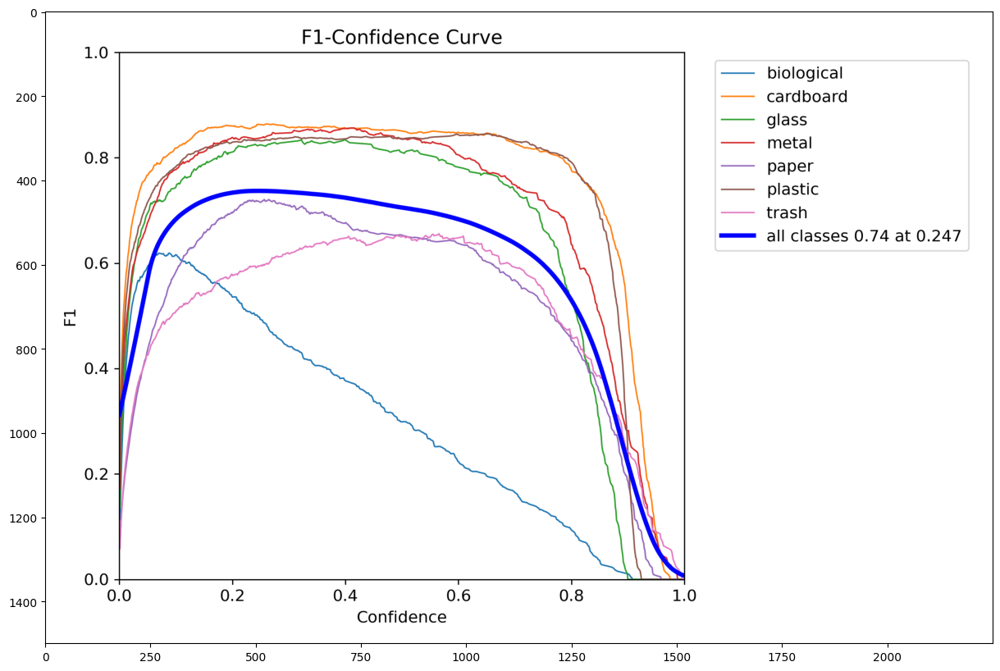

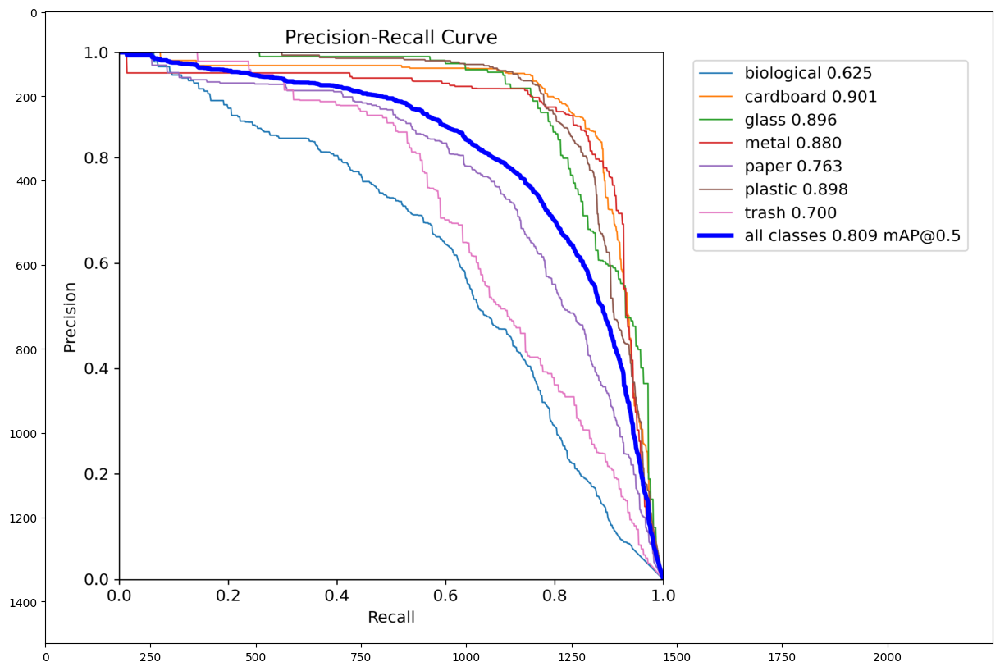

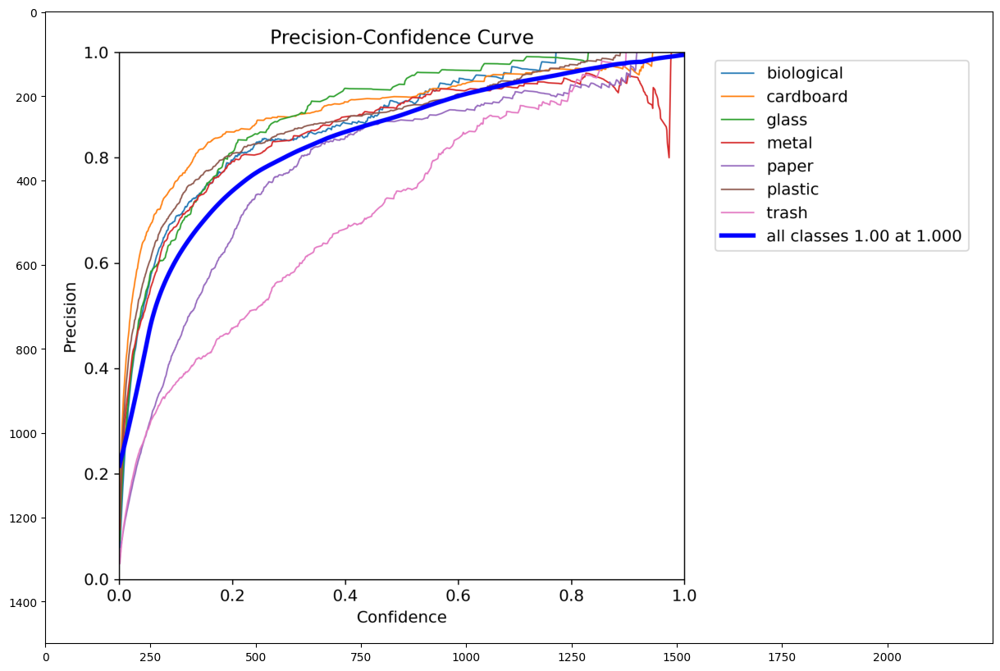

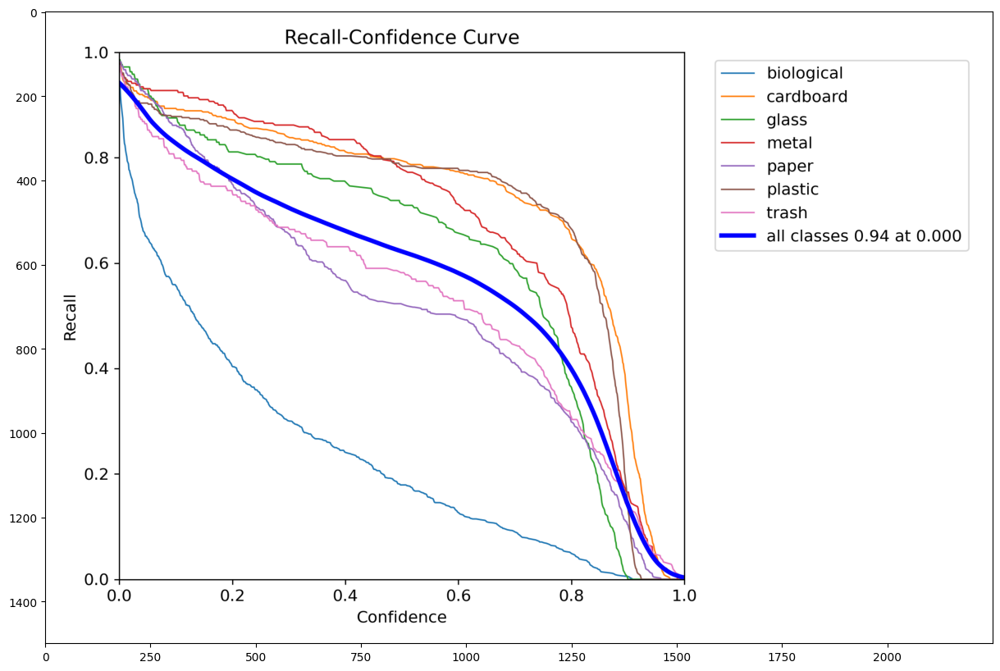

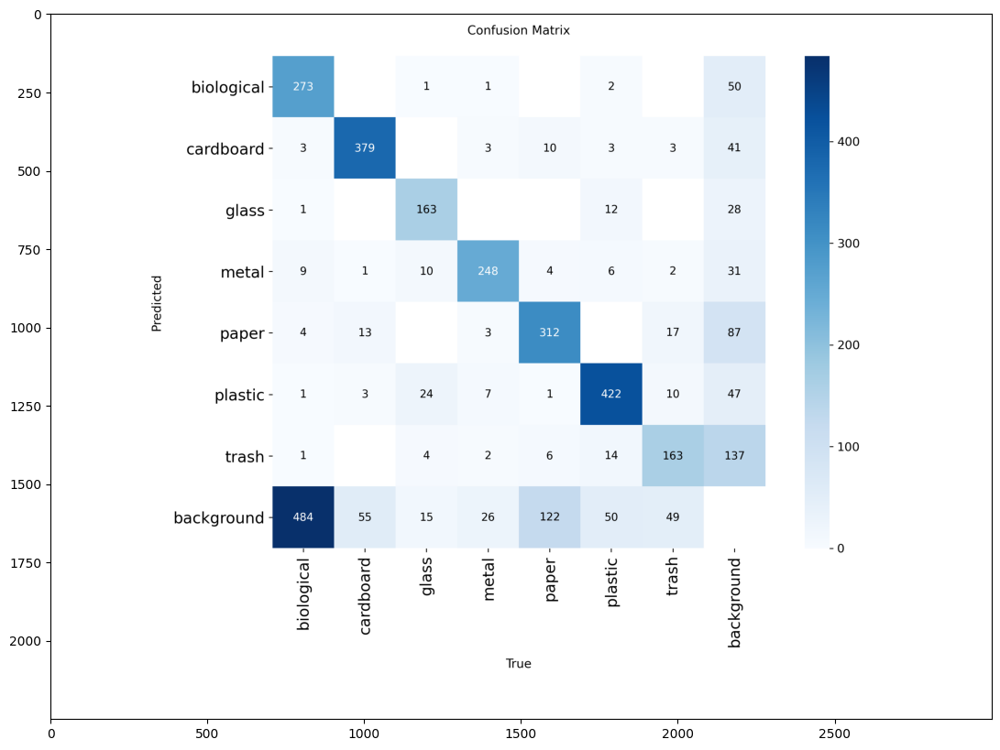

...

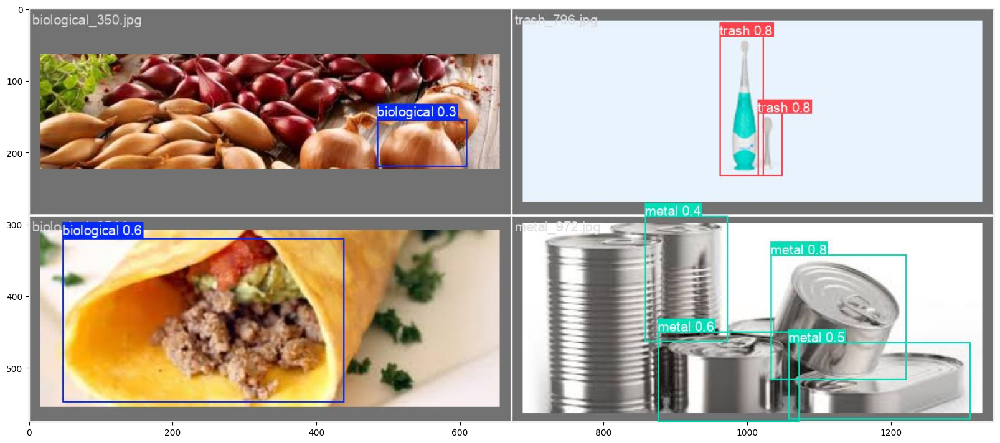

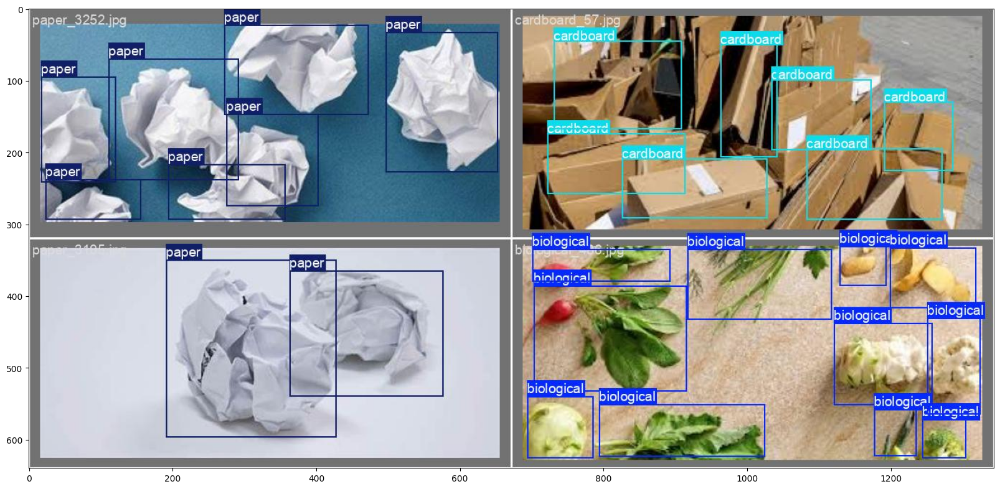

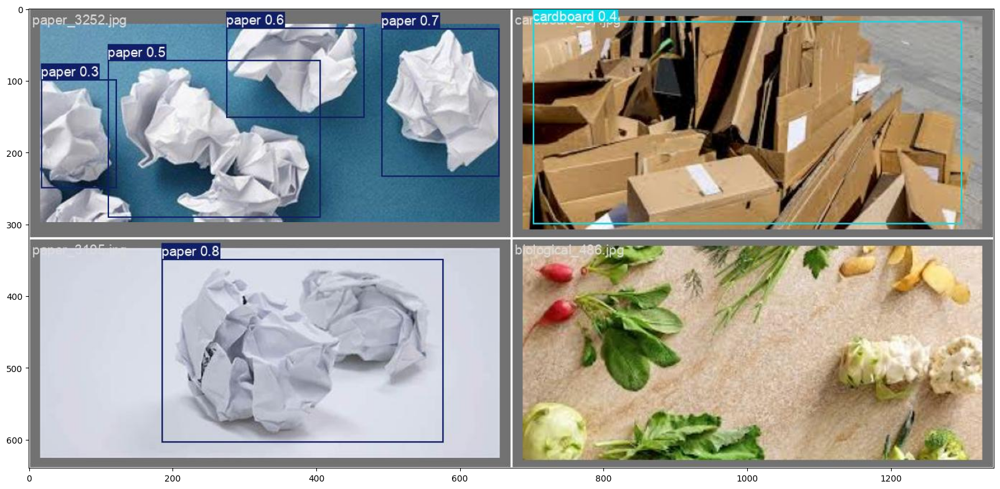

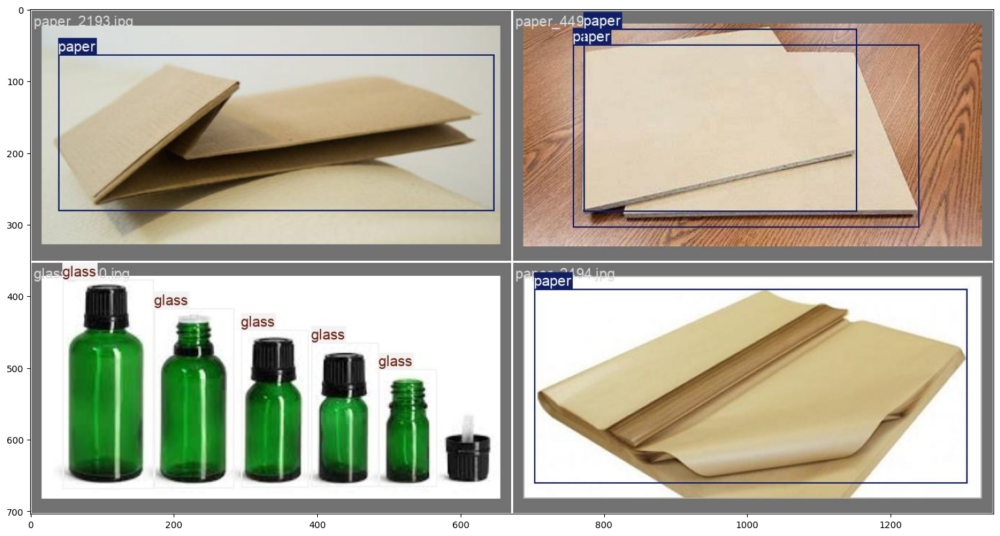

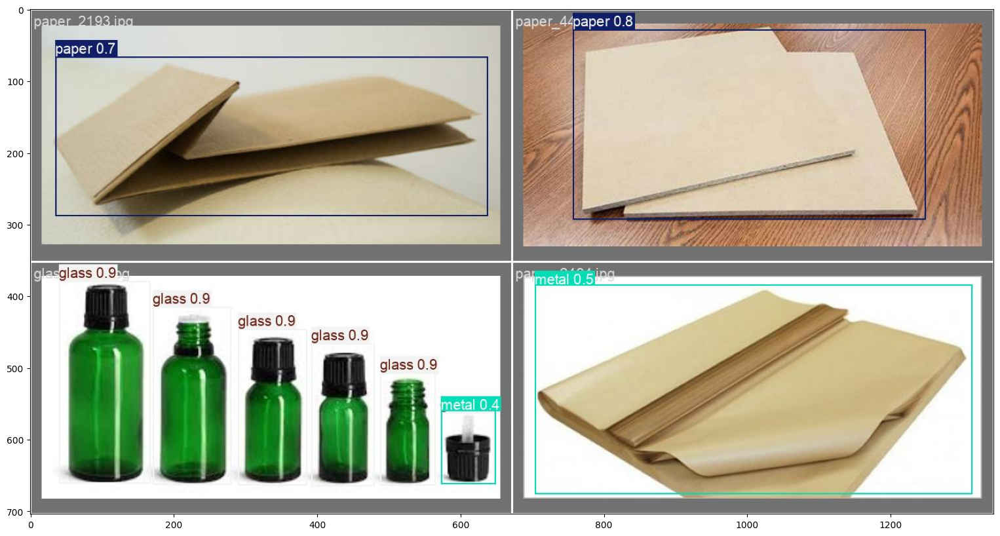

In [35]:
from PIL import Image
import glob

tpaths2=[]
for dirname, _, filenames in os.walk('/kaggle/working/runs/detect/train'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])


for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

[codecarbon WARNING @ 22:34:19] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 22:34:19] [setup] RAM Tracking...
[codecarbon INFO @ 22:34:19] [setup] CPU Tracking...


✅ Found 8896 images in class folders


[codecarbon WARNING @ 22:34:20] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 22:34:20] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 22:34:20] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon WARNING @ 22:34:20] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 22:34:20] [setup] GPU Tracking...
[codecarbon INFO @ 22:34:20] Tracking Nvidia GPU via pynvml
[codecarbon WARNING @ 22:34:20] You have 2 GPUs but we will monitor only 1 ([0]) of them. Check your configuration.
[codecarbon INFO @ 22:34:20] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation model
                CPU Tracking Method: global constant
                GPU Tracking Method: 


image 1/1 /kaggle/working/combined_dataset/metal/metal_1386.jpg: 640x640 5 metals, 7.4ms
Speed: 2.4ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict


[codecarbon INFO @ 22:34:23] Energy consumed for RAM : 0.000001 kWh. RAM Power : 20.0 W
[codecarbon INFO @ 22:34:23] Delta energy consumed for CPU with constant : 0.000001 kWh, power : 42.5 W
[codecarbon INFO @ 22:34:23] Energy consumed for All CPU : 0.000001 kWh
[codecarbon INFO @ 22:34:23] Energy consumed for all GPUs : 0.000001 kWh. Total GPU Power : 31.05981637293462 W
[codecarbon INFO @ 22:34:23] 0.000003 kWh of electricity used since the beginning.



First image inference time: 0.1133 seconds
Deploy Model Carbon Emissions for first image: 0.000001 kg

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_1386.jpg


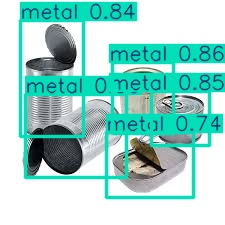


image 1/1 /kaggle/working/combined_dataset/cardboard/cardboard_699.jpg: 640x640 1 cardboard, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/cardboard/cardboard_699.jpg


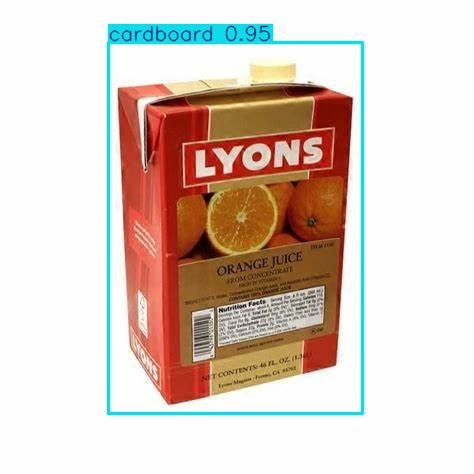


image 1/1 /kaggle/working/combined_dataset/metal/metal_2010.jpg: 480x640 1 metal, 35.4ms
Speed: 2.4ms preprocess, 35.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_2010.jpg


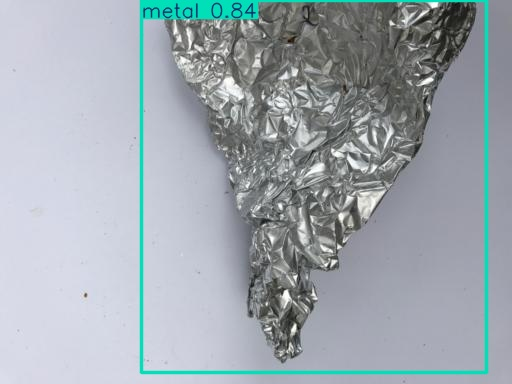


image 1/1 /kaggle/working/combined_dataset/paper/paper_2378.jpg: 224x640 1 paper, 36.0ms
Speed: 1.0ms preprocess, 36.0ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/paper/paper_2378.jpg


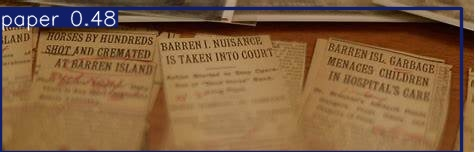


image 1/1 /kaggle/working/combined_dataset/cardboard/cardboard_1341.jpg: 640x448 1 cardboard, 37.6ms
Speed: 2.6ms preprocess, 37.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/cardboard/cardboard_1341.jpg


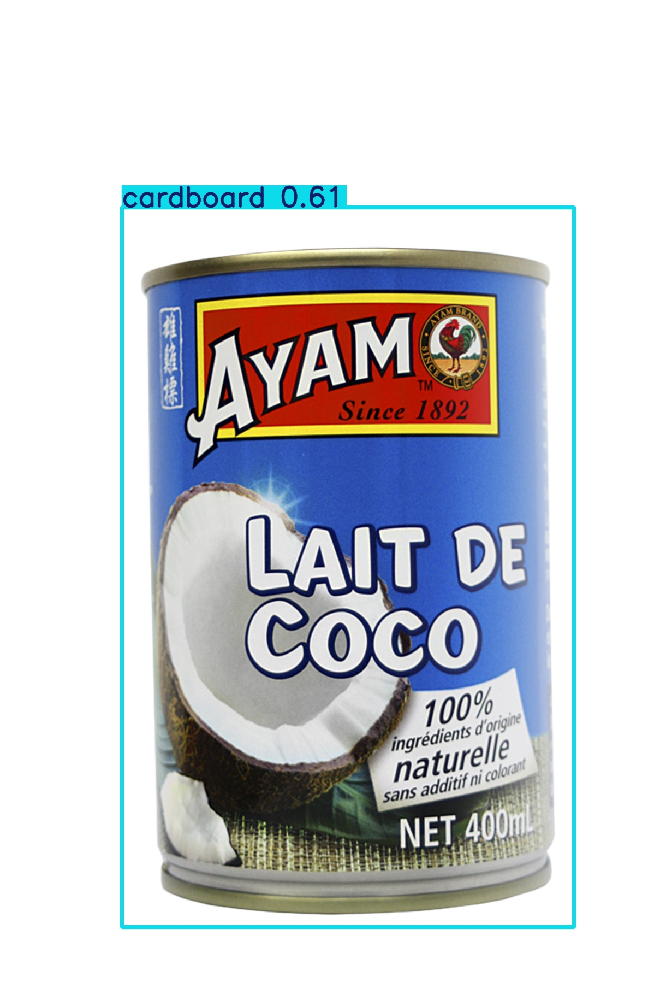


image 1/1 /kaggle/working/combined_dataset/glass/glass_575.jpg: 640x640 1 glass, 8.2ms
Speed: 2.0ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/glass/glass_575.jpg


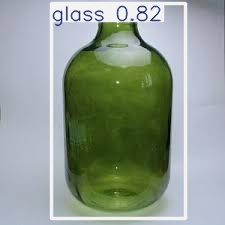


image 1/1 /kaggle/working/combined_dataset/metal/metal_2592.jpg: 480x640 1 metal, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/metal/metal_2592.jpg


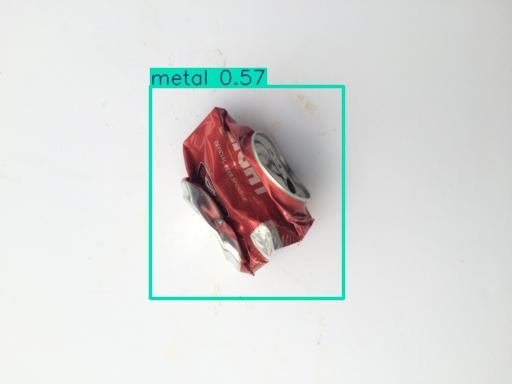


image 1/1 /kaggle/working/combined_dataset/cardboard/cardboard_1619.jpg: 384x640 1 cardboard, 34.5ms
Speed: 1.3ms preprocess, 34.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/cardboard/cardboard_1619.jpg


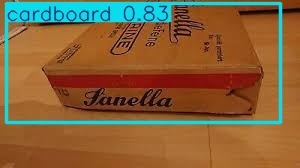


image 1/1 /kaggle/working/combined_dataset/paper/paper_1172.jpg: 448x640 2 papers, 32.4ms
Speed: 1.7ms preprocess, 32.4ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/paper/paper_1172.jpg


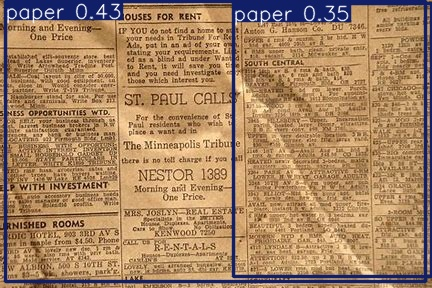


image 1/1 /kaggle/working/combined_dataset/paper/paper_1063.jpg: 640x640 1 paper, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict

📸 Displaying results for: /kaggle/working/combined_dataset/paper/paper_1063.jpg


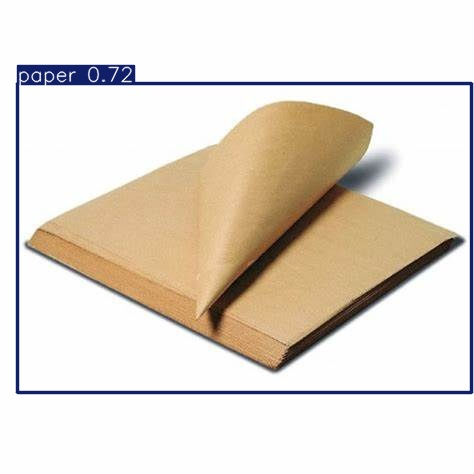

In [36]:
from pathlib import Path 
# Load the trained YOLO model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  # Update the path if needed

# Step 1: Collect all image paths recursively from class folders
image_paths = glob.glob("/kaggle/working/combined_dataset/*/*.jpg")
image_paths += glob.glob("/kaggle/working/combined_dataset/*/*.jpeg")
image_paths += glob.glob("/kaggle/working/combined_dataset/*/*.png")

print(f"✅ Found {len(image_paths)} images in class folders")

# Step 2: Select 10 random images
random_images = random.sample(image_paths, min(10, len(image_paths)))

# Run inference on each image and display results
for idx, image_path in enumerate(random_images):
    # Start emissions tracking only for the first image
    if idx == 0:
        deploy_model_emission_tracker = EmissionsTracker()
        deploy_model_emission_tracker.start()
        start_time = time.time()
    # Inference
    results = model(image_path, save=True)

    # Stop emissions tracking for the first image
    if idx == 0:
        deploy_model_emissions = deploy_model_emission_tracker.stop()
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"\nFirst image inference time: {elapsed_time:.4f} seconds")
        print(f"Deploy Model Carbon Emissions for first image: {deploy_model_emissions:.6f} kg")

    # Get the output image path and display
    # ✅ FIXED: Use Path object for joining paths
    output_image_path = Path(results[0].save_dir) / image_path.split("/")[-1]
    print(f"\n📸 Displaying results for: {image_path}")
    display(Image.open(output_image_path))

## Memory profiling
This script runs inference on random images from class folders, measuring inference time and CPU memory usage for each. It shows predictions visually with correct guesses in green and prints detailed profiling info per image, helping you assess your model’s real-world performance and resource use.

In [37]:
import os, gc, time, random, glob
import psutil, tracemalloc

def profile_yolov8_inference(model, image_paths, num_images=10):
    process = psutil.Process(os.getpid())

    inference_times = []
    rss_deltas = []
    peak_memories = []

    plt.figure(figsize=(20, 15))

    for i, image_path in enumerate(random.sample(image_paths, min(num_images, len(image_paths)))):
        img = Image.open(image_path).convert("RGB")

        if i == 0:
            # Warm-up
            model(image_path)

        gc.collect()
        tracemalloc.start()
        start_mem = process.memory_info().rss / (1024 ** 2)
        start_time = time.time()

        results = model(image_path)

        end_time = time.time()
        end_mem = process.memory_info().rss / (1024 ** 2)
        current, peak = tracemalloc.get_traced_memory()
        tracemalloc.stop()

        # Collect metrics
        inference_time = end_time - start_time
        rss_delta = end_mem - start_mem
        peak_memory = peak / 1024 / 1024

        inference_times.append(inference_time)
        rss_deltas.append(rss_delta)
        peak_memories.append(peak_memory)

        # Visual display (optional)
        plt.subplot(2, (num_images + 1) // 2, i + 1)
        plt.imshow(img)
        plt.title(f"{os.path.basename(image_path)}\nTime: {inference_time:.2f}s", fontsize=10)
        plt.axis("off")

        print(f"Image {i+1}: {image_path}")
        print(f"  Inference Time        : {inference_time:.4f} seconds")
        print(f"  Start RSS Memory      : {start_mem:.6f} MB")
        print(f"  End RSS Memory        : {end_mem:.6f} MB")
        print(f"  Memory Used (RSS)     : {rss_delta:.6f} MB")
        print(f"  Peak Traced Memory    : {peak_memory:.2f} MB\n")

        del img
        gc.collect()

    plt.tight_layout()
    plt.show()

    print("\n---- Average Metrics ----")
    print(f"Average Inference Time     : {np.mean(inference_times):.4f} seconds")
    print(f"Average RSS Memory Used    : {np.mean(rss_deltas):.6f} MB")
    print(f"Average Peak Traced Memory : {np.mean(peak_memories):.2f} MB")



image 1/1 /kaggle/working/combined_dataset/plastic/plastic_1979.jpg: 640x480 1 plastic, 35.3ms
Speed: 1.3ms preprocess, 35.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/working/combined_dataset/plastic/plastic_1979.jpg: 640x480 1 plastic, 12.7ms
Speed: 2.1ms preprocess, 12.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)
Image 1: /kaggle/working/combined_dataset/plastic/plastic_1979.jpg
  Inference Time        : 0.0290 seconds
  Start RSS Memory      : 2660.468750 MB
  End RSS Memory        : 2660.468750 MB
  Memory Used (RSS)     : 0.000000 MB
  Peak Traced Memory    : 2.65 MB


image 1/1 /kaggle/working/combined_dataset/biological/biological_975.jpg: 480x640 1 biological, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Image 2: /kaggle/working/combined_dataset/biological/biological_975.jpg
  Inference Time        : 0.0247 seconds
  Start RSS Memory      : 2660.468750

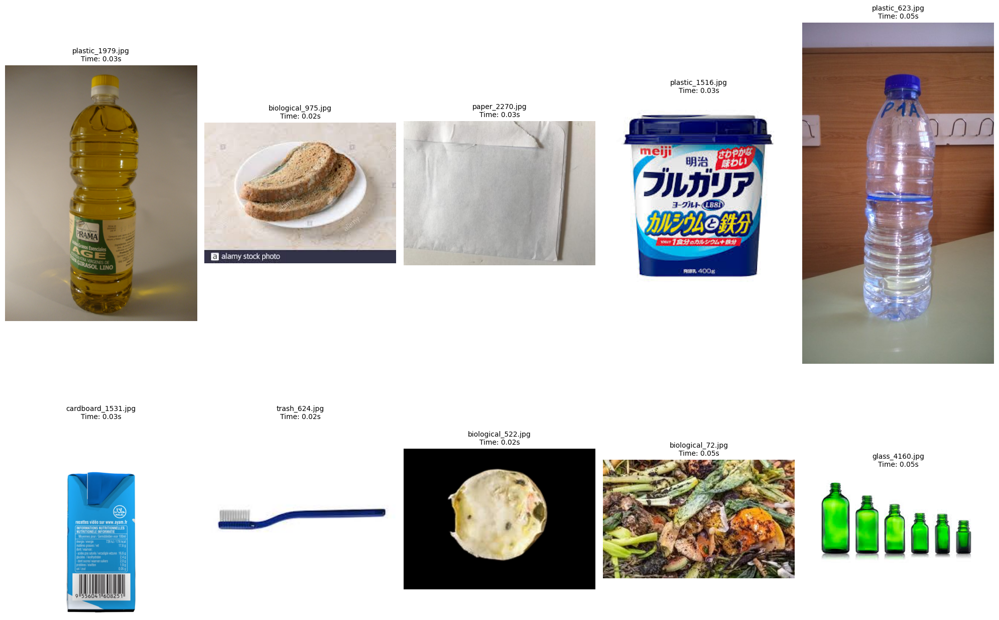


---- Average Metrics ----
Average Inference Time     : 0.0343 seconds
Average RSS Memory Used    : 0.000000 MB
Average Peak Traced Memory : 2.40 MB


In [38]:
profile_yolov8_inference(model, image_paths)